# Credit Risk Analysis by using Machine Learning

### Exploratory Data Analysis (EDA)

#### Muhammad Nadeem
C00221923@itcarlow.ie

EDA is an open - ended process in which the statistics are calculated, and frames are created to identify trends, unusual people, patterns, or relationships. The main area of EDA is to identify what we can tell us about our data. It usually begins with a large overview and then narrows to certain areas as fascinating areas of the data are to be found. The outcome could be in our interest, or it will help us to gain insight of our modelling choices, for example by helping us decide which features to use.

# Libraries

In [1]:
# Import our libraries we are going to use for our data analysis.
#import tensorflow as tf
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt


# Plotly visualizations
from plotly import tools
import plotly.plotly as py
import plotly.figure_factory as ff
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)


# For oversampling Library (Dealing with Imbalanced Datasets)
#from imblearn.over_sampling import SMOTE
#from collections import Counter

# File system manangement
import os

# Deletion  of warning
import warnings
warnings.filterwarnings('ignore')

% matplotlib inline

# Reading Data Files

In [2]:
# List files in folder
print(os.listdir("C:/Users/mrferozi/Desktop/Thesis 2019/Dataset/home-credit-default-risk"))

['application_test-t1.dif', 'application_test-t1.txt', 'application_test.csv', 'application_test1.csv', 'application_train.csv', 'application_train1.csv', 'bureau.csv', 'bureau_balance.csv', 'credit_card_balance.csv', 'home1.csv', 'HomeCredit_columns_description.csv', 'installments_payments.csv', 'POS_CASH_balance.csv', 'previous_application.csv', 'sample_submission.csv', 'test.sql', 'train2.csv']


# Home credit default risk Dataset
References:* From the German Credit Risk Analysis : A Gentle Introduction: [ A Gentle Introduction ](https://www.kaggle.com/willkoehrsen/start-here-a-gentle-introduction)*

In [3]:
# Display Training data
df1 = pd.read_csv('C:/Users/mrferozi/Desktop/Thesis 2019/Dataset/home-credit-default-risk/application_train.csv')
print('Shape of the Traning dataset: ', df1.shape)
df1.head()

Shape of the Traning dataset:  (307511, 122)


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


Training dataset consist of 307511 Tuples and 122 observations

In [4]:
# remove multiple rows at once (axis=0 refers to rows)
df1.drop(df1.columns[30:122],axis=1, inplace=True)

In [5]:
print('Shape of the Traning dataset: ', df1.shape)

Shape of the Traning dataset:  (307511, 30)


In [6]:
# Display Test data
df2 = pd.read_csv('C:/Users/mrferozi/Desktop/Thesis 2019/Dataset/home-credit-default-risk/application_test.csv')
print('Shape of the Traning dataset: ', df2.shape)
df2.head()

Shape of the Traning dataset:  (48744, 121)


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
# remove multiple rows at once (axis=0 refers to rows)
df2.drop(df2.columns[30:122],axis=1, inplace=True)
print('Shape of the Test datasee: ', df2.shape)
df2.head()

Shape of the Test datasee:  (48744, 30)


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,NaN,1,1,0,1,0,1,NaN,2.0,2
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,NaN,1,1,0,1,0,0,Low-skill Laborers,2.0,2
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,5.0,1,1,0,1,0,0,Drivers,2.0,2
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,NaN,1,1,0,1,1,0,Sales staff,4.0,2
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,16.0,1,1,1,1,0,0,NaN,3.0,2


Training dataset consist of 48744 Tuples and 121 observations

# German Credit risk dataset

References:* From the German Credit Risk Analysis : Beginner's Guide: [ Beginner's Guide ](https://www.kaggle.com/pahulpreet/german-credit-risk-analysis-beginner-s-guide/notebook)*

In [8]:
#Reading Dataset from  http://archive.ics.uci.edu/ml/machine-learning-databases/statlog/german/german.data
df=pd.read_csv("C:/Users/mrferozi/Desktop/Thesis 2019/Dataset/German_credit_risk/german.data",sep=" ",header=None)
headers=["Status of existing checking account","Duration in month","Credit history",\
         "Purpose","Credit amount","Savings account/bonds","Present employment since",\
         "Installment rate in percentage of disposable income","Gender",\
         "Other debtors / guarantors","Present residence since","Property","Age in years",\
        "Other installment plans","Housing","Number of existing credits at this bank",\
        "Job","Number of people being liable to provide maintenance for","Telephone","foreign worker","Target"]
df.columns=headers

#save as csv file
#df.to_csv(('C:\\Users\\mrferozi\\Desktop\\Thesis 2019\\Dataset\\German_credit_risk\\German_credit_risk.csv'),index=False);

### Column Decoding

Status_of_existing_checking_account
- no checking account represent by  0
- <0 DM represent by 1
- 0 <= <200 DM represent by 2
- '>=' 200 DM represent by 3

In [9]:
Status_of_existing_checking_account={'A14':"0",'A11':"1", 'A12': "2",'A13':"3"}
df["Status of existing checking account"]=df["Status of existing checking account"].map(Status_of_existing_checking_account)

Credit_history
- critical account represent by  0
- delay in paying off represent by 1
- existing credits paid back duly till now represent by 2
- all credits at this bank paid back duly represent by 3
- no credits taken represent by 4

In [10]:
Credit_history={"A34":"0","A33":"1","A32":"2","A31":"3","A30":"4"}
df["Credit history"]=df["Credit history"].map(Credit_history)

Purpose
- car (new) represent by  0
- car (used) represent by 1
- furniture/equipment represent by 2
- radio/television represent by 3
- domestic appliances represent by 4
- repairs represent by  5
- education by 6
- vacation now represent by 7
- retraining represent by 8
- business represent by 9
- Other represent by 10

In [11]:
Purpose={"A40" : "0", "A41" : "1", "A42" : "2", "A43" :"3" , "A44" : "4", "A45" : "5", "A46" : "6", 'A47' : '7','A48' : '8','A49' : '9','A410' : '10'}
df["Purpose"]=df["Purpose"].map(Purpose)

Saving_account
- no savings account represent by  0
- <100 DM represent by 1
- 100 <= <500 DM represent by 2
- 500 <= < 1000 DM represent by 3
- '>=' 1000 DM represent by 4

In [12]:
Saving_account={"A65" : "0","A61" :"1","A62" : "2","A63" :"3", "A64" :"4"}
df["Savings account/bonds"]=df["Savings account/bonds"].map(Saving_account)

Present_employment
- '>=7' years represent by  8
- 4<= <7 years represent by 7
- 1<= < 4 years represent by 4
- <1 years represent by 1
- unemployed represent by 0

In [13]:
Present_employment={'A75':"8", 'A74':"7",  'A73':"4", 'A72':"1",'A71':"0"}
df["Present employment since"]=df["Present employment since"].map(Present_employment)

In [14]:
df['Martial_status']=df["Gender"]

In [15]:
df['Martial_status'].unique()

array(['A93', 'A92', 'A91', 'A94'], dtype=object)

Gender
- female:single represent by  1
- male:married/widowed represent by 2
- female:divorced/separated/married represent by 3
- male:divorced/separated represent by 4

In [16]:
Gender={ 'A95':"0",'A94':"1",'A93':"1", 'A92':"0", 'A91':"1"}
df["Gender"]=df["Gender"].map(Gender)

Martial_status
- female single represent by 1
- male:single represent by 2
- male:married/widowed represent by 3
- female:married/divorced/separated represent by 4

In [17]:
Martial_status={'A95':"0",'A94':"2",'A93':"1", 'A92':"3", 'A91':"4"}
df["Martial_status"]=df["Martial_status"].map(Martial_status)

In [18]:
df["Martial_status"].unique()

array(['1', '3', '4', '2'], dtype=object)

Other_debtors_guarantors
- none represent by  0
- co-applicant represent by 1
- guarantorrepresent by 2

In [19]:
Other_debtors_guarantors={'A101':"0", 'A102':"1", 'A103':"2"}
df["Other debtors / guarantors"]=df["Other debtors / guarantors"].map(Other_debtors_guarantors)

Property
- real estate represent by  0
- savings agreement/life insurance represent by 1
- car or other represent by 2
- unknown / no property represent by 3

In [20]:
Property={'A121':"0", 'A122':"1", 'A123':"2", 'A124':"3"}
df["Property"]=df["Property"].map(Property)

Other_installment_plans
- none represent by  0
- store represent by 1
- bank represent by 2

In [21]:
Other_installment_plans={'A143':"0", 'A142':"1", 'A141':"2"}
df["Other installment plans"]=df["Other installment plans"].map(Other_installment_plans)

Housing
- for free represent by  0
- own represent by 1
- rent represent by 2

In [22]:
Housing={'A153':"0", 'A152':"1", 'A151':"2"}
df["Housing"]=df["Housing"].map(Housing)

Job
- management/ highly qualified employee represent by  0
- skilled employee / official represent by 1
- unskilled - resident represent by 2
- unemployed/ unskilled  - non-resident represent by 3

In [23]:
Job={'A174':"0", 'A173':"1", 'A172':"2", 'A171':"3"}
df["Job"]=df["Job"].map(Job)

foreign_worker
- yes represent by  1
- no represent by 0

In [24]:
foreign_worker={'A201':"1", 'A202':"0"}
df["foreign worker"]=df["foreign worker"].map(foreign_worker)

Target
- 0:"Good Risk"
- 1:"Bad Risk"

In [25]:
risk={1:"Good Risk", 2:"Bad Risk"}
df["Target"]=df["Target"].map(risk)

In [26]:
risk={'Good Risk':"0", 'Bad Risk':"1"}
df["Target"]=df["Target"].map(risk)

In [27]:
df.drop('Telephone', axis=1, inplace=True)

In [28]:
df.dtypes

Status of existing checking account                         object
Duration in month                                            int64
Credit history                                              object
Purpose                                                     object
Credit amount                                                int64
Savings account/bonds                                       object
Present employment since                                    object
Installment rate in percentage of disposable income          int64
Gender                                                      object
Other debtors / guarantors                                  object
Present residence since                                      int64
Property                                                    object
Age in years                                                 int64
Other installment plans                                     object
Housing                                                     ob

### Rename  columns by using the 'rename' method

In [29]:
df.rename(columns={'Status of existing checking account':'Status_checking_account', 'Duration in month':'Duration_month'}, inplace=True)

In [30]:
df.rename(columns={'Credit history':'Credit_history', 'Credit amount':'Credit_amount'}, inplace=True)

In [31]:
df.rename(columns={'Savings account/bonds':'Savings_account/bonds', 'Present employment since':'Present_emp_lenght'}, inplace=True)

In [32]:
df.rename(columns={'Installment rate in percentage of disposable income':'Installment_rate%', 'Other debtors / guarantors':'Guarantors'}, inplace=True)

In [33]:
df.rename(columns={'Present residence since':'Present_res_lenght', 'Age in years':'Age'}, inplace=True)

In [34]:
df.rename(columns={'Other installment plans':'Other_installment_plans', 'Number of existing credits at this bank':'Number_Credit'}, inplace=True)

In [35]:
df.rename(columns={'Number of people being liable to provide maintenance for':'No_dependent', 'foreign worker':'foreign_worker'}, inplace=True)

In [36]:
df.shape

(1000, 21)

###  German Dataset (Target column)

In [37]:
p=df['Target'].value_counts()
print ('The loan paid on time by 0')
print ('The loan not paid on time by 1')
print ('-------------------------------',)
print (p)

The loan paid on time by 0
The loan not paid on time by 1
-------------------------------
0    700
1    300
Name: Target, dtype: int64


### Missing Values

In [38]:
# missing values
df.isnull().sum()

Status_checking_account    0
Duration_month             0
Credit_history             0
Purpose                    0
Credit_amount              0
Savings_account/bonds      0
Present_emp_lenght         0
Installment_rate%          0
Gender                     0
Guarantors                 0
Present_res_lenght         0
Property                   0
Age                        0
Other_installment_plans    0
Housing                    0
Number_Credit              0
Job                        0
No_dependent               0
foreign_worker             0
Target                     0
Martial_status             0
dtype: int64

In [39]:
#save as csv file
df.to_csv(('C:\\Users\\mrferozi\\Desktop\\Thesis 2019\\Dataset\\German_credit_risk\\German_credit_risk1.csv'),index=False);
#df2 = (pd.read_csv('C:/Users/mrferozi/Desktop/Thesis 2019/Dataset/German_credit_risk/German_credit_risk1.csv'),index=False);

In [40]:
df1=df
# preprocessing sklearn for categorical variables
from sklearn.preprocessing import LabelEncoder

tag_enc = LabelEncoder()
tag_count = 0

# Run through the columns
for col in df1:
    if df1[col].dtype == 'object':
        # If 2 or more unique categories
        if len(list(df1[col].unique())) <= 2:
            # Train  the training data
            tag_enc.fit(df1[col])
            # Transform both training and testing data
            df1[col] = tag_enc.transform(df1[col])
        
            # Follow the number of columns encoded for the label
            tag_count += 1
            
print('%d Label encoding of columns.' % tag_count)

3 Label encoding of columns.


In [41]:
# one-hot encoding of categorical variables
df1 = pd.get_dummies(df1)

print('German Dataset shape: ', df1.shape)


German Dataset shape:  (1000, 60)


In [42]:
df1.dtypes

Duration_month               int64
Credit_amount                int64
Installment_rate%            int64
Gender                       int64
Present_res_lenght           int64
Age                          int64
Number_Credit                int64
No_dependent                 int64
foreign_worker               int64
Target                       int64
Status_checking_account_0    uint8
Status_checking_account_1    uint8
Status_checking_account_2    uint8
Status_checking_account_3    uint8
Credit_history_0             uint8
Credit_history_1             uint8
Credit_history_2             uint8
Credit_history_3             uint8
Credit_history_4             uint8
Purpose_0                    uint8
Purpose_1                    uint8
Purpose_10                   uint8
Purpose_2                    uint8
Purpose_3                    uint8
Purpose_4                    uint8
Purpose_5                    uint8
Purpose_6                    uint8
Purpose_8                    uint8
Purpose_9           

### Saving Data into file

In [43]:
df1.to_csv(('C:\\Users\\mrferozi\\Desktop\\Thesis 2019\\Dataset\\German_credit_risk\\German_credit_risk_final.csv'),index=False);

In [44]:
German=df1

In [45]:
German.describe()

,Duration_month,Credit_amount,Installment_rate%,Gender,Present_res_lenght,Age,Number_Credit,No_dependent,foreign_worker,Target,...,Housing_1,Housing_2,Job_0,Job_1,Job_2,Job_3,Martial_status_1,Martial_status_2,Martial_status_3,Martial_status_4
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,...,1000.000000,1000.000000,1000.000000,1000.000000,1000.0000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000
mean,20.903000,3271.258000,2.973000,0.690000,2.845000,35.546000,1.407000,1.155000,0.963000,0.300000,...,0.713000,0.179000,0.148000,0.630000,0.2000,0.022000,0.54800,0.092000,0.310000,0.050000
std,12.058814,2822.736876,1.118715,0.462725,1.103718,11.375469,0.577654,0.362086,0.188856,0.458487,...,0.452588,0.383544,0.355278,0.483046,0.4002,0.146757,0.49794,0.289171,0.462725,0.218054
min,4.000000,250.000000,1.000000,0.000000,1.000000,19.000000,1.000000,1.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0000,0.000000,0.00000,0.000000,0.000000,0.000000
25%,12.000000,1365.500000,2.000000,0.000000,2.000000,27.000000,1.000000,1.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0000,0.000000,0.00000,0.000000,0.000000,0.000000
50%,18.000000,2319.500000,3.000000,1.000000,3.000000,33.000000,1.000000,1.000000,1.000000,0.000000,...,1.000000,0.000000,0.000000,1.000000,0.0000,0.000000,1.00000,0.000000,0.000000,0.000000
75%,24.000000,3972.250000,4.000000,1.000000,4.000000,42.000000,2.000000,1.000000,1.000000,1.000000,...,1.000000,0.000000,0.000000,1.000000,0.0000,0.000000,1.00000,0.000000,1.000000,0.000000
max,72.000000,18424.000000,4.000000,1.000000,4.000000,75.000000,4.000000,2.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.0000,1.000000,1.00000,1.000000,1.000000,1.000000


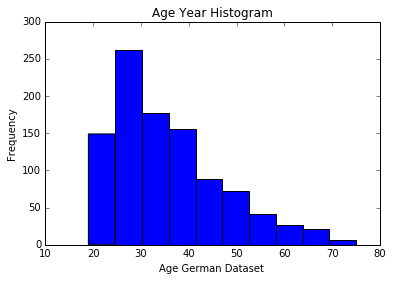

In [46]:
plt.figure(figsize = (6, 4))
German['Age'].plot.hist(title = 'Age Year Histogram');
plt.xlabel('Age German Dataset ');

### Estimate Correlations

In [47]:
# Find correlations with the target and sort
correlations = German.corr()['Target'].sort_values()

# Display correlations
print('Most Positive Correlations:\n', correlations.tail(15))
print('\nMost Negative Correlations:\n', correlations.head(15))

Most Positive Correlations:
 Housing_0                    0.081556
foreign_worker               0.082079
Housing_2                    0.092785
Other_installment_plans_2    0.096510
Purpose_0                    0.096900
Present_emp_lenght_1         0.106397
Status_checking_account_2    0.119581
Property_3                   0.125750
Credit_history_3             0.134448
Credit_history_4             0.144767
Credit_amount                0.154739
Savings_account/bonds_1      0.161007
Duration_month               0.214927
Status_checking_account_1    0.258333
Target                       1.000000
Name: Target, dtype: float64

Most Negative Correlations:
 Status_checking_account_0   -0.322436
Credit_history_0            -0.181713
Housing_1                   -0.134589
Savings_account/bonds_0     -0.129238
Property_0                  -0.119300
Other_installment_plans_0   -0.113285
Purpose_3                   -0.106922
Purpose_1                   -0.099791
Age                         -0.091127


### Correlation-heatmap

References:* correlation-heatmap: [ correlation-heatmap ](https://stackoverflow.com/questions/39409866/correlation-heatmap)*

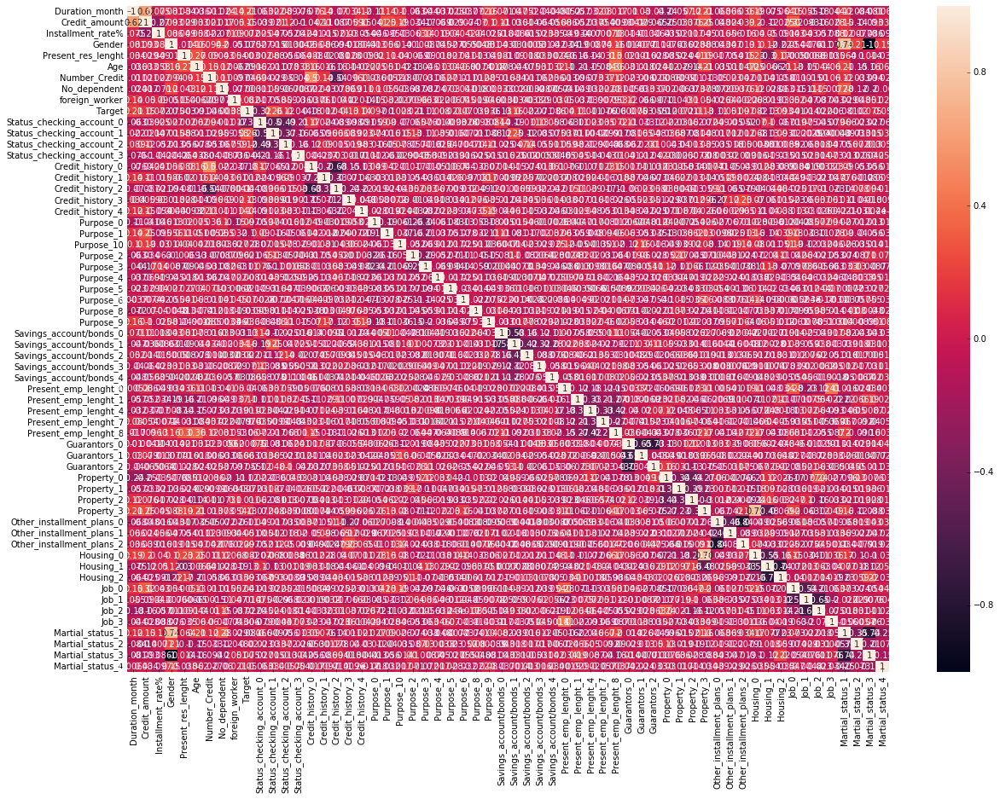

In [48]:
import seaborn as sns
plt.figure(figsize = (20, 14))
Var_Corr = German.corr()
# plot the heatmap and annotation on it
sns.heatmap(Var_Corr, xticklabels=Var_Corr.columns, yticklabels=Var_Corr.columns, annot=True)

There is a strong relation between Status of existing checking account and Present_emp_lenght which implies that client with longer time with bank are good in repayment than as compare to the people who’s are new client to the bank.

# Taiwan Credit risk dataset

References:* From the Taiwan Credit Risk Analysis : Beginner's Guide: [ Beginner's Guide ](https://www.kaggle.com/pahulpreet/german-credit-risk-analysis-beginner-s-guide/notebook)*

In [49]:
# Display data
Taiwan = pd.read_csv('C:/Users/mrferozi/Desktop/Thesis 2019/Dataset/Credit_Risk-master/Credit_Risk-master/credit_risk.csv')

print('Shape of the Taiwan Credit risk dataset: ', Taiwan.shape)
Taiwan.head()

Shape of the Taiwan Credit risk dataset:  (30000, 25)


,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Risk
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [50]:
Taiwan.shape

(30000, 25)

In [51]:
#create a new data frame
df = pd.DataFrame()
df['tot_bil_Amount']=Taiwan['BILL_AMT1'] +Taiwan['BILL_AMT2'] + Taiwan['BILL_AMT3'] + Taiwan['BILL_AMT4'] + Taiwan['BILL_AMT5'] + Taiwan['BILL_AMT6']
df['tot_pay_Amount']=Taiwan['PAY_AMT1'] +Taiwan['PAY_AMT2'] + Taiwan['PAY_AMT3'] + Taiwan['PAY_AMT4'] + Taiwan['PAY_AMT5'] + Taiwan['PAY_AMT6']
df['Credit_Amount']= (df['tot_bil_Amount'] -df['tot_pay_Amount'])
df['Credit_Amount']=df['Credit_Amount'].astype(int)
Taiwan['Credit_Amount']=df['Credit_Amount'].astype(int)

Taiwan credit risk dataset consist of 3000 Tuples and 25 observations

In [52]:
Taiwan.dtypes

ID                 int64
LIMIT_BAL        float64
SEX                int64
EDUCATION          int64
MARRIAGE           int64
AGE                int64
PAY_0              int64
PAY_2              int64
PAY_3              int64
PAY_4              int64
PAY_5              int64
PAY_6              int64
BILL_AMT1        float64
BILL_AMT2        float64
BILL_AMT3        float64
BILL_AMT4        float64
BILL_AMT5        float64
BILL_AMT6        float64
PAY_AMT1         float64
PAY_AMT2         float64
PAY_AMT3         float64
PAY_AMT4         float64
PAY_AMT5         float64
PAY_AMT6         float64
Risk               int64
Credit_Amount      int32
dtype: object

### Missing Values

In [53]:
# missing values
Taiwan.isnull().sum()

ID               0
LIMIT_BAL        0
SEX              0
EDUCATION        0
MARRIAGE         0
AGE              0
PAY_0            0
PAY_2            0
PAY_3            0
PAY_4            0
PAY_5            0
PAY_6            0
BILL_AMT1        0
BILL_AMT2        0
BILL_AMT3        0
BILL_AMT4        0
BILL_AMT5        0
BILL_AMT6        0
PAY_AMT1         0
PAY_AMT2         0
PAY_AMT3         0
PAY_AMT4         0
PAY_AMT5         0
PAY_AMT6         0
Risk             0
Credit_Amount    0
dtype: int64

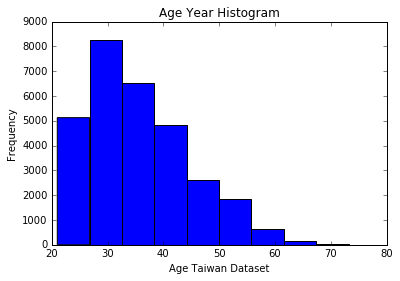

In [54]:
plt.figure(figsize = (6, 4))
Taiwan['AGE'].plot.hist(title = 'Age Year Histogram');
plt.xlabel('Age Taiwan Dataset');

### Display Taiwan data

In [55]:
# Display Taiwan data
p=Taiwan['Risk'].value_counts()
print ('The loan paid on time by 0')
print ('The loan not paid on time by 1')
print ('-------------------------------',)
print (p)

The loan paid on time by 0
The loan not paid on time by 1
-------------------------------
0    23364
1     6636
Name: Risk, dtype: int64


In [56]:
Taiwan.drop('ID', axis=1, inplace=True)

In [57]:
Taiwan.rename(columns={'Risk':'Target'}, inplace=True)

In [58]:
# Find correlations with the target and sort
correlations = Taiwan.corr()['Target'].sort_values()

# Display correlations
print('Most Positive Correlations:\n', correlations.tail(15))
print('\nMost Negative Correlations:\n', correlations.head(15))

Most Positive Correlations:
 BILL_AMT2       -0.014193
BILL_AMT3       -0.014076
BILL_AMT4       -0.010156
BILL_AMT5       -0.006760
BILL_AMT6       -0.005372
Credit_Amount    0.003879
AGE              0.013890
EDUCATION        0.028006
PAY_6            0.186866
PAY_5            0.204149
PAY_4            0.216614
PAY_3            0.235253
PAY_2            0.263551
PAY_0            0.324794
Target           1.000000
Name: Target, dtype: float64

Most Negative Correlations:
 LIMIT_BAL   -0.153458
PAY_AMT1    -0.072929
PAY_AMT2    -0.058579
PAY_AMT4    -0.056827
PAY_AMT3    -0.056250
PAY_AMT5    -0.055124
PAY_AMT6    -0.053183
SEX         -0.039961
MARRIAGE    -0.024339
BILL_AMT1   -0.019644
BILL_AMT2   -0.014193
BILL_AMT3   -0.014076
BILL_AMT4   -0.010156
BILL_AMT5   -0.006760
BILL_AMT6   -0.005372
Name: Target, dtype: float64


### Estimate Correlations

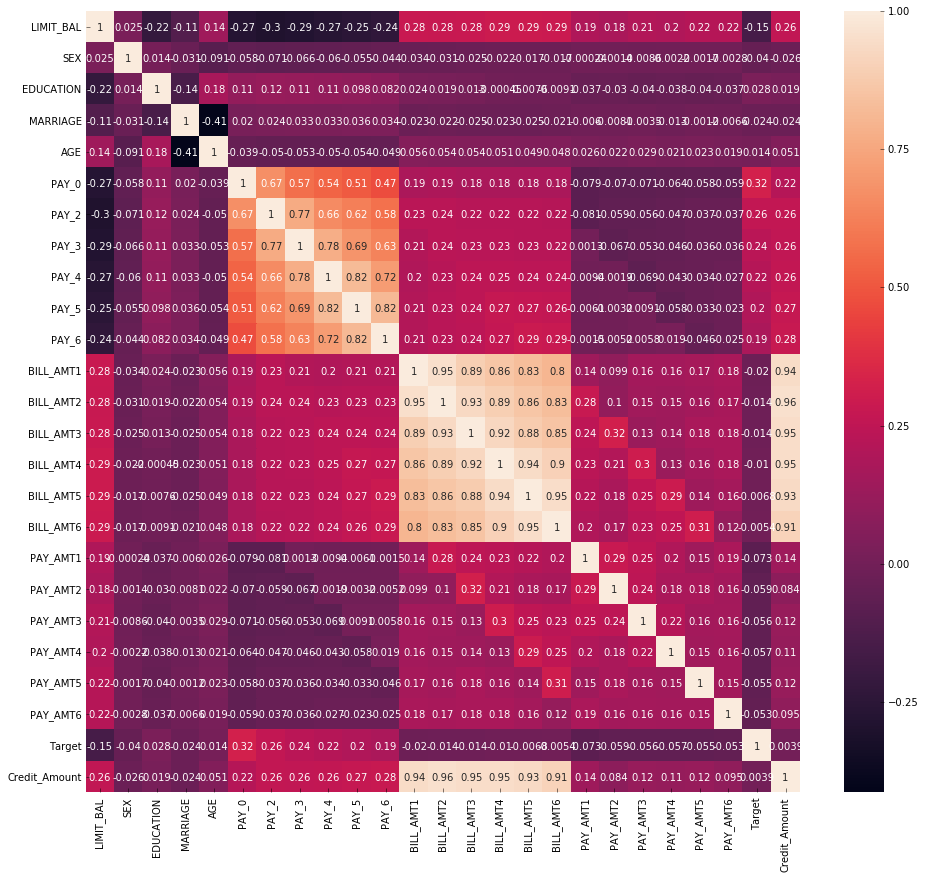

In [59]:
import seaborn as sns
plt.figure(figsize = (16, 14))
Var_Corr =Taiwan.corr()
# plot the heatmap and annotation on it
sns.heatmap(Var_Corr, xticklabels=Var_Corr.columns, yticklabels=Var_Corr.columns, annot=True)

###  Home Group Dataset (Target column)

The main question this study trying to answer here : The loan paid on time by zero or the client did not paid on time by 1. The amount of loan in each category can be examined first.

In [60]:
# Display Training data
df1 = pd.read_csv('C:/Users/mrferozi/Desktop/Thesis 2019/Dataset/home-credit-default-risk/application_train1.csv')
p=df1['TARGET'].value_counts()
print ('The loan paid on time by 0')
print ('The loan not paid on time by 1')
print ('-------------------------------',)
print (p)

The loan paid on time by 0
The loan not paid on time by 1
-------------------------------
0    282686
1     24825
Name: TARGET, dtype: int64


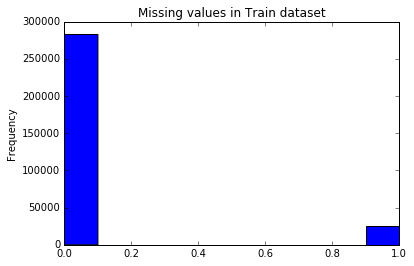

In [61]:
import matplotlib.pyplot as plt
import seaborn as sns
% matplotlib inline
df1['TARGET'].astype(int).plot.hist(title="Missing values in Train dataset")

### Missing Values

Number of missing values in each column

In [62]:
# missing values
df1.isnull().sum()

SK_ID_CURR                         0
TARGET                             0
NAME_CONTRACT_TYPE                 0
CODE_GENDER                        0
FLAG_OWN_CAR                       0
FLAG_OWN_REALTY                    0
CNT_CHILDREN                       0
AMT_INCOME_TOTAL                   0
AMT_CREDIT                         0
AMT_ANNUITY                       12
AMT_GOODS_PRICE                  278
NAME_TYPE_SUITE                 1292
NAME_INCOME_TYPE                   0
NAME_EDUCATION_TYPE                0
NAME_FAMILY_STATUS                 0
NAME_HOUSING_TYPE                  0
REGION_POPULATION_RELATIVE         0
DAYS_BIRTH                         0
DAYS_EMPLOYED                      0
DAYS_REGISTRATION                  0
DAYS_ID_PUBLISH                    0
OWN_CAR_AGE                   202929
FLAG_MOBIL                         0
FLAG_EMP_PHONE                     0
FLAG_WORK_PHONE                    0
FLAG_CONT_MOBILE                   0
FLAG_PHONE                         0
F

In [63]:
# Function to count missing values 
def dataset_missing_values(df):
        # Total missing values
        noval = df.isnull().sum()
        
        # Percentage of missing values
        noval_per = 100 * df.isnull().sum() / len(df)
        
        # create a table with the results
        noval_dataset = pd.concat([noval, noval_per], axis=1)
        
        # Rename the columns
        noval_dataset_rename_columns = noval_dataset.rename(
        columns = {0 : 'No Values', 1 : 'Missing Values in %'})
        
        # Sort the table by percentage
        noval_dataset_rename_columns = noval_dataset_rename_columns[
            noval_dataset_rename_columns.iloc[:,1] != 0].sort_values(
        'Missing Values in %', ascending=False).round(1)
        
        # Summary information
        print ("The dataset has " + str(df.shape[1]) + " columns.\n"      
            "There are " + str(noval_dataset_rename_columns.shape[0]) +
              " columns that have no values.")
        
        # Return the dataframe with missing information
        return noval_dataset_rename_columns
        
    

In [64]:
missing_values = dataset_missing_values(df1)

The dataset has 30 columns.
There are 6 columns that have no values.


In [65]:
df1['OCCUPATION_TYPE'].fillna(value='Unknown', inplace=True)

In [66]:
missing_values = dataset_missing_values(df1)

The dataset has 30 columns.
There are 5 columns that have no values.


In [67]:
df1.isnull().sum()

SK_ID_CURR                         0
TARGET                             0
NAME_CONTRACT_TYPE                 0
CODE_GENDER                        0
FLAG_OWN_CAR                       0
FLAG_OWN_REALTY                    0
CNT_CHILDREN                       0
AMT_INCOME_TOTAL                   0
AMT_CREDIT                         0
AMT_ANNUITY                       12
AMT_GOODS_PRICE                  278
NAME_TYPE_SUITE                 1292
NAME_INCOME_TYPE                   0
NAME_EDUCATION_TYPE                0
NAME_FAMILY_STATUS                 0
NAME_HOUSING_TYPE                  0
REGION_POPULATION_RELATIVE         0
DAYS_BIRTH                         0
DAYS_EMPLOYED                      0
DAYS_REGISTRATION                  0
DAYS_ID_PUBLISH                    0
OWN_CAR_AGE                   202929
FLAG_MOBIL                         0
FLAG_EMP_PHONE                     0
FLAG_WORK_PHONE                    0
FLAG_CONT_MOBILE                   0
FLAG_PHONE                         0
F

In [68]:
missing_values = dataset_missing_values(df2)

The dataset has 30 columns.
There are 4 columns that have no values.


In [69]:
df2.isnull().sum()

SK_ID_CURR                        0
NAME_CONTRACT_TYPE                0
CODE_GENDER                       0
FLAG_OWN_CAR                      0
FLAG_OWN_REALTY                   0
CNT_CHILDREN                      0
AMT_INCOME_TOTAL                  0
AMT_CREDIT                        0
AMT_ANNUITY                      24
AMT_GOODS_PRICE                   0
NAME_TYPE_SUITE                 911
NAME_INCOME_TYPE                  0
NAME_EDUCATION_TYPE               0
NAME_FAMILY_STATUS                0
NAME_HOUSING_TYPE                 0
REGION_POPULATION_RELATIVE        0
DAYS_BIRTH                        0
DAYS_EMPLOYED                     0
DAYS_REGISTRATION                 0
DAYS_ID_PUBLISH                   0
OWN_CAR_AGE                   32312
FLAG_MOBIL                        0
FLAG_EMP_PHONE                    0
FLAG_WORK_PHONE                   0
FLAG_CONT_MOBILE                  0
FLAG_PHONE                        0
FLAG_EMAIL                        0
OCCUPATION_TYPE             

### Column datatype

In [70]:
# Number of each data type of column
df1.dtypes.value_counts()

int64      12
object     10
float64     8
dtype: int64

In [71]:
# Number of each data type of column
df2.dtypes.value_counts()

int64      12
object     10
float64     8
dtype: int64

### Encoding Variables

In [72]:
# preprocessing sklearn for categorical variables
from sklearn.preprocessing import LabelEncoder

tag_enc = LabelEncoder()
tag_count = 0

# Run through the columns
for col in df1:
    if df1[col].dtype == 'object':
        # If 2 or more unique categories
        if len(list(df1[col].unique())) <= 2:
            # Train  the training data
            tag_enc.fit(df1[col])
            # Transform both training and testing data
            df1[col] = tag_enc.transform(df1[col])
            df2[col] = tag_enc.transform(df2[col])
        
            # Follow the number of columns encoded for the label
            tag_count += 1
            
print('%d Label encoding of columns.' % tag_count)

3 Label encoding of columns.


In [73]:
# hot encoding of single Categorical variables 
df1= pd.get_dummies(df1)
df2 = pd.get_dummies(df2)

print('Train dataset column shape: ', df1.shape)
print('Test dataset column shape: ', df2.shape)

train=df1
test=df2

Train dataset column shape:  (307511, 77)
Test dataset column shape:  (48744, 73)


In [74]:
train.dtypes

SK_ID_CURR                                   int64
TARGET                                       int64
NAME_CONTRACT_TYPE                           int64
FLAG_OWN_CAR                                 int64
FLAG_OWN_REALTY                              int64
CNT_CHILDREN                                 int64
AMT_INCOME_TOTAL                           float64
AMT_CREDIT                                 float64
AMT_ANNUITY                                float64
AMT_GOODS_PRICE                            float64
REGION_POPULATION_RELATIVE                 float64
DAYS_BIRTH                                   int64
DAYS_EMPLOYED                                int64
DAYS_REGISTRATION                          float64
DAYS_ID_PUBLISH                              int64
OWN_CAR_AGE                                float64
FLAG_MOBIL                                   int64
FLAG_EMP_PHONE                               int64
FLAG_WORK_PHONE                              int64
FLAG_CONT_MOBILE               

### Aligning Test Dataset  with  Train Datset 

In both train and testing data, the same functionality (columns) must be present. More columns have been created by a hot encoding in training data since certain categories were not part of the the test data. We must line up the data set to exclude the columns in the training data that are not in the test data.In the start of the process, the target column is pulled out from the training data (because this is not the test data, but this information must be retained). When we align, we must ensure that we axis= 1' to align the dataset according to columns rather than rows.

In [75]:
train_tag = train['TARGET']

# Retain common column in both dataframes
train, test = train.align(test, join = 'inner', axis = 1)

# Add the target back in
train['TARGET'] = train_tag

print('Train dataset  shape: ', train.shape)
print('Test dataset shape: ', test.shape)

Train dataset  shape:  (307511, 73)
Test dataset shape:  (48744, 72)


### Abnormality (anomalies)

There always good few issues we always look in our dataset. Specially, when we performing EDA is anomalies in the dataset. These can be due to wrong numbers, equipment, measurement, typing errors or they can be valid but extreme measurements. It is a good practice to support anomalies numericly is by looking at the statistics of a column using the `designate` method

In [76]:
(train['DAYS_BIRTH'] / -365).describe()

count    307511.000000
mean         43.936973
std          11.956133
min          20.517808
25%          34.008219
50%          43.150685
75%          53.923288
max          69.120548
Name: DAYS_BIRTH, dtype: float64

The column of ' DAYS BIRTH ' is negative as the applications for the current loan are recorded. In order to see those statistics in years, the total no of days in a 12 months can multiply by -1.

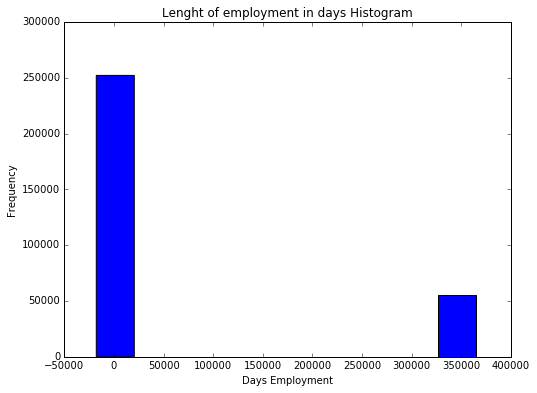

In [77]:
plt.figure(figsize = (8, 6))
train['DAYS_EMPLOYED'].plot.hist(title = 'Lenght of employment in days Histogram');
plt.xlabel('Days Employment');

### Checking abnormality of over all clients

In [78]:
abnormal = train[train['DAYS_EMPLOYED'] == 365243]
normal = train[train['DAYS_EMPLOYED'] != 365243]
a=(100 * normal['TARGET'].mean())
b= (100 * abnormal['TARGET'].mean())
c=len(abnormal)
print('The normal default on %0.2f%% of loans' % (100 * normal['TARGET'].mean()))
print('The Abnormality default on %0.2f%% of loans' % (100 * abnormal['TARGET'].mean()))
print('There are %d Abnormality days of employment' % len(abnormal))

The normal default on 8.66% of loans
The Abnormality default on 5.40% of loans
There are 55374 Abnormality days of employment


The result shows  that the abnormalities have a lower rate of non-payment.

### Handling the anomalies

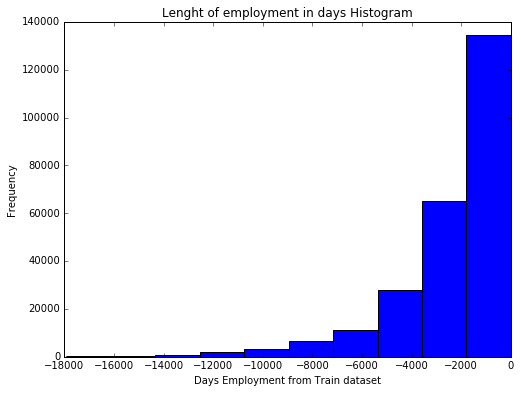

In [79]:
# Setting a  anomaly flag column
plt.figure(figsize = (8, 6))

train['DAYS_EMPLOYED_ANOM'] = train["DAYS_EMPLOYED"] == 365243

# change the anomaloy values with nan
train['DAYS_EMPLOYED'].replace({365243: np.nan}, inplace = True)

train['DAYS_EMPLOYED'].plot.hist(title = 'Lenght of employment in days Histogram');
plt.xlabel('Days Employment from Train dataset');

It is quite significant that whatever change we made in test dataset we also have to do everything with the training data. Let us ensure that we create a new column and add "np. nan" to the test data in the existing column.

In [80]:
test['DAYS_EMPLOYED_ANOM'] = test["DAYS_EMPLOYED"] == 365243
test["DAYS_EMPLOYED"].replace({365243: np.nan}, inplace = True)

print('There are %d abnormality in the test data out of %d entries' % (test["DAYS_EMPLOYED_ANOM"].sum(), len(test)))

There are 9274 abnormality in the test data out of 48744 entries


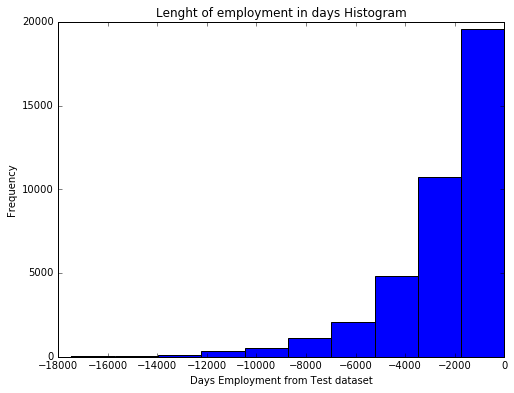

In [81]:
plt.figure(figsize = (8, 6))
test['DAYS_EMPLOYED'].plot.hist(title = 'Lenght of employment in days Histogram');
plt.xlabel('Days Employment from Test dataset');

The distribution seems to be much more same with the expectations.

### Estimate Correlations

Correlation is a count of the statistics describing the association of the random variables. It is possible to calculate correlation coefficient by using several methods, each count various types of association strength. This study will use Pearson, the utmost regularly used coefficient of correlation. The direct association between continuous variable measures Pearson's association. This coefficient counts the amount to which a link can be defined by a line between two variables. This research will use the .corrdataframe method to count the Pearson association constant between each variable and the target.

#### Home Group Dataset

In [82]:
cols = ['TARGET','Age']
df = pd.DataFrame(columns=cols)
df['TARGET']=train['TARGET']
df['Age']=(train['DAYS_BIRTH']* -1/ 365).astype(int)
train['Age']=df['Age']
train.drop('SK_ID_CURR', axis=1, inplace=True)
test.drop('SK_ID_CURR', axis=1, inplace=True)

In [83]:
# Evaluate correlations 
corr = train.corr()['TARGET'].sort_values()

# Display correlations
print(' Correlations +ve :\n', corr.tail(15))
print('\nCorrelations-ve :\n', corr.head(15))
x=corr.tail(15)
y=corr.head(15)
correlation = train.corr(method='pearson')

 Correlations +ve :
 OCCUPATION_TYPE_Low-skill Laborers                   0.027591
FLAG_WORK_PHONE                                      0.028524
NAME_HOUSING_TYPE_With parents                       0.029966
OCCUPATION_TYPE_Drivers                              0.030303
OWN_CAR_AGE                                          0.037612
DAYS_REGISTRATION                                    0.041975
OCCUPATION_TYPE_Laborers                             0.043019
FLAG_EMP_PHONE                                       0.045982
NAME_EDUCATION_TYPE_Secondary / secondary special    0.049824
DAYS_ID_PUBLISH                                      0.051457
CODE_GENDER_M                                        0.054713
NAME_INCOME_TYPE_Working                             0.057481
DAYS_EMPLOYED                                        0.074958
DAYS_BIRTH                                           0.078239
TARGET                                               1.000000
Name: TARGET, dtype: float64

Correlations-ve :
 

In [84]:
p=train['TARGET'].value_counts()
print ('The loan paid on time by 0')
print ('The loan not paid on time by 1')
print ('-------------------------------',)
print (p)

The loan paid on time by 0
The loan not paid on time by 1
-------------------------------
0    282686
1     24825
Name: TARGET, dtype: int64


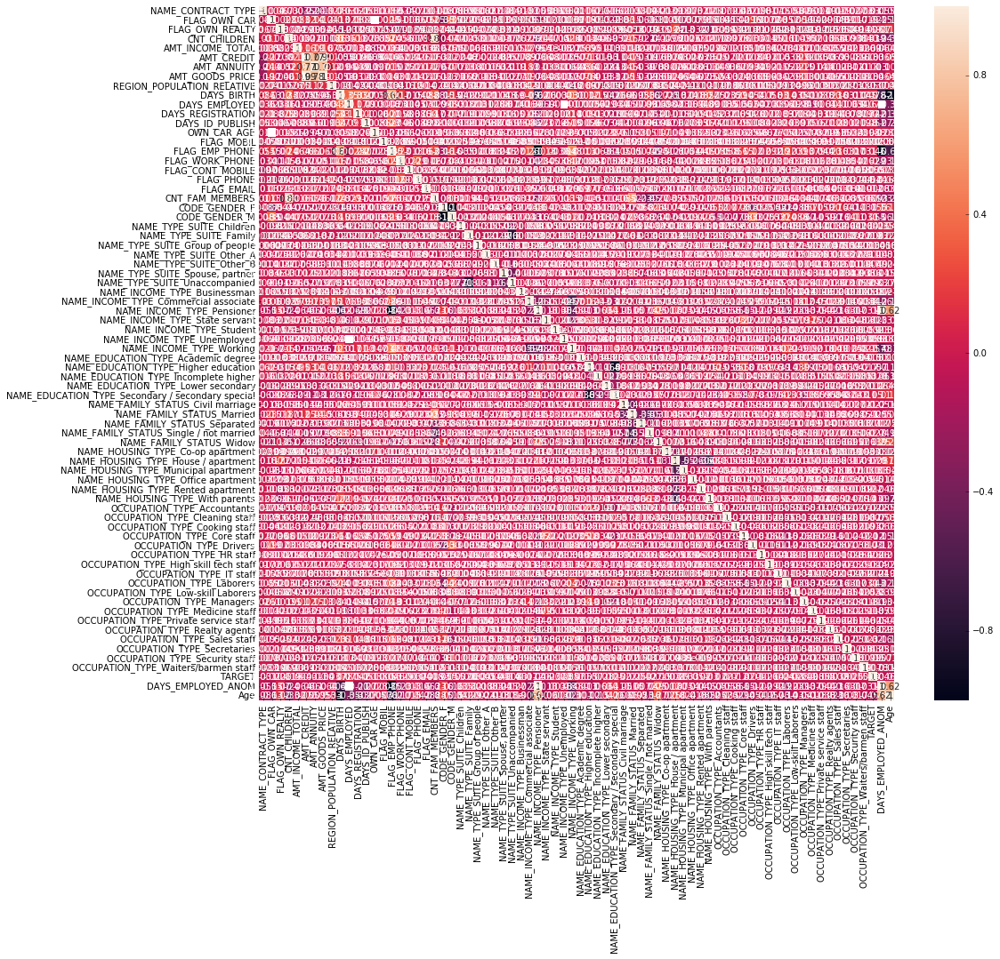

In [85]:
import seaborn as sns
plt.figure(figsize = (16, 14))
Var_Corr =train.corr()
# plot the heatmap and annotation on it
sns.heatmap(Var_Corr, xticklabels=Var_Corr.columns, yticklabels=Var_Corr.columns, annot=True)

In [86]:
# Evaluate correlations 
corr = train.corr()['TARGET'].sort_values()

x=corr.tail(15)
y=corr.head(15)
correlation = train.corr(method='pearson')

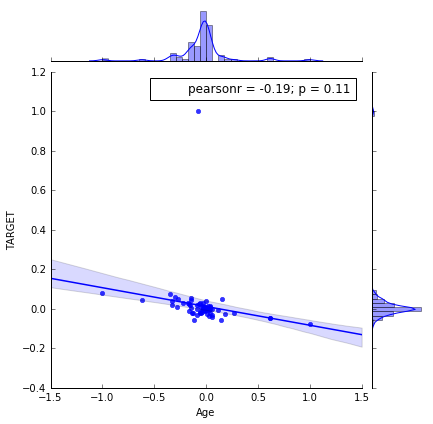

In [87]:
plt.figure(figsize = (10, 8))
sns.jointplot(x="Age", y="TARGET", data=correlation, kind="reg");

In [88]:
# Find the correlation of the positive gender and target
train['CODE_GENDER_F'] = abs(train['CODE_GENDER_F'])
train['CODE_GENDER_F'].corr(train['TARGET'])

-0.054704053178808019

In [89]:
# Evaluate correlations 
corr = train.corr()['TARGET'].sort_values()

# Display correlations
print(' Correlations +ve :\n', corr.tail(15))
print('\nCorrelations-ve :\n', corr.head(15))
x=corr.tail(15)
y=corr.head(15)
correlation = train.corr(method='pearson')

 Correlations +ve :
 OCCUPATION_TYPE_Low-skill Laborers                   0.027591
FLAG_WORK_PHONE                                      0.028524
NAME_HOUSING_TYPE_With parents                       0.029966
OCCUPATION_TYPE_Drivers                              0.030303
OWN_CAR_AGE                                          0.037612
DAYS_REGISTRATION                                    0.041975
OCCUPATION_TYPE_Laborers                             0.043019
FLAG_EMP_PHONE                                       0.045982
NAME_EDUCATION_TYPE_Secondary / secondary special    0.049824
DAYS_ID_PUBLISH                                      0.051457
CODE_GENDER_M                                        0.054713
NAME_INCOME_TYPE_Working                             0.057481
DAYS_EMPLOYED                                        0.074958
DAYS_BIRTH                                           0.078239
TARGET                                               1.000000
Name: TARGET, dtype: float64

Correlations-ve :
 

In [90]:
# Find the correlation of the positive gender and target
train['CODE_GENDER_M'] = abs(train['CODE_GENDER_M'])
train['CODE_GENDER_M'].corr(train['TARGET'])

0.05471268197127184

In [91]:
train.dtypes

NAME_CONTRACT_TYPE                           int64
FLAG_OWN_CAR                                 int64
FLAG_OWN_REALTY                              int64
CNT_CHILDREN                                 int64
AMT_INCOME_TOTAL                           float64
AMT_CREDIT                                 float64
AMT_ANNUITY                                float64
AMT_GOODS_PRICE                            float64
REGION_POPULATION_RELATIVE                 float64
DAYS_BIRTH                                   int64
DAYS_EMPLOYED                              float64
DAYS_REGISTRATION                          float64
DAYS_ID_PUBLISH                              int64
OWN_CAR_AGE                                float64
FLAG_MOBIL                                   int64
FLAG_EMP_PHONE                               int64
FLAG_WORK_PHONE                              int64
FLAG_CONT_MOBILE                             int64
FLAG_PHONE                                   int64
FLAG_EMAIL                     

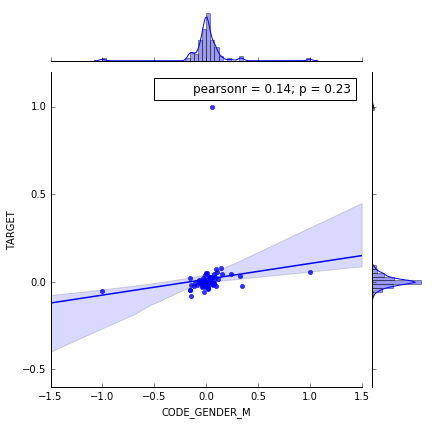

In [92]:
plt.figure(figsize = (10, 8))
sns.jointplot(x="CODE_GENDER_M", y="TARGET", data=correlation, kind="reg");

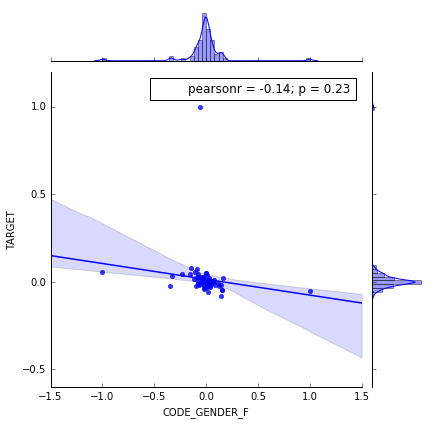

In [93]:
plt.figure(figsize = (10, 8))
sns.jointplot(x="CODE_GENDER_F", y="TARGET", data=correlation, kind="reg");

### Taiwan Dataset

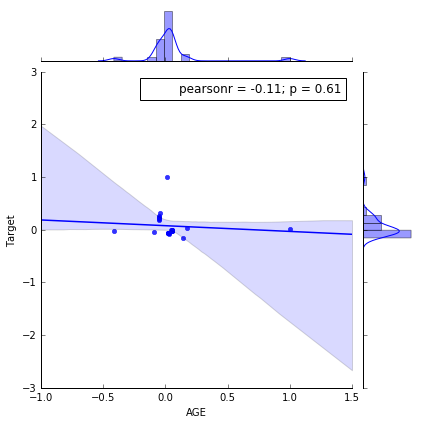

In [94]:
# Evaluate correlations 
corr = Taiwan.corr()['Target'].sort_values()
correlation = Taiwan.corr(method='pearson')
Taiwan['AGE'] =Taiwan['AGE'].astype(int)
plt.figure(figsize = (10, 8))
sns.jointplot(x="AGE", y="Target", data=correlation, kind="reg");

In [95]:
German.dtypes

Duration_month               int64
Credit_amount                int64
Installment_rate%            int64
Gender                       int64
Present_res_lenght           int64
Age                          int64
Number_Credit                int64
No_dependent                 int64
foreign_worker               int64
Target                       int64
Status_checking_account_0    uint8
Status_checking_account_1    uint8
Status_checking_account_2    uint8
Status_checking_account_3    uint8
Credit_history_0             uint8
Credit_history_1             uint8
Credit_history_2             uint8
Credit_history_3             uint8
Credit_history_4             uint8
Purpose_0                    uint8
Purpose_1                    uint8
Purpose_10                   uint8
Purpose_2                    uint8
Purpose_3                    uint8
Purpose_4                    uint8
Purpose_5                    uint8
Purpose_6                    uint8
Purpose_8                    uint8
Purpose_9           

#### German Dataset

In [96]:
German.Age.head(4)

0    67
1    22
2    49
3    45
Name: Age, dtype: int64

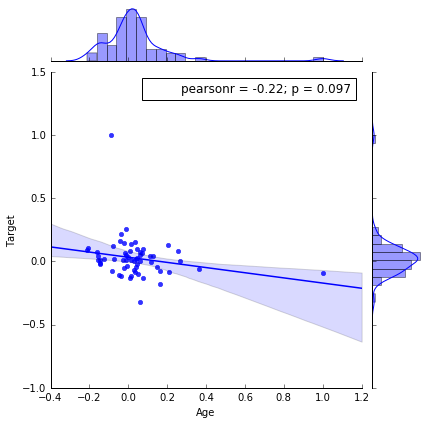

In [97]:
# Evaluate correlations 
corr = German.corr()['Target'].sort_values()
correlation = German.corr(method='pearson')
German['Age'] =German['Age'].astype(int)
plt.figure(figsize = (10, 8))
sns.jointplot(x="Age", y="Target", data=correlation, kind="reg");

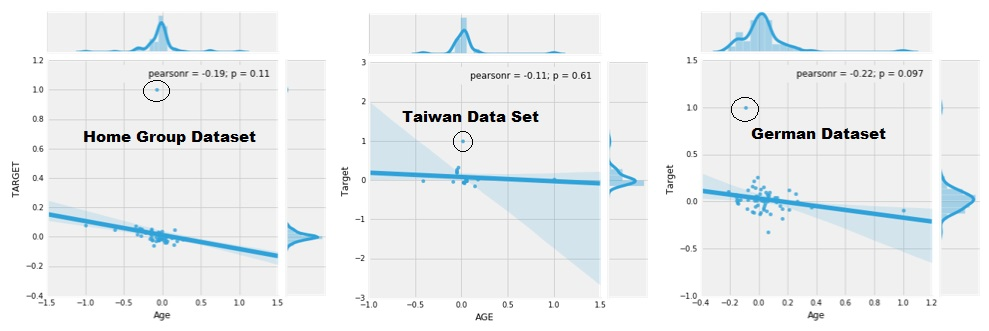

In [98]:
from IPython.display import Image
Image(filename='C:/Users/mrferozi/Desktop/Thesis 2019/Img/corr2.jpg') 

A standard strength of the direct connection between two variables is the coefficient of correlation between Pearson's product moment. It is presumed as the Pearson association or the association coefficient. The association coefficient is not sufficiently safe as the connection between the variables is not one - dimensional. The sign for Pearson's association is "ρ" when it is evaluated in the population and "r" when it is evaluated in a sample. Since the work is about exclusively sampling, we will use "r," unless otherwise marked, to represent Pearson's correlation. Pearson's range can be between minus one and 1. A r about minus one shows a perfect direct negative relationship between variables, A r of zero displays that here is not at all direct association   between variables, and a r of one shows a perfect direct positive relationship (Lane, et. al, 2016).
Figure 18 is displaying the negative relationship between age and loan default. From Home Group dataset where Pearsonr= -0.19 and the population value is  p = 0.11.  In Taiwan dataset the trend is quite different and interesting the Pearsonr =  -0.11 and the population value is  p = 0.061.The German dataset the Pearsonr =  -0.22 and the population value is  p = 0.097. The value of r in minus point 1 mean that there still a chance in old age of loan default in Taiwan Dataset.   The German dataset is quite similar as Home Group Dataset. It is displaying that the more mature customer means less chance of loan default. 


### Outliers with Home Group Dataset

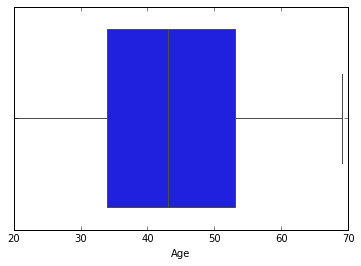

In [99]:
import seaborn as sns
plt.figure(figsize = (6, 4))
sns.boxplot(x=train['Age'])

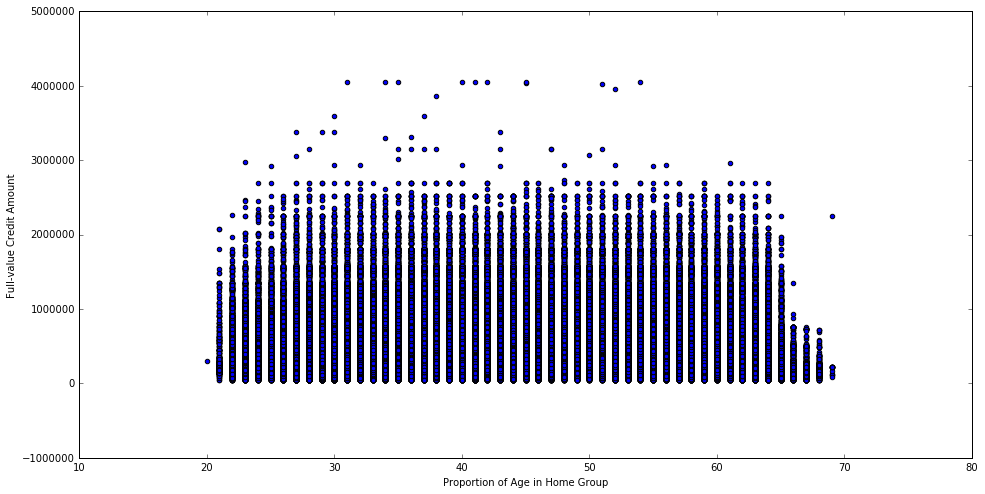

In [100]:
fig, ax = plt.subplots(figsize=(16,8))
ax.scatter(train['Age'], train['AMT_CREDIT'])
ax.set_xlabel('Proportion of Age in Home Group')
ax.set_ylabel('Full-value Credit Amount')
plt.show()

### Outliers with German Dataset

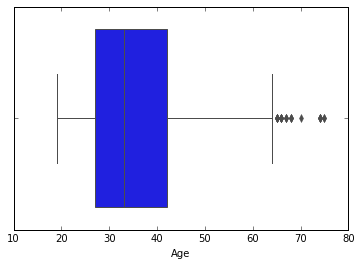

In [101]:
import seaborn as sns
plt.figure(figsize = (6, 4))
sns.boxplot(x=German['Age'])

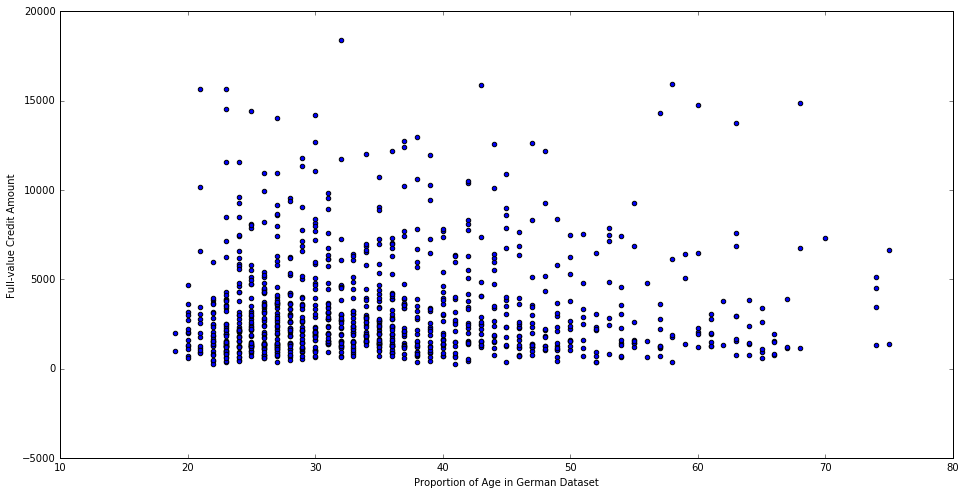

In [102]:
fig, ax = plt.subplots(figsize=(16,8))
ax.scatter(German['Age'], German['Credit_amount'])
ax.set_xlabel('Proportion of Age in German Dataset')
ax.set_ylabel('Full-value Credit Amount')
plt.show()

### Outliers with Taiwan Dataset

In [103]:
Taiwan.head()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Target,Credit_Amount
0,20000.0,2,2,1,24,2,2,-1,-1,-2,...,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1,7015
1,120000.0,2,2,2,26,-1,2,0,0,0,...,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1,12077
2,90000.0,2,2,2,34,0,0,0,0,0,...,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0,90635
3,50000.0,2,2,1,37,0,0,0,0,0,...,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0,222946
4,50000.0,1,2,1,57,-1,0,-1,0,0,...,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0,50290


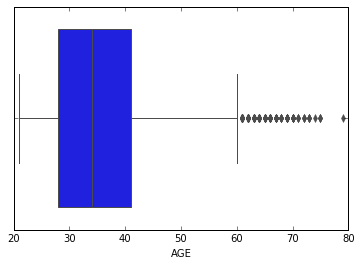

In [104]:
import seaborn as sns
plt.figure(figsize = (6, 4))
sns.boxplot(x=Taiwan['AGE'])

In [105]:
Taiwan['AGE'].unique()

array([24, 26, 34, 37, 57, 29, 23, 28, 35, 51, 41, 30, 49, 39, 40, 27, 47,
       33, 32, 54, 58, 22, 25, 31, 46, 42, 43, 45, 56, 44, 53, 38, 63, 36,
       52, 48, 55, 60, 50, 75, 61, 73, 59, 21, 67, 66, 62, 70, 72, 64, 65,
       71, 69, 68, 79, 74], dtype=int64)

In [106]:
cols = ['AGE','Credit_Amount']
df = pd.DataFrame(columns=cols)
df['AGE']=Taiwan['AGE'].astype(int)
df['Credit_Amount']=Taiwan['Credit_Amount'].astype(int)

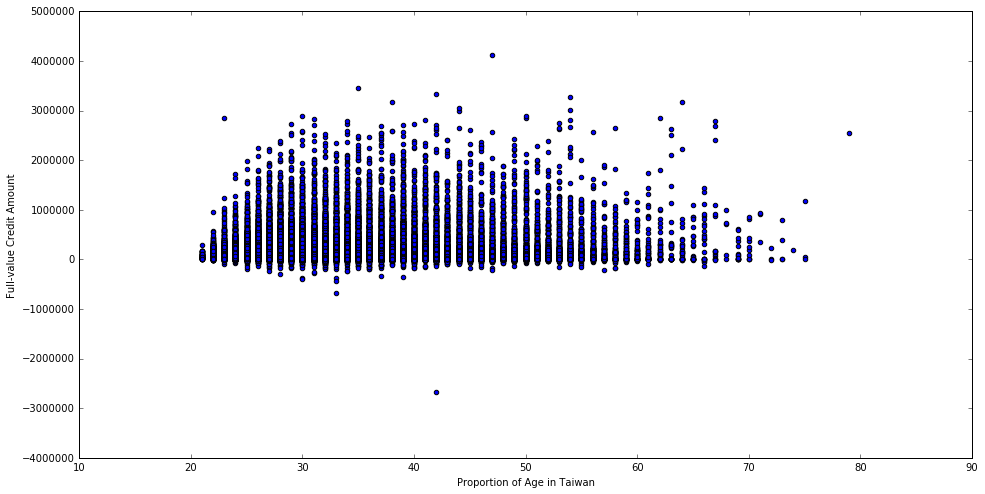

In [107]:
fig, ax = plt.subplots(figsize=(16,8))
ax.scatter(df['AGE'], df['Credit_Amount'])
ax.set_xlabel('Proportion of Age in Taiwan')
ax.set_ylabel('Full-value Credit Amount')
plt.show()

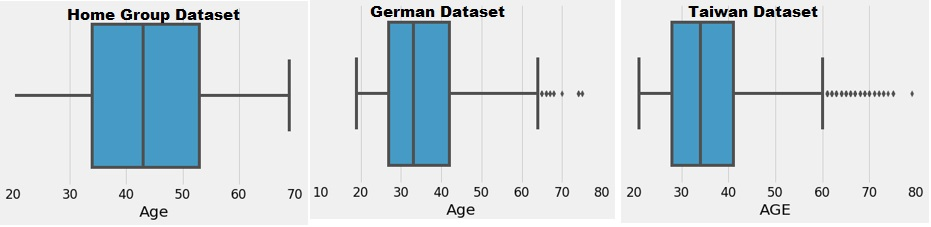

In [108]:
from IPython.display import Image
Image(filename='C:/Users/mrferozi/Desktop/Thesis 2019/Img/out.jpg') 

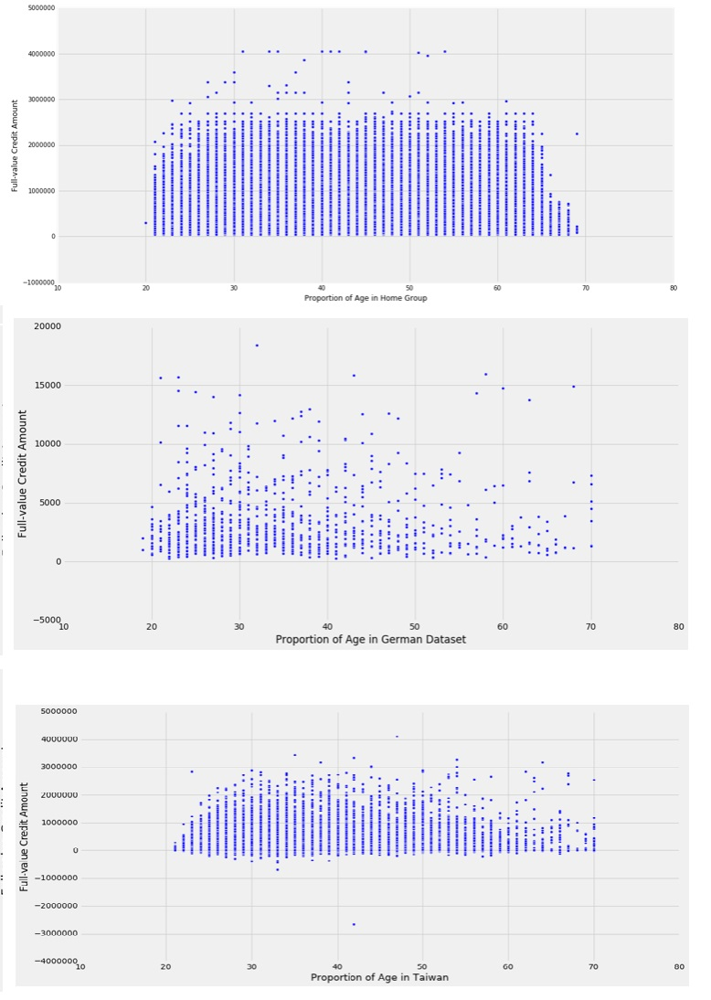

In [109]:
from IPython.display import Image
Image(filename='C:/Users/mrferozi/Desktop/Thesis 2019/Img/out2.jpg') 

### Removing Outliers

#### German Dataset

In [110]:
German.Age.max()

75

In [111]:
German.Age.replace(75,70,inplace=True)

In [112]:
German.Age.max()

74

In [113]:
German.Age.replace(74,70,inplace=True)

In [114]:
German.Age.max()

70

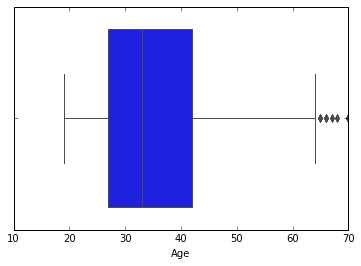

In [115]:
import seaborn as sns
plt.figure(figsize = (6, 4))
sns.boxplot(x=German['Age'])

#### Taiwan Dataset

In [116]:
Taiwan.AGE.max()

79

In [117]:
Taiwan.AGE.replace(79,70,inplace=True)

In [118]:
Taiwan.AGE.max()

75

In [119]:
Taiwan.AGE.replace(75,70,inplace=True)

In [120]:
Taiwan.AGE.max()

74

In [121]:
Taiwan.AGE.replace(74,70,inplace=True)

In [122]:
Taiwan.AGE.max()

73

In [123]:
Taiwan.AGE.replace(73,70,inplace=True)

In [124]:
Taiwan.AGE.max()

72

In [125]:
Taiwan.AGE.replace(72,70,inplace=True)

In [126]:
Taiwan.AGE.max()

71

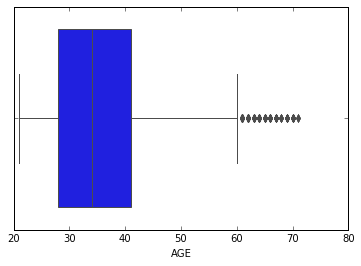

In [127]:
import seaborn as sns
plt.figure(figsize = (6, 4))
sns.boxplot(x=Taiwan['AGE'])

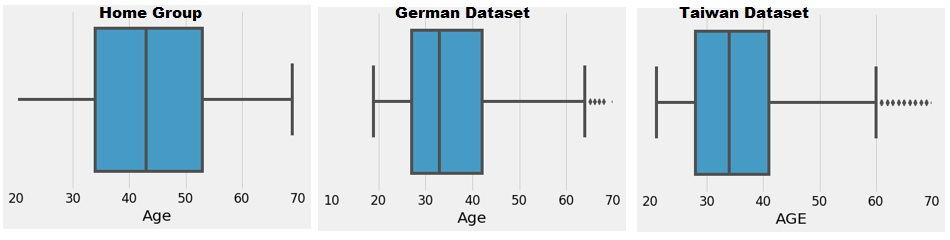

In [128]:
from IPython.display import Image
Image(filename='C:/Users/mrferozi/Desktop/Thesis 2019/Img/out3.jpg') 

Since, each dataset relates to a various age time limit it is hard to anticipate the credit policy. For instance, German dataset belongs to the year 1994, where Taiwan dataset is displaying a trend in 2005 and Home Group is coming from 2018. Then again demographic changes play a vital part. Each country and region have their own credit policy which has satisfied their demographic needs. This is turning it hard to define outer for age variable. For the sake of ease, this work decided to lower down upper age limit to 70 years.

### RIsk Factor Analysis ( Effect of Age )

### Home Group

In [129]:
# Find the correlation of the positive days since birth and target
train['DAYS_BIRTH'] = abs(train['DAYS_BIRTH'])
train['DAYS_BIRTH'].corr(train['TARGET'])

-0.078239308309827366

As the customer gets older, the linear relationship with the target is negatively affected so that as customers get older, their loans tend to be repaid more often. Let's begin to look at the variable. We can first produce an age histogram. 

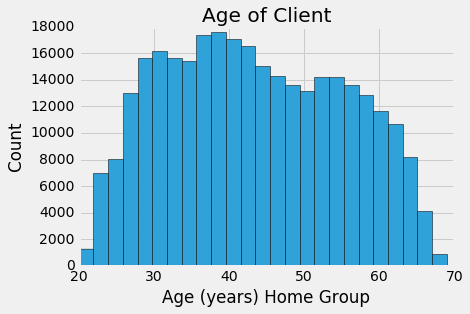

In [130]:
# Plots style
plt.style.use('fivethirtyeight')

# Age Distribution in plot
plt.hist(train['Age'], edgecolor = 'k', bins = 25)
plt.title('Age of Client'); plt.xlabel('Age (years) Home Group'); plt.ylabel('Count');

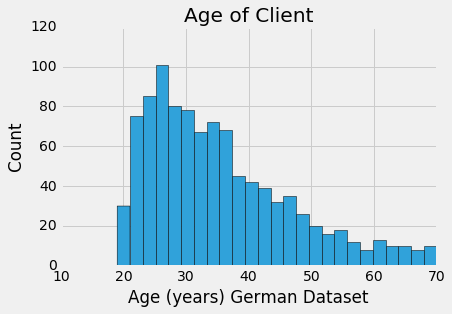

In [131]:
# Plots style
plt.style.use('fivethirtyeight')

# Age Distribution in plot
plt.hist(German['Age'], edgecolor = 'k', bins = 25)
plt.title('Age of Client'); plt.xlabel('Age (years) German Dataset'); plt.ylabel('Count');

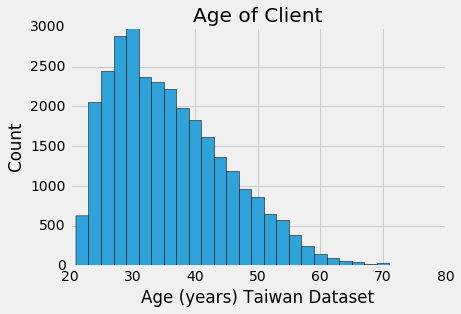

In [132]:
# Plots style
plt.style.use('fivethirtyeight')

# Age Distribution in plot
plt.hist(Taiwan['AGE'], edgecolor = 'k', bins = 25)
plt.title('Age of Client'); plt.xlabel('Age (years) Taiwan Dataset'); plt.ylabel('Count');

The age range itself tells us nothing but that there are no outlines, because the ages are reasonable. In order to view the effect of age on the objective, we produce a kernel density estimate plot. The target value of KDE is coloured. A diagram shows a single variable distribution and is a smooth histogram. Create it at each data point by calculating the kernel, usually the Gaussian kernel, and each kernel's average curve is a smooth one. Seaborn is going to use the' kdeplot' for this graph.

In [133]:
train.dtypes

NAME_CONTRACT_TYPE                           int64
FLAG_OWN_CAR                                 int64
FLAG_OWN_REALTY                              int64
CNT_CHILDREN                                 int64
AMT_INCOME_TOTAL                           float64
AMT_CREDIT                                 float64
AMT_ANNUITY                                float64
AMT_GOODS_PRICE                            float64
REGION_POPULATION_RELATIVE                 float64
DAYS_BIRTH                                   int64
DAYS_EMPLOYED                              float64
DAYS_REGISTRATION                          float64
DAYS_ID_PUBLISH                              int64
OWN_CAR_AGE                                float64
FLAG_MOBIL                                   int64
FLAG_EMP_PHONE                               int64
FLAG_WORK_PHONE                              int64
FLAG_CONT_MOBILE                             int64
FLAG_PHONE                                   int64
FLAG_EMAIL                     

### kdeplot 

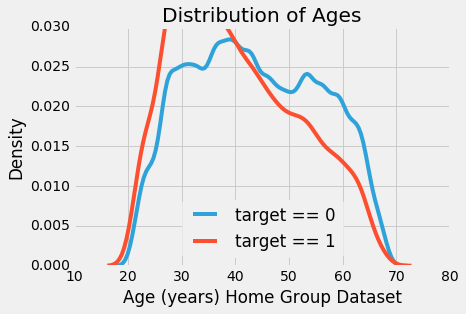

In [134]:
plt.figure(figsize = (6, 4))

# KDE plot of loans that were repaid on time
sns.kdeplot(train.loc[train['TARGET'] == 0, 'Age'], label = 'target == 0')

# KDE plot of loans which were not repaid on time
sns.kdeplot(train.loc[train['TARGET'] == 1, 'Age'], label = 'target == 1')

# Labeling of plot
plt.xlabel('Age (years) Home Group Dataset'); plt.ylabel('Density'); plt.title('Distribution of Ages');

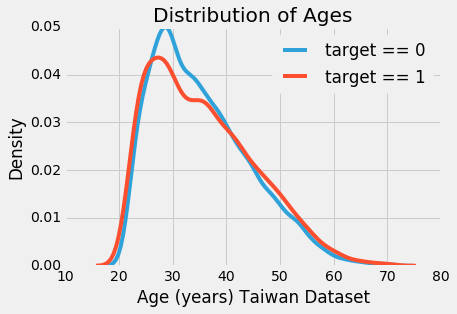

In [135]:
plt.figure(figsize = (6, 4))

# KDE plot of loans that were repaid on time
sns.kdeplot(Taiwan.loc[Taiwan['Target'] == 0, 'AGE'], label = 'target == 0')

# KDE plot of loans which were not repaid on time
sns.kdeplot(Taiwan.loc[Taiwan['Target'] == 1, 'AGE'], label = 'target == 1')

# Labeling of plot
plt.xlabel('Age (years) Taiwan Dataset'); plt.ylabel('Density'); plt.title('Distribution of Ages');

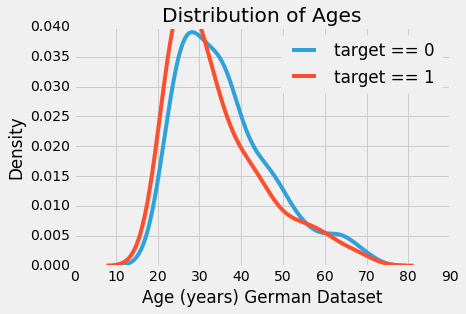

In [136]:
plt.figure(figsize = (6, 4))

# KDE plot of loans that were repaid on time
sns.kdeplot(German.loc[German['Target'] == 0, 'Age'], label = 'target == 0')

# KDE plot of loans which were not repaid on time
sns.kdeplot(German.loc[German['Target'] == 1, 'Age'], label = 'target == 1')

# Labeling of plot
plt.xlabel('Age (years) German Dataset'); plt.ylabel('Density'); plt.title('Distribution of Ages');

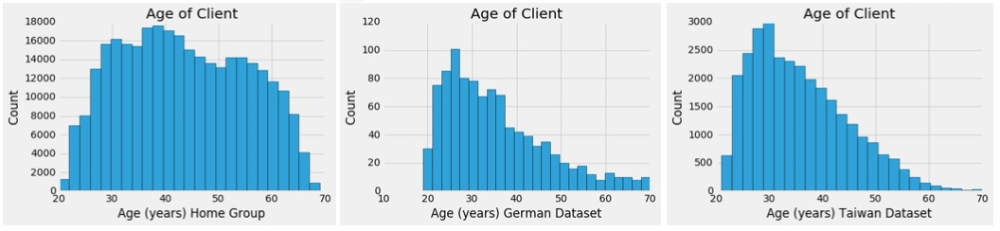

In [137]:
from IPython.display import Image
Image(filename='C:/Users/mrferozi/Desktop/Thesis 2019/Img/Age.jpg') 

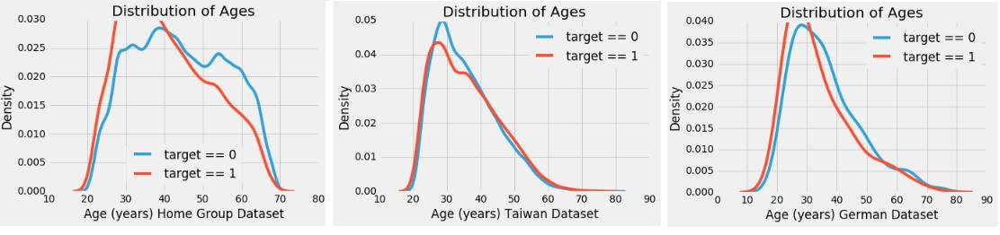

In [138]:
from IPython.display import Image
Image(filename='C:/Users/mrferozi/Desktop/Thesis 2019/Img/Ked.jpg') 

Target== 1 curve is skewed in the smaller area. Even if this is not a major correlation (-0.07). This variable is probably not useful in a learning machine model because it touches the object. Let us expect another way in this relationship: average non-refundable loans by age brackets.
For this diagram, the ages are first "cut" into 5-year bins. For each bin, therefore, we calculate the object's average value, indicating the proportion of loans not rewarded for each age group


### Home Group

In [139]:
train.dtypes

NAME_CONTRACT_TYPE                           int64
FLAG_OWN_CAR                                 int64
FLAG_OWN_REALTY                              int64
CNT_CHILDREN                                 int64
AMT_INCOME_TOTAL                           float64
AMT_CREDIT                                 float64
AMT_ANNUITY                                float64
AMT_GOODS_PRICE                            float64
REGION_POPULATION_RELATIVE                 float64
DAYS_BIRTH                                   int64
DAYS_EMPLOYED                              float64
DAYS_REGISTRATION                          float64
DAYS_ID_PUBLISH                              int64
OWN_CAR_AGE                                float64
FLAG_MOBIL                                   int64
FLAG_EMP_PHONE                               int64
FLAG_WORK_PHONE                              int64
FLAG_CONT_MOBILE                             int64
FLAG_PHONE                                   int64
FLAG_EMAIL                     

In [140]:
# Age information into a separate dataframe
age_data = train[['TARGET', 'DAYS_BIRTH']]
train['Age'] = age_data['DAYS_BIRTH'] / 365

# Bin the age data
age_data = train[['TARGET', 'Age']]
age_data['Age'] = pd.cut(age_data['Age'], bins = np.linspace(20, 70, num = 11))
age_data.head(10)

,TARGET,Age
0,1,"(25.0, 30.0]"
1,0,"(45.0, 50.0]"
2,0,"(50.0, 55.0]"
3,0,"(50.0, 55.0]"
4,0,"(50.0, 55.0]"
5,0,"(45.0, 50.0]"
6,0,"(35.0, 40.0]"
7,0,"(50.0, 55.0]"
8,0,"(55.0, 60.0]"
9,0,"(35.0, 40.0]"


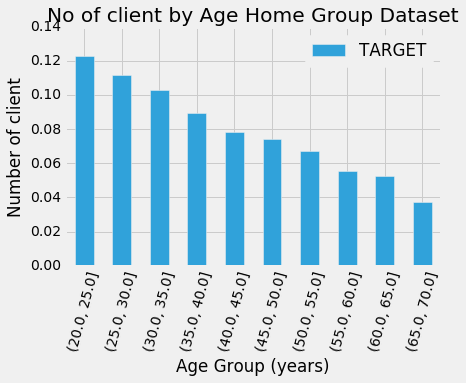

In [141]:
# Group by the bin and calculate averages
plt.figure(figsize = (6, 4))
age_groups  = age_data.groupby('Age').mean()
age_groups.plot.bar()
# Plot labeling
plt.xticks(rotation = 75); plt.xlabel('Age Group (years)'); plt.ylabel('Number of client')
plt.title('No of client by Age Home Group Dataset');

In [142]:
#df['']=train[''].astype(int)
cols = ['Age','AMT_CREDIT']
df = pd.DataFrame(columns=cols)
df['Age']=train['Age'].astype(int)
df['AMT_CREDIT']=train['AMT_CREDIT'].astype(int)
df['TARGET']=train['TARGET'].astype(int)

In [143]:
df['Age_Group'] = np.nan

lst = [df]

for col in lst:
    col.loc[(col['Age'] > 18) & (col['Age'] <= 29), 'Age_Group'] = 'Young'
    col.loc[(col['Age'] > 29) & (col['Age'] <= 40), 'Age_Group'] = 'Young Adults'
    col.loc[(col['Age'] > 40) & (col['Age'] <= 55), 'Age_Group'] = 'Senior'
    col.loc[col['Age'] > 55, 'Age_Group'] = 'Elder' 
    
# Take credit amount values into a list
young = df['AMT_CREDIT'].loc[df['Age_Group'] == 'Young'].values.tolist()
young_adults = df['AMT_CREDIT'].loc[df['Age_Group'] == 'Young Adults'].values.tolist()
senior = df['AMT_CREDIT'].loc[df['Age_Group'] == 'Senior'].values.tolist()
elder_credit = df['AMT_CREDIT'].loc[df['Age_Group'] == 'Elder'].values.tolist()
# Ok we have to create for each group risky and non-risky loans.

data = [young, young_adults, senior, elder_credit]


In [144]:
#Lets find loans by age group and by the level of TARGET and plot them in a bar chart.

# Age Group Segments
young_good = df['AMT_CREDIT'].loc[(df['Age_Group'] == 'Young') & (df['TARGET'] == 0)].sum()
young_bad = df['AMT_CREDIT'].loc[(df['Age_Group'] == 'Young') & (df['TARGET'] == 1)].sum()
young_adult_good = df['AMT_CREDIT'].loc[(df['Age_Group'] == 'Young Adults') & (df['TARGET'] == 0)].sum()
young_adult_bad = df['AMT_CREDIT'].loc[(df['Age_Group'] == 'Young Adults') & (df['TARGET'] == 1)].sum()
senior_good = df['AMT_CREDIT'].loc[(df['Age_Group'] == 'Senior') & (df['TARGET'] == 0)].sum()
senior_bad = df['AMT_CREDIT'].loc[(df['Age_Group'] == 'Senior') & (df['TARGET'] == 1)].sum()
elder_good = df['AMT_CREDIT'].loc[(df['Age_Group'] == 'Elder') & (df['TARGET'] == 0)].sum()
elder_bad = df['AMT_CREDIT'].loc[(df['Age_Group'] == 'Elder') & (df['TARGET'] == 1)].sum()

# Percents
young_good_p = young_good/(young_good + young_bad) * 100
young_bad_p = young_bad/(young_good + young_bad) * 100
young_adult_good_p = young_adult_good/(young_adult_good + young_adult_bad) * 100
young_adult_bad_p = young_adult_bad/(young_adult_good + young_adult_bad) * 100
senior_good_p = senior_good/(senior_good + senior_bad) * 100
senior_bad_p =  senior_bad/(senior_good + senior_bad) * 100
elder_good_p = elder_good/(elder_good + elder_bad) * 100
elder_bad_p = elder_bad/(elder_good + elder_bad) * 100

# Round Percents
young_good_p = str(round(young_good_p, 2))
young_bad_p = str(round(young_bad_p, 2))
young_adult_good_p = str(round(young_adult_good_p, 2))
young_adult_bad_p = str(round(young_adult_bad_p, 2))
senior_good_p = str(round(senior_good_p, 2))
senior_bad_p = str(round(senior_bad_p, 2))
elder_good_p = str(round(elder_good_p, 2))
elder_bad_p = str(round(elder_bad_p, 2))



x = ["Young", "Young Adults", "Senior", "Elder"]

good_loans = go.Bar(
    x=x,
    y=[young_good, young_adult_good, senior_good, elder_good],
    name="Good Loans",
    text=[young_good_p + '%', young_adult_good_p + '%', senior_good_p + '%', elder_good_p + '%'],
    textposition = 'auto',
    marker=dict(
        color='rgb(111, 235, 146)',
        line=dict(
            color='rgb(60, 199, 100)',
            width=1.5),
        ),
    opacity=0.6
)

bad_loans =  go.Bar(
    x=x,
    y=[young_bad, young_adult_bad, senior_bad, elder_bad],
    name="Bad Loans",
    text=[young_bad_p + '%', young_adult_bad_p + '%', senior_bad_p + '%', elder_bad_p + '%'],
    textposition = 'auto',
    marker=dict(
        color='rgb(247, 98, 98)',
        line=dict(
            color='rgb(225, 56, 56)',
            width=1.5),
        ),
    opacity=0.6
)

data = [good_loans, bad_loans]

layout = dict(
    title="Type of Loan by Age Group", 
    xaxis = dict(title="Age Home Group"),
    yaxis= dict(title="Credit Amount")
)

fig = dict(data=data, layout=layout)

iplot(fig, filename='grouped-bar-direct-labels')

### German Dataset Trend

In [145]:
German.head(10)

,Duration_month,Credit_amount,Installment_rate%,Gender,Present_res_lenght,Age,Number_Credit,No_dependent,foreign_worker,Target,...,Housing_1,Housing_2,Job_0,Job_1,Job_2,Job_3,Martial_status_1,Martial_status_2,Martial_status_3,Martial_status_4
0,6,1169,4,1,4,67,2,1,1,0,...,1,0,0,1,0,0,1,0,0,0
1,48,5951,2,0,2,22,1,1,1,1,...,1,0,0,1,0,0,0,0,1,0
2,12,2096,2,1,3,49,1,2,1,0,...,1,0,0,0,1,0,1,0,0,0
3,42,7882,2,1,4,45,1,2,1,0,...,0,0,0,1,0,0,1,0,0,0
4,24,4870,3,1,4,53,2,2,1,1,...,0,0,0,1,0,0,1,0,0,0
5,36,9055,2,1,4,35,1,2,1,0,...,0,0,0,0,1,0,1,0,0,0
6,24,2835,3,1,4,53,1,1,1,0,...,1,0,0,1,0,0,1,0,0,0
7,36,6948,2,1,2,35,1,1,1,0,...,0,1,1,0,0,0,1,0,0,0
8,12,3059,2,1,4,61,1,1,1,0,...,1,0,0,0,1,0,0,0,0,1
9,30,5234,4,1,2,28,2,1,1,1,...,1,0,1,0,0,0,0,1,0,0


In [146]:
# Ok we have to create for each group risky and non-risky loans.
df=German
df['Age_Group'] = np.nan

lst = [df]

for col in lst:
    col.loc[(col['Age'] > 18) & (col['Age'] <= 29), 'Age_Group'] = 'Young'
    col.loc[(col['Age'] > 29) & (col['Age'] <= 40), 'Age_Group'] = 'Young Adults'
    col.loc[(col['Age'] > 40) & (col['Age'] <= 55), 'Age_Group'] = 'Senior'
    col.loc[col['Age'] > 55, 'Age_Group'] = 'Elder' 
    
# Take credit amount values into a list
young = df['Credit_amount'].loc[df['Age_Group'] == 'Young'].values.tolist()
young_adults = df['Credit_amount'].loc[df['Age_Group'] == 'Young Adults'].values.tolist()
senior = df['Credit_amount'].loc[df['Age_Group'] == 'Senior'].values.tolist()
elder_credit = df['Credit_amount'].loc[df['Age_Group'] == 'Elder'].values.tolist()


In [147]:
# Lets find loans by age group and by the level of Target and plot them in a bar chart.

# Age Group Segments
young_good = df['Credit_amount'].loc[(df['Age_Group'] == 'Young') & (df['Target'] == 0)].sum()
young_bad = df['Credit_amount'].loc[(df['Age_Group'] == 'Young') & (df['Target'] == 1)].sum()
young_adult_good = df['Credit_amount'].loc[(df['Age_Group'] == 'Young Adults') & (df['Target'] == 0)].sum()
young_adult_bad = df['Credit_amount'].loc[(df['Age_Group'] == 'Young Adults') & (df['Target'] == 1)].sum()
senior_good = df['Credit_amount'].loc[(df['Age_Group'] == 'Senior') & (df['Target'] == 0)].sum()
senior_bad = df['Credit_amount'].loc[(df['Age_Group'] == 'Senior') & (df['Target'] == 1)].sum()
elder_good = df['Credit_amount'].loc[(df['Age_Group'] == 'Elder') & (df['Target'] == 0)].sum()
elder_bad = df['Credit_amount'].loc[(df['Age_Group'] == 'Elder') & (df['Target'] == 1)].sum()

# Percents
young_good_p = young_good/(young_good + young_bad) * 100
young_bad_p = young_bad/(young_good + young_bad) * 100
young_adult_good_p = young_adult_good/(young_adult_good + young_adult_bad) * 100
young_adult_bad_p = young_adult_bad/(young_adult_good + young_adult_bad) * 100
senior_good_p = senior_good/(senior_good + senior_bad) * 100
senior_bad_p =  senior_bad/(senior_good + senior_bad) * 100
elder_good_p = elder_good/(elder_good + elder_bad) * 100
elder_bad_p = elder_bad/(elder_good + elder_bad) * 100

# Round Percents
young_good_p = str(round(young_good_p, 2))
young_bad_p = str(round(young_bad_p, 2))
young_adult_good_p = str(round(young_adult_good_p, 2))
young_adult_bad_p = str(round(young_adult_bad_p, 2))
senior_good_p = str(round(senior_good_p, 2))
senior_bad_p = str(round(senior_bad_p, 2))
elder_good_p = str(round(elder_good_p, 2))
elder_bad_p = str(round(elder_bad_p, 2))



x = ["Young", "Young Adults", "Senior", "Elder"]

good_loans = go.Bar(
    x=x,
    y=[young_good, young_adult_good, senior_good, elder_good],
    name="Good Loans",
    text=[young_good_p + '%', young_adult_good_p + '%', senior_good_p + '%', elder_good_p + '%'],
    textposition = 'auto',
    marker=dict(
        color='rgb(111, 235, 146)',
        line=dict(
            color='rgb(60, 199, 100)',
            width=1.5),
        ),
    opacity=0.6
)

bad_loans =  go.Bar(
    x=x,
    y=[young_bad, young_adult_bad, senior_bad, elder_bad],
    name="Bad Loans",
    text=[young_bad_p + '%', young_adult_bad_p + '%', senior_bad_p + '%', elder_bad_p + '%'],
    textposition = 'auto',
    marker=dict(
        color='rgb(247, 98, 98)',
        line=dict(
            color='rgb(225, 56, 56)',
            width=1.5),
        ),
    opacity=0.6
)

data = [good_loans, bad_loans]

layout = dict(
    title="Type of Loan by Age Group", 
    xaxis = dict(title="Age German Dataset"),
    yaxis= dict(title="Credit Amount")
)

fig = dict(data=data, layout=layout)

iplot(fig, filename='grouped-bar-direct-labels')

In [148]:
# Age information into a separate dataframe
age_data = German[['Target', 'Age']]

# Bin the age data
age_data['Age'] = pd.cut(age_data['Age'], bins = np.linspace(20, 70, num = 11))
age_data.head(5)

,Target,Age
0,0,"(65.0, 70.0]"
1,1,"(20.0, 25.0]"
2,0,"(45.0, 50.0]"
3,0,"(40.0, 45.0]"
4,1,"(50.0, 55.0]"


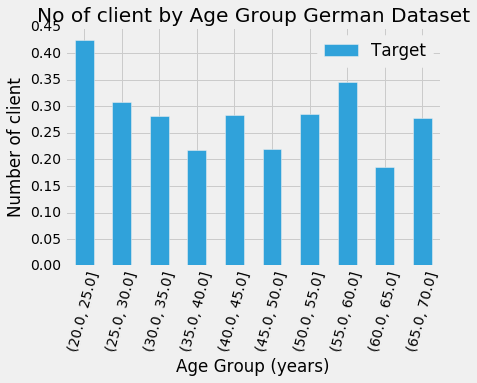

In [149]:
# Group by the bin and calculate averages
plt.figure(figsize = (6, 4))
age_groups  = age_data.groupby('Age').mean()
age_groups.plot.bar()
# Plot labeling
plt.xticks(rotation = 75); plt.xlabel('Age Group (years)'); plt.ylabel('Number of client')
plt.title('No of client by Age Group German Dataset');

In [150]:
Taiwan.dtypes

LIMIT_BAL        float64
SEX                int64
EDUCATION          int64
MARRIAGE           int64
AGE                int32
PAY_0              int64
PAY_2              int64
PAY_3              int64
PAY_4              int64
PAY_5              int64
PAY_6              int64
BILL_AMT1        float64
BILL_AMT2        float64
BILL_AMT3        float64
BILL_AMT4        float64
BILL_AMT5        float64
BILL_AMT6        float64
PAY_AMT1         float64
PAY_AMT2         float64
PAY_AMT3         float64
PAY_AMT4         float64
PAY_AMT5         float64
PAY_AMT6         float64
Target             int64
Credit_Amount      int32
dtype: object

In [151]:
# Ok we have to create for each group risky and non-risky loans.
df=Taiwan
df['AGE_Group'] = np.nan

lst = [df]

for col in lst:
    col.loc[(col['AGE'] > 18) & (col['AGE'] <= 29), 'AGE_Group'] = 'Young'
    col.loc[(col['AGE'] > 29) & (col['AGE'] <= 40), 'AGE_Group'] = 'Young Adults'
    col.loc[(col['AGE'] > 40) & (col['AGE'] <= 55), 'AGE_Group'] = 'Senior'
    col.loc[col['AGE'] > 55, 'AGE_Group'] = 'Elder' 
    
# Take credit amount values into a list
young = df['Credit_Amount'].loc[df['AGE_Group'] == 'Young'].values.tolist()
young_adults = df['Credit_Amount'].loc[df['AGE_Group'] == 'Young Adults'].values.tolist()
senior = df['Credit_Amount'].loc[df['AGE_Group'] == 'Senior'].values.tolist()
elder_credit = df['Credit_Amount'].loc[df['AGE_Group'] == 'Elder'].values.tolist()

In [152]:
# Lets find loans by age group and by the level of Target and plot them in a bar chart.

# Age Group Segments
young_good = df['Credit_Amount'].loc[(df['AGE_Group'] == 'Young') & (df['Target'] == 0)].sum()
young_bad = df['Credit_Amount'].loc[(df['AGE_Group'] == 'Young') & (df['Target'] == 1)].sum()
young_adult_good = df['Credit_Amount'].loc[(df['AGE_Group'] == 'Young Adults') & (df['Target'] == 0)].sum()
young_adult_bad = df['Credit_Amount'].loc[(df['AGE_Group'] == 'Young Adults') & (df['Target'] == 1)].sum()
senior_good = df['Credit_Amount'].loc[(df['AGE_Group'] == 'Senior') & (df['Target'] == 0)].sum()
senior_bad = df['Credit_Amount'].loc[(df['AGE_Group'] == 'Senior') & (df['Target'] == 1)].sum()
elder_good = df['Credit_Amount'].loc[(df['AGE_Group'] == 'Elder') & (df['Target'] == 0)].sum()
elder_bad = df['Credit_Amount'].loc[(df['AGE_Group'] == 'Elder') & (df['Target'] == 1)].sum()


In [153]:
# Percents
young_good_p = young_good/(young_good + young_bad) * 100
young_bad_p = young_bad/(young_good + young_bad) * 100
young_adult_good_p = young_adult_good/(young_adult_good + young_adult_bad) * 100
young_adult_bad_p = young_adult_bad/(young_adult_good + young_adult_bad) * 100
senior_good_p = senior_good/(senior_good + senior_bad) * 100
senior_bad_p =  senior_bad/(senior_good + senior_bad) * 100
elder_good_p = elder_good/(elder_good + elder_bad) * 100
elder_bad_p = elder_bad/(elder_good + elder_bad) * 100

# Round Percents
young_good_p = str(round(young_good_p, 2))
young_bad_p = str(round(young_bad_p, 2))
young_adult_good_p = str(round(young_adult_good_p, 2))
young_adult_bad_p = str(round(young_adult_bad_p, 2))
senior_good_p = str(round(senior_good_p, 2))
senior_bad_p = str(round(senior_bad_p, 2))
elder_good_p = str(round(elder_good_p, 2))
elder_bad_p = str(round(elder_bad_p, 2))



x = ["Young", "Young Adults", "Senior", "Elder"]

good_loans = go.Bar(
    x=x,
    y=[young_good, young_adult_good, senior_good, elder_good],
    name="Good Loans",
    text=[young_good_p + '%', young_adult_good_p + '%', senior_good_p + '%', elder_good_p + '%'],
    textposition = 'auto',
    marker=dict(
        color='rgb(111, 235, 146)',
        line=dict(
            color='rgb(60, 199, 100)',
            width=1.5),
        ),
    opacity=0.6
)

bad_loans =  go.Bar(
    x=x,
    y=[young_bad, young_adult_bad, senior_bad, elder_bad],
    name="Bad Loans",
    text=[young_bad_p + '%', young_adult_bad_p + '%', senior_bad_p + '%', elder_bad_p + '%'],
    textposition = 'auto',
    marker=dict(
        color='rgb(247, 98, 98)',
        line=dict(
            color='rgb(225, 56, 56)',
            width=1.5),
        ),
    opacity=0.6
)

data = [good_loans, bad_loans]

layout = dict(
    title="Type of Loan by Age Group", 
    xaxis = dict(title="Age Taiwan Dataset"),
    yaxis= dict(title="Credit Amount")
)

fig = dict(data=data, layout=layout)

iplot(fig, filename='grouped-bar-direct-labels')

In [154]:
# Group by the bin and calculate averages
age_groups  = Taiwan.groupby('AGE').mean()
df = pd.DataFrame(age_groups)
df['Target']=100 * df['Target']

In [155]:
# Age information into a separate dataframe
age_data = Taiwan[['Target', 'AGE']]

# Bin the age data
age_data['AGE'] = pd.cut(age_data['AGE'], bins = np.linspace(20, 70, num = 11))
age_data.head(5)

,Target,AGE
0,1,"(20.0, 25.0]"
1,1,"(25.0, 30.0]"
2,0,"(30.0, 35.0]"
3,0,"(35.0, 40.0]"
4,0,"(55.0, 60.0]"


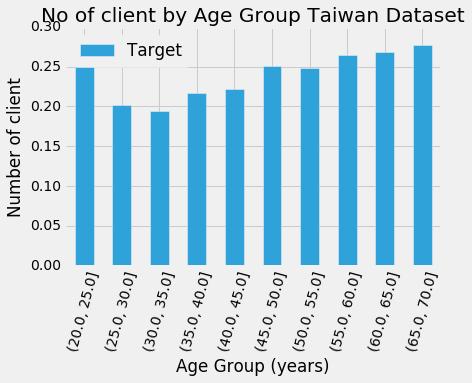

In [156]:
# Group by the bin and calculate averages
plt.figure(figsize = (6, 4))
age_groups  = age_data.groupby('AGE').mean()
age_groups.plot.bar()
# Plot labeling
plt.xticks(rotation = 75); plt.xlabel('Age Group (years)'); plt.ylabel('Number of client')
plt.title('No of client by Age Group Taiwan Dataset');

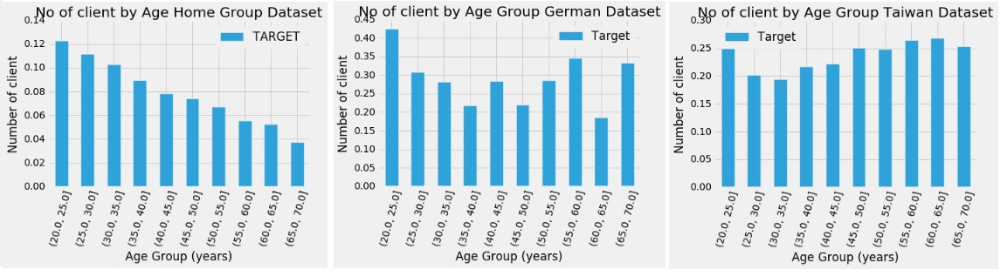

In [157]:
from IPython.display import Image
Image(filename='C:/Users/mrferozi/Desktop/Thesis 2019/Img/fail.jpg') 

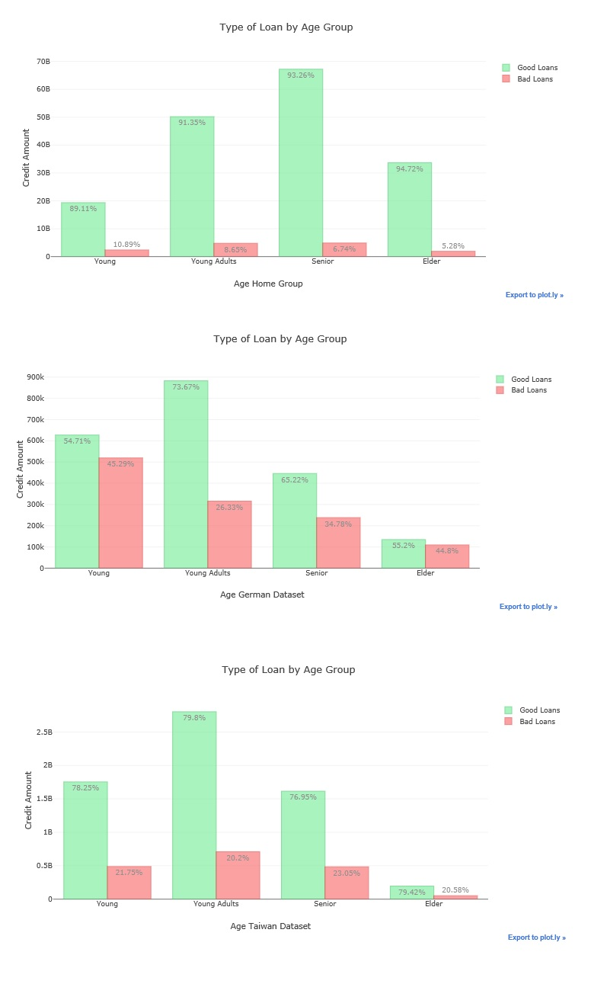

In [158]:
from IPython.display import Image
Image(filename='C:/Users/mrferozi/Desktop/Thesis 2019/Img/fail2.jpg') 

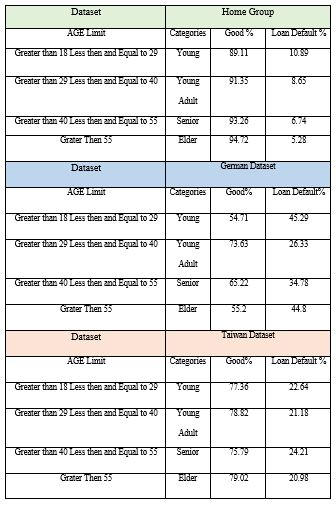

In [159]:
from IPython.display import Image
Image(filename='C:/Users/mrferozi/Desktop/Thesis 2019/Img/Age2.jpg') 

From the figure 23, and table 7, According the Home Group dataset, which is a representative international dataset. The full number of Bad Loan is 7.89 %, which mean that most of customer in 2018 has returned their borrowing. Where almost 8 % of clients are reluctant to pay their loan on time which is very good but still need to look after. 
In German dataset which is represented a general attitude of European people toward loan repayment, the default loan risk average 37.8%. The trend shows that in 1994 general attitude of client is not very good toward repayment of the loan. The youthful and elderly people were not so adept at returning their loan. 
 It is rather clear from Taiwan dataset which represent loan repayment trend of year 2005 in south Asia region that people are quite vigilant toward their loan repayment and average of 22.25 % of loan application started to default. 
This data could be used immediately by the bank: because younger customers are less likely to pay the loan, more guidance or financial planning guidance should be offered. This doesn't imply that the bank should discriminate against younger customers, but security measures should be taken to help younger customers pay on time. The younger age group tended to ask slightly for higher loans compared to the ederly age groups. The youthful and elderly groups had the highest proportion of high-risk loans. Interesting enough these are the groups that are most likely to be unemployed or working part-time, since the youngest group either don't have the experience to have a job or they are studying in a university, so they don't have luxury of time to work in an 8 hours job. In the elderly group side, this is the group that are most likely receiving their money from their pensions, meaning the elderly group is most likely unemployed or working part-time. The about statistics strengthen this study's assumption that human age effect on people decision power and with the age the risk of loan default is switched. So, there is a need of consideration of age, while issuing a loan to a customer. There is an obvious trend: younger applicants are more likely not to reimburse the credit.


References:* From the German Credit Analysis || A Risk Perspective: [ A Risk Perspective ](https://www.kaggle.com/janiobachmann/german-credit-analysis-a-risk-perspective)*

### Effect of Gender 

In the proposed work, research is focused on some microscopic facts, which are contributing in Bad loan. For example, Age, Gender, Martial Status and Education. However, these small variables may have a larger effect on a loan condition. Earlier, EDA shows the effect of age on loan condition. The younger customers tend to come in bad loan condition it could be because of their age. In this section this study focused on gender effects on loan default.

Kernel Density Estimated (KDE) is an approach to computing a random variable density function. It does not depend upon any distribution in the data. The calculation of kernel density is the major goal of data collection when a finite data example is used to limit people.

### Home Group 

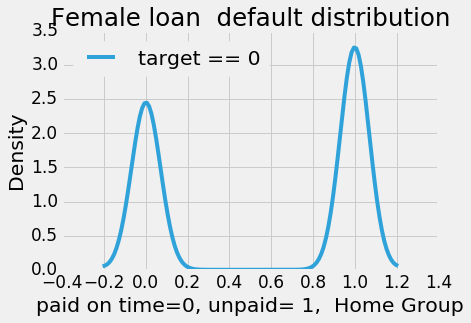

In [315]:
plt.figure(figsize = (6, 4))

# KDE plot of loans that were repaid on time
sns.kdeplot(train.loc[train['TARGET'] == 1, 'CODE_GENDER_F'], label = 'target == 0')

# Labeling of plot
plt.xlabel('paid on time=0, unpaid= 1,  Home Group'); plt.ylabel('Density'); plt.title('Female loan  default distribution');

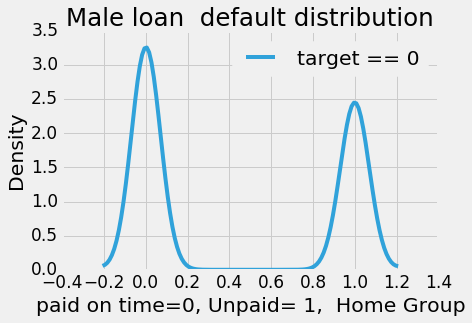

In [316]:
plt.figure(figsize = (6, 4))

# KDE plot of loans that were repaid on time
sns.kdeplot(train.loc[train['TARGET'] == 1, 'CODE_GENDER_M'], label = 'target == 0')

# Labeling of plot
plt.xlabel('paid on time=0, Unpaid= 1,  Home Group'); plt.ylabel('Density'); plt.title('Male loan  default distribution');

###### Gender
- Male =1 
- female=0
###### TARGET
- paid on time = 1
- Unpaid=  0

The second graph is displaying the male behaviour toward loan payment. It appears from the graph that the males beneficial to repay in their loan debt.

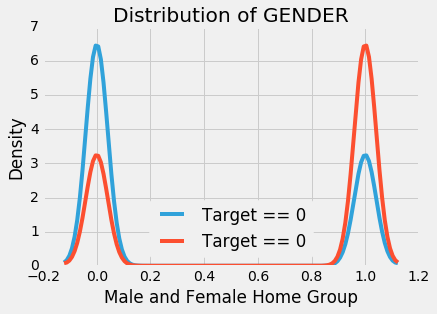

In [162]:
plt.figure(figsize = (6, 4))

# KDE plot of loans that were repaid on time
sns.kdeplot(train.loc[train['TARGET'] == 0, 'CODE_GENDER_M'], label = 'Target == 0')

# KDE plot of loans that were repaid on time
sns.kdeplot(train.loc[train['TARGET'] == 0, 'CODE_GENDER_F'], label = 'Target == 0')

# Labeling of plot
plt.xlabel('Male and Female Home Group'); plt.ylabel('Density'); plt.title('Distribution of GENDER');

In [163]:
train.CODE_GENDER_M.unique()

array([1, 0], dtype=uint64)

In [164]:
# Ok we have to create for each group risky and non-risky loans.
df=train
df['Age_Group'] = np.nan

lst = [df]

for col in lst:
    col.loc[(col['Age'] > 18) & (col['Age'] <= 29) & (col['CODE_GENDER_M']), 'Age_Group'] = 'Young_Male'
    col.loc[(col['Age'] > 18) & (col['Age'] <= 29) & (col['CODE_GENDER_F']), 'Age_Group'] = 'Young_Female'
    col.loc[(col['Age'] > 29) & (col['Age'] <= 40) & (col['CODE_GENDER_M']), 'Age_Group'] = 'Young_Adults_Male'
    col.loc[(col['Age'] > 29) & (col['Age'] <= 40) & (col['CODE_GENDER_F']), 'Age_Group'] = 'Young_Adults_Female'
    col.loc[(col['Age'] > 40) & (col['Age'] <= 55) & (col['CODE_GENDER_M']), 'Age_Group'] = 'Senior_Male'
    col.loc[(col['Age'] > 40) & (col['Age'] <= 55) & (col['CODE_GENDER_F']), 'Age_Group'] = 'Senior_Female'
    col.loc[(col['Age'] > 55) & (col['CODE_GENDER_M']), 'Age_Group'] = 'Elder_Male'
    col.loc[(col['Age'] > 55) & (col['CODE_GENDER_F']), 'Age_Group'] = 'Elder_Female'
    
# Take credit amount values into a list
young_Male = df['AMT_CREDIT'].loc[df['Age_Group'] == 'Young_Male'].values.tolist()
young_Female = df['AMT_CREDIT'].loc[df['Age_Group'] == 'Young_Female'].values.tolist()

young_Adults_Male = df['AMT_CREDIT'].loc[df['Age_Group'] == 'Young_Adults_Male'].values.tolist()
young_Adults_Female = df['AMT_CREDIT'].loc[df['Age_Group'] == 'Young_Adults_Female'].values.tolist()

senior_Male = df['AMT_CREDIT'].loc[df['Age_Group'] == 'Senior_Male'].values.tolist()
senior_Female = df['AMT_CREDIT'].loc[df['Age_Group'] == 'Senior_Female'].values.tolist()

elder_Male = df['AMT_CREDIT'].loc[df['Age_Group'] == 'Elder_Male'].values.tolist()
elder_Female = df['AMT_CREDIT'].loc[df['Age_Group'] == 'Elder_Female'].values.tolist()

In [165]:
# Lets find loans by age group and by the level of TARGET and plot them in a bar chart.

# Age Group Segments
young_male_good = df['AMT_CREDIT'].loc[(df['Age_Group'] == 'Young_Male') & (df['TARGET'] == 0)].sum()
young_female_good = df['AMT_CREDIT'].loc[(df['Age_Group'] == 'Young_Female') & (df['TARGET'] == 0)].sum()
young_male_bad = df['AMT_CREDIT'].loc[(df['Age_Group'] == 'Young_Male') & (df['TARGET'] == 1)].sum()
young_female_bad = df['AMT_CREDIT'].loc[(df['Age_Group'] == 'Young_Female') & (df['TARGET'] == 1)].sum()

young_adult_male_good = df['AMT_CREDIT'].loc[(df['Age_Group'] == 'Young_Adults_Male') & (df['TARGET'] == 0)].sum()
young_adult_Female_good = df['AMT_CREDIT'].loc[(df['Age_Group'] == 'Young_Adults_Female') & (df['TARGET'] == 0)].sum()
young_adult_male_bad = df['AMT_CREDIT'].loc[(df['Age_Group'] == 'Young_Adults_Male') & (df['TARGET'] == 1)].sum()
young_adult_Female_bad = df['AMT_CREDIT'].loc[(df['Age_Group'] == 'Young_Adults_Female') & (df['TARGET'] == 1)].sum()

senior_male_good = df['AMT_CREDIT'].loc[(df['Age_Group'] == 'Senior_Male') & (df['TARGET'] == 0)].sum()
senior_female_good = df['AMT_CREDIT'].loc[(df['Age_Group'] == 'Senior_Female') & (df['TARGET'] == 0)].sum()
senior_male_bad = df['AMT_CREDIT'].loc[(df['Age_Group'] == 'Senior_Male') & (df['TARGET'] == 1)].sum()
senior_female_bad = df['AMT_CREDIT'].loc[(df['Age_Group'] == 'Senior_Female') & (df['TARGET'] == 1)].sum()


elder_male_good = df['AMT_CREDIT'].loc[(df['Age_Group'] == 'Elder_Male') & (df['TARGET'] == 0)].sum()
elder_female_good = df['AMT_CREDIT'].loc[(df['Age_Group'] == 'Elder_Female') & (df['TARGET'] == 0)].sum()
elder_male_bad = df['AMT_CREDIT'].loc[(df['Age_Group'] == 'Elder_Male') & (df['TARGET'] == 0)].sum()
elder_female_bad = df['AMT_CREDIT'].loc[(df['Age_Group'] == 'Elder_Female') & (df['TARGET'] == 0)].sum()

In [166]:
# Percents
young_male_good_p = young_male_good/(young_male_good + young_male_bad) * 100
young_female_good_p = young_female_good/(young_female_good + young_female_bad) * 100
young_male_bad_p = young_male_bad/(young_male_good + young_male_bad) * 100
young_female_bad_p = young_female_bad/(young_female_good + young_female_bad) * 100

young_adult_male_good_p = young_adult_male_good/(young_adult_male_good + young_adult_male_bad) * 100
young_adult_Female_good_p = young_adult_Female_good/(young_adult_Female_good + young_adult_Female_bad) * 100
young_adult_male_bad_p = young_adult_male_bad/(young_adult_male_good + young_adult_male_bad) * 100
young_adult_Female_bad_p = young_adult_Female_bad/(young_adult_Female_good + young_adult_Female_bad) * 100

senior_male_good_p = senior_male_good/(senior_male_good + senior_male_bad) * 100
senior_female_good_p = senior_female_good/(senior_female_good + senior_female_bad) * 100
senior_male_bad_p =  senior_male_bad/(senior_male_good + senior_male_bad) * 100
senior_female_bad_p =  senior_female_bad/(senior_female_good + senior_female_bad) * 100

elder_male_good_p = elder_male_good/(elder_male_good + elder_male_bad) * 100
elder_male_bad_p = elder_male_bad/(elder_male_good + elder_male_bad) * 100
elder_female_good_p = elder_female_good/(elder_female_good + elder_female_bad) * 100
elder_female_bad_p = elder_female_bad/(elder_female_good + elder_female_bad) * 100


In [167]:
# Round Percents
young_male_good_p = str(round(young_male_good_p, 2))
young_female_good_p = str(round(young_female_good_p, 2))
young_male_bad_p = str(round(young_male_bad_p, 2))
young_female_bad_p = str(round(young_female_bad_p, 2))

young_adult_male_good_p = str(round(young_adult_male_good_p, 2))
young_adult_Female_good_p = str(round(young_adult_Female_good_p, 2))
young_adult_male_bad_p = str(round(young_adult_male_bad_p, 2))
young_adult_Female_bad_p = str(round(young_adult_Female_bad_p, 2))

senior_male_good_p = str(round(senior_male_good_p, 2))
senior_male_bad_p = str(round(senior_male_bad_p, 2))
senior_female_good_p = str(round(senior_female_good_p, 2))
senior_female_bad_p = str(round(senior_female_bad_p, 2))

elder_male_good_p = str(round(elder_male_good_p, 2))
elder_male_bad_p = str(round(elder_male_bad_p, 2))
elder_female_good_p = str(round(elder_female_good_p, 2))
elder_female_bad_p = str(round(elder_female_bad_p, 2))

In [168]:
x = ["young_male_good", "young_female_good", "young_adult_male_good", "young_adult_Female_goo", "senior_male_good", "senior_female_good", "elder_male_good", "elder_female_good"]

good_loans = go.Bar(
    x=x,
    y=[young_male_good, young_female_good, young_adult_male_good, young_adult_Female_good, senior_male_good, senior_female_good, elder_male_good, elder_female_good],
    name="Good Loans",
    text=[young_male_good_p + '%', young_female_good_p + '%', young_adult_male_good_p + '%', young_adult_Female_good_p + '%', senior_male_good_p + '%', senior_female_good_p + '%', elder_male_good_p + '%', elder_female_good_p + '%'],
    textposition = 'auto',
    marker=dict(
        color='rgb(111, 235, 146)',
        line=dict(
            color='rgb(60, 199, 100)',
            width=1.5),
        ),
    opacity=0.6
)

bad_loans =  go.Bar(
    x=x,
    y=[young_male_bad, young_female_bad, young_adult_male_bad,  young_adult_Female_bad, senior_male_bad, senior_female_bad, elder_male_bad, elder_female_bad],
    name="Bad Loans",
    text=[young_male_bad_p + '%', young_female_bad_p + '%', young_adult_male_bad_p + '%', young_adult_Female_bad_p + '%', senior_male_bad_p + '%', senior_female_bad_p + '%', elder_male_bad_p + '%', elder_female_bad_p + '%'],
    textposition = 'auto',
    marker=dict(
        color='rgb(247, 98, 98)',
        line=dict(
            color='rgb(225, 56, 56)',
            width=1.5),
        ),
    opacity=0.6
)

data = [good_loans, bad_loans]

layout = dict(
    title="Type of Loan by Gender Group", 
    xaxis = dict(title="Home Group Dataset"),
    yaxis= dict(title="Credit Amount")
)

fig = dict(data=data, layout=layout)

iplot(fig, filename='grouped-bar-direct-labels')

### German Dataset

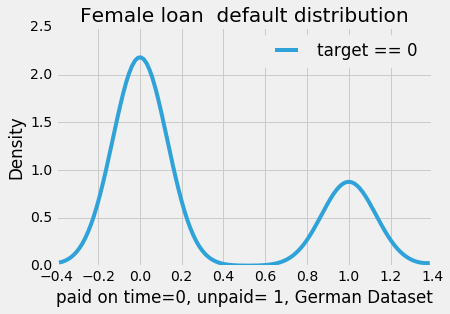

In [169]:
plt.figure(figsize = (6, 4))

# KDE plot of loans that were repaid on time
sns.kdeplot(German.loc[German['Target'] == 0, 'Gender']==0, label = 'target == 0')

# Labeling of plot
plt.xlabel('paid on time=0, unpaid= 1, German Dataset'); plt.ylabel('Density'); plt.title('Female loan  default distribution');

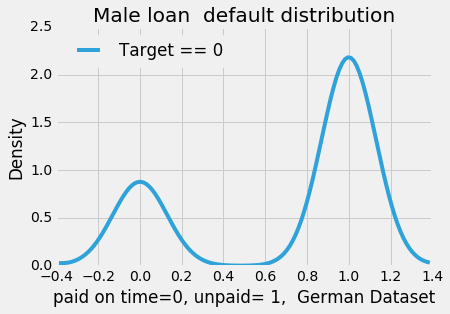

In [170]:
plt.figure(figsize = (6, 4))

# KDE plot of loans that were repaid on time
sns.kdeplot(German.loc[German['Target'] == 0, 'Gender']==1, label = 'Target == 0')

# Labeling of plot
plt.xlabel('paid on time=0, unpaid= 1,  German Dataset'); plt.ylabel('Density'); plt.title('Male loan  default distribution');

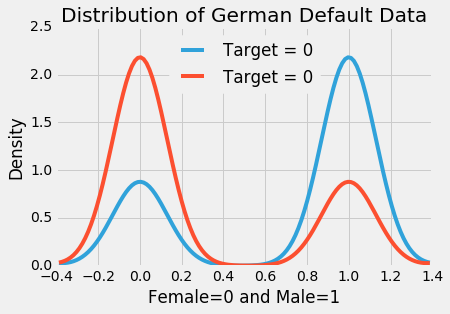

In [171]:
plt.figure(figsize = (6, 4))

# KDE plot of loans that were repaid on time
sns.kdeplot(German.loc[German['Target'] == 0, 'Gender'] == 1, label = 'Target = 0')

# KDE plot of loans that were repaid on time
sns.kdeplot(German.loc[German['Target'] == 0, 'Gender'] == 0, label = 'Target = 0')

# Labeling of plot
plt.xlabel('Female=0 and Male=1'); plt.ylabel('Density'); plt.title('Distribution of German Default Data');

In [172]:
German.dtypes

Duration_month                int64
Credit_amount                 int64
Installment_rate%             int64
Gender                        int64
Present_res_lenght            int64
Age                           int32
Number_Credit                 int64
No_dependent                  int64
foreign_worker                int64
Target                        int64
Status_checking_account_0     uint8
Status_checking_account_1     uint8
Status_checking_account_2     uint8
Status_checking_account_3     uint8
Credit_history_0              uint8
Credit_history_1              uint8
Credit_history_2              uint8
Credit_history_3              uint8
Credit_history_4              uint8
Purpose_0                     uint8
Purpose_1                     uint8
Purpose_10                    uint8
Purpose_2                     uint8
Purpose_3                     uint8
Purpose_4                     uint8
Purpose_5                     uint8
Purpose_6                     uint8
Purpose_8                   

In [173]:
German.Gender.unique()

array([1, 0], dtype=int64)

In [174]:
# Ok we have to create for each group risky and non-risky loans.
df=German
df['Age_Group'] = np.nan

lst = [df]

for col in lst:
    col.loc[(col['Age'] > 18) & (col['Age'] <= 29) & (col['Gender']== 1), 'Age_Group'] = 'Young_Male'
    col.loc[(col['Age'] > 18) & (col['Age'] <= 29) & (col['Gender']== 0), 'Age_Group'] = 'Young_Female'
    col.loc[(col['Age'] > 29) & (col['Age'] <= 40) & (col['Gender']== 1), 'Age_Group'] = 'Young_Adults_Male'
    col.loc[(col['Age'] > 29) & (col['Age'] <= 40) & (col['Gender']== 0), 'Age_Group'] = 'Young_Adults_Female'
    col.loc[(col['Age'] > 40) & (col['Age'] <= 55) & (col['Gender']== 1), 'Age_Group'] = 'Senior_Male'
    col.loc[(col['Age'] > 40) & (col['Age'] <= 55) & (col['Gender']== 0), 'Age_Group'] = 'Senior_Female'
    col.loc[(col['Age'] > 55) & (col['Gender']== 1), 'Age_Group'] = 'Elder_Male'
    col.loc[(col['Age'] > 55) & (col['Gender']== 0), 'Age_Group'] = 'Elder_Female'
    
# Take credit amount values into a list
young_Male = df['Credit_amount'].loc[df['Age_Group'] == 'Young_Male'].values.tolist()
young_Female = df['Credit_amount'].loc[df['Age_Group'] == 'Young_Female'].values.tolist()

young_Adults_Male = df['Credit_amount'].loc[df['Age_Group'] == 'Young_Adults_Male'].values.tolist()
young_Adults_Female = df['Credit_amount'].loc[df['Age_Group'] == 'Young_Adults_Female'].values.tolist()

senior_Male = df['Credit_amount'].loc[df['Age_Group'] == 'Senior_Male'].values.tolist()
senior_Female = df['Credit_amount'].loc[df['Age_Group'] == 'Senior_Female'].values.tolist()

elder_Male = df['Credit_amount'].loc[df['Age_Group'] == 'Elder_Male'].values.tolist()
elder_Female = df['Credit_amount'].loc[df['Age_Group'] == 'Elder_Female'].values.tolist()

In [175]:
# Lets find loans by age group and by the level of Target and plot them in a bar chart.

# Age Group Segments
young_male_good = df['Credit_amount'].loc[(df['Age_Group'] == 'Young_Male') & (df['Target'] == 0)].sum()
young_female_good = df['Credit_amount'].loc[(df['Age_Group'] == 'Young_Female') & (df['Target'] == 0)].sum()
young_male_bad = df['Credit_amount'].loc[(df['Age_Group'] == 'Young_Male') & (df['Target'] == 1)].sum()
young_female_bad = df['Credit_amount'].loc[(df['Age_Group'] == 'Young_Female') & (df['Target'] == 1)].sum()

young_adult_male_good = df['Credit_amount'].loc[(df['Age_Group'] == 'Young_Adults_Male') & (df['Target'] == 0)].sum()
young_adult_Female_good = df['Credit_amount'].loc[(df['Age_Group'] == 'Young_Adults_Female') & (df['Target'] == 0)].sum()
young_adult_male_bad = df['Credit_amount'].loc[(df['Age_Group'] == 'Young_Adults_Male') & (df['Target'] == 1)].sum()
young_adult_Female_bad = df['Credit_amount'].loc[(df['Age_Group'] == 'Young_Adults_Female') & (df['Target'] == 1)].sum()

senior_male_good = df['Credit_amount'].loc[(df['Age_Group'] == 'Senior_Male') & (df['Target'] == 0)].sum()
senior_female_good = df['Credit_amount'].loc[(df['Age_Group'] == 'Senior_Female') & (df['Target'] == 0)].sum()
senior_male_bad = df['Credit_amount'].loc[(df['Age_Group'] == 'Senior_Male') & (df['Target'] == 1)].sum()
senior_female_bad = df['Credit_amount'].loc[(df['Age_Group'] == 'Senior_Female') & (df['Target'] == 1)].sum()


elder_male_good = df['Credit_amount'].loc[(df['Age_Group'] == 'Elder_Male') & (df['Target'] == 0)].sum()
elder_female_good = df['Credit_amount'].loc[(df['Age_Group'] == 'Elder_Female') & (df['Target'] == 0)].sum()
elder_male_bad = df['Credit_amount'].loc[(df['Age_Group'] == 'Elder_Male') & (df['Target'] == 0)].sum()
elder_female_bad = df['Credit_amount'].loc[(df['Age_Group'] == 'Elder_Female') & (df['Target'] == 0)].sum()

In [176]:
# Percents
young_male_good_p = young_male_good/(young_male_good + young_male_bad) * 100
young_female_good_p = young_female_good/(young_female_good + young_female_bad) * 100
young_male_bad_p = young_male_bad/(young_male_good + young_male_bad) * 100
young_female_bad_p = young_female_bad/(young_female_good + young_female_bad) * 100

young_adult_male_good_p = young_adult_male_good/(young_adult_male_good + young_adult_male_bad) * 100
young_adult_Female_good_p = young_adult_Female_good/(young_adult_Female_good + young_adult_Female_bad) * 100
young_adult_male_bad_p = young_adult_male_bad/(young_adult_male_good + young_adult_male_bad) * 100
young_adult_Female_bad_p = young_adult_Female_bad/(young_adult_Female_good + young_adult_Female_bad) * 100

senior_male_good_p = senior_male_good/(senior_male_good + senior_male_bad) * 100
senior_female_good_p = senior_female_good/(senior_female_good + senior_female_bad) * 100
senior_male_bad_p =  senior_male_bad/(senior_male_good + senior_male_bad) * 100
senior_female_bad_p =  senior_female_bad/(senior_female_good + senior_female_bad) * 100

elder_male_good_p = elder_male_good/(elder_male_good + elder_male_bad) * 100
elder_male_bad_p = elder_male_bad/(elder_male_good + elder_male_bad) * 100
elder_female_good_p = elder_female_good/(elder_female_good + elder_female_bad) * 100
elder_female_bad_p = elder_female_bad/(elder_female_good + elder_female_bad) * 100


In [177]:
# Round Percents
young_male_good_p = str(round(young_male_good_p, 2))
young_female_good_p = str(round(young_female_good_p, 2))
young_male_bad_p = str(round(young_male_bad_p, 2))
young_female_bad_p = str(round(young_female_bad_p, 2))

young_adult_male_good_p = str(round(young_adult_male_good_p, 2))
young_adult_Female_good_p = str(round(young_adult_Female_good_p, 2))
young_adult_male_bad_p = str(round(young_adult_male_bad_p, 2))
young_adult_Female_bad_p = str(round(young_adult_Female_bad_p, 2))

senior_male_good_p = str(round(senior_male_good_p, 2))
senior_male_bad_p = str(round(senior_male_bad_p, 2))
senior_female_good_p = str(round(senior_female_good_p, 2))
senior_female_bad_p = str(round(senior_female_bad_p, 2))

elder_male_good_p = str(round(elder_male_good_p, 2))
elder_male_bad_p = str(round(elder_male_bad_p, 2))
elder_female_good_p = str(round(elder_female_good_p, 2))
elder_female_bad_p = str(round(elder_female_bad_p, 2))

In [178]:
x = ["young_male_good", "young_female_good", "young_adult_male_good", "young_adult_Female_goo", "senior_male_good", "senior_female_good", "elder_male_good", "elder_female_good"]

good_loans = go.Bar(
    x=x,
    y=[young_male_good, young_female_good, young_adult_male_good, young_adult_Female_good, senior_male_good, senior_female_good, elder_male_good, elder_female_good],
    name="Good Loans",
    text=[young_male_good_p + '%', young_female_good_p + '%', young_adult_male_good_p + '%', young_adult_Female_good_p + '%', senior_male_good_p + '%', senior_female_good_p + '%', elder_male_good_p + '%', elder_female_good_p + '%'],
    textposition = 'auto',
    marker=dict(
        color='rgb(111, 235, 146)',
        line=dict(
            color='rgb(60, 199, 100)',
            width=1.5),
        ),
    opacity=0.6
)

bad_loans =  go.Bar(
    x=x,
    y=[young_male_bad, young_female_bad, young_adult_male_bad,  young_adult_Female_bad, senior_male_bad, senior_female_bad, elder_male_bad, elder_female_bad],
    name="Bad Loans",
    text=[young_male_bad_p + '%', young_female_bad_p + '%', young_adult_male_bad_p + '%', young_adult_Female_bad_p + '%', senior_male_bad_p + '%', senior_female_bad_p + '%', elder_male_bad_p + '%', elder_female_bad_p + '%'],
    textposition = 'auto',
    marker=dict(
        color='rgb(247, 98, 98)',
        line=dict(
            color='rgb(225, 56, 56)',
            width=1.5),
        ),
    opacity=0.6
)

data = [good_loans, bad_loans]

layout = dict(
    title="Type of Loan by Gender Group", 
    xaxis = dict(title="German Dataset"),
    yaxis= dict(title="Credit Amount")
)

fig = dict(data=data, layout=layout)

iplot(fig, filename='grouped-bar-direct-labels')

### HOME Group

-  Male =1 
-  Female=0
-  TARGET= (paid on time 0,unpaid 1)

In [179]:
train.head(10)

,NAME_CONTRACT_TYPE,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,...,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,TARGET,DAYS_EMPLOYED_ANOM,Age,Age_Group
0,0,0,1,0,202500.0,406597.5,24700.5,351000.0,0.018801,9461,...,0,0,0,0,0,0,1,False,25.920548,Young_Male
1,0,0,0,0,270000.0,1293502.5,35698.5,1129500.0,0.003541,16765,...,0,0,0,0,0,0,0,False,45.931507,Senior_Female
2,1,1,1,0,67500.0,135000.0,6750.0,135000.0,0.010032,19046,...,0,0,0,0,0,0,0,False,52.180822,Senior_Male
3,0,0,1,0,135000.0,312682.5,29686.5,297000.0,0.008019,19005,...,0,0,0,0,0,0,0,False,52.068493,Senior_Female
4,0,0,1,0,121500.0,513000.0,21865.5,513000.0,0.028663,19932,...,0,0,0,0,0,0,0,False,54.608219,Senior_Male
5,0,0,1,0,99000.0,490495.5,27517.5,454500.0,0.035792,16941,...,0,0,0,0,0,0,0,False,46.413699,Senior_Male
6,0,1,1,1,171000.0,1560726.0,41301.0,1395000.0,0.035792,13778,...,0,0,0,0,0,0,0,False,37.747945,Young_Adults_Female
7,0,1,1,0,360000.0,1530000.0,42075.0,1530000.0,0.003122,18850,...,0,0,0,0,0,0,0,False,51.643836,Senior_Male
8,0,0,1,0,112500.0,1019610.0,33826.5,913500.0,0.018634,20099,...,0,0,0,0,0,0,0,True,55.065753,Elder_Female
9,1,0,1,0,135000.0,405000.0,20250.0,405000.0,0.019689,14469,...,0,0,0,0,0,0,0,False,39.641096,Young_Adults_Male


As we compare the both male and female kedplot. It is fairly showing that males are very good in repayment of a loan. Where females are not so helpful in term of repayment of the loan.

Pearson's r can fall between -ve 1 and +ve 1. Value of r -1 indicates a perfect linear negative relation between variables, a r of 0 indicates that variables are not linked linearly and a r of 1 shows a perfect linear, positive relationship among variables. The above graph display that +ve relationship between CODE_GENDER_M and TARGET variable. This display that male have more tendency in loan payment.

In [180]:
train.dtypes

NAME_CONTRACT_TYPE                           int64
FLAG_OWN_CAR                                 int64
FLAG_OWN_REALTY                              int64
CNT_CHILDREN                                 int64
AMT_INCOME_TOTAL                           float64
AMT_CREDIT                                 float64
AMT_ANNUITY                                float64
AMT_GOODS_PRICE                            float64
REGION_POPULATION_RELATIVE                 float64
DAYS_BIRTH                                   int64
DAYS_EMPLOYED                              float64
DAYS_REGISTRATION                          float64
DAYS_ID_PUBLISH                              int64
OWN_CAR_AGE                                float64
FLAG_MOBIL                                   int64
FLAG_EMP_PHONE                               int64
FLAG_WORK_PHONE                              int64
FLAG_CONT_MOBILE                             int64
FLAG_PHONE                                   int64
FLAG_EMAIL                     

In [181]:
#train['CODE_GENDER_M'].fillna(value='0', inplace=True)
train['CODE_GENDER_M'].isnull().sum()
x=train['CODE_GENDER_M'].astype(int)

The above graph display  -ve relationship between CODE_GENDER_F and TARGET variable. This implies that female are not beneficial in loan default.

In [182]:
# Gender information into a separate dataframe
gen_data = train[['CODE_GENDER_M', 'CODE_GENDER_F', 'DAYS_BIRTH']]
gen_data['YEARS_BIRTH'] = gen_data['DAYS_BIRTH'] / 365

In [183]:
# Bin the age data
gen_data['YEARS_BINNED'] = pd.cut(gen_data['YEARS_BIRTH'], bins = np.linspace(20, 70, num = 11))

In [184]:
gen_data['YEARS_BIRTH']=gen_data["YEARS_BIRTH"].astype(float)
gen_data['YEARS_BIRTH']=gen_data["YEARS_BIRTH"].astype(int)

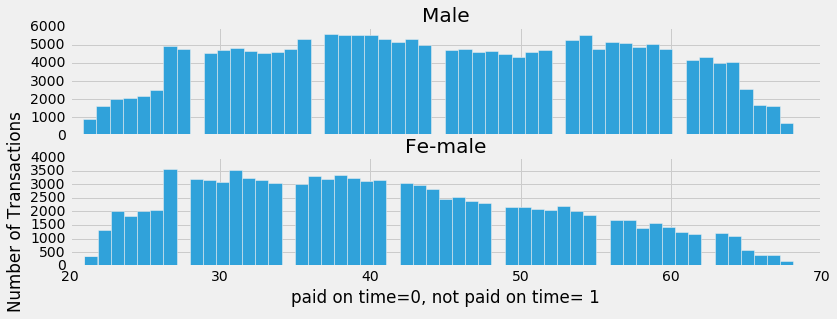

In [185]:
df=pd.DataFrame(gen_data)
f, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(12,4))

bins = 55

ax1.hist(df.YEARS_BIRTH[df.CODE_GENDER_M == 0], bins = bins)
ax1.set_title('Male')

ax2.hist(df.YEARS_BIRTH[df.CODE_GENDER_F == 0], bins = bins)
ax2.set_title('Fe-male')

plt.xlabel('Unpaid Loan by age')
plt.ylabel('Number of Transactions')
plt.xlabel('paid on time=0, not paid on time= 1'); 
plt.show()

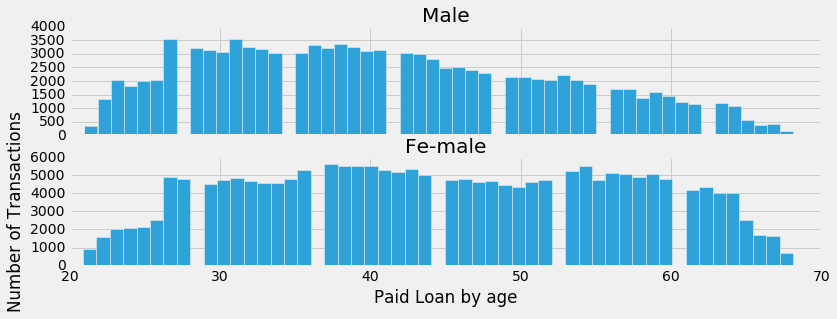

In [186]:
f, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(12,4))

bins = 55

ax1.hist(df.YEARS_BIRTH[df.CODE_GENDER_M == 1], bins = bins)
ax1.set_title('Male')

ax2.hist(df.YEARS_BIRTH[df.CODE_GENDER_F == 1], bins = bins)
ax2.set_title('Fe-male')

plt.xlabel('Paid Loan by age')
plt.ylabel('Number of Transactions')

plt.show()

### Taiwan Dataset

- SEX: Gender (1=male, 2=female)

In [187]:
Taiwan.rename(columns={'SEX':'Gender', 'MARRIAGE':'Martial_Status'}, inplace=True)

In [188]:
p=Taiwan['Target'].value_counts()
print ('The loan paid on time by 0')
print ('The loan not paid on time by 1')
print ('-------------------------------',)
print (p)

The loan paid on time by 0
The loan not paid on time by 1
-------------------------------
0    23364
1     6636
Name: Target, dtype: int64


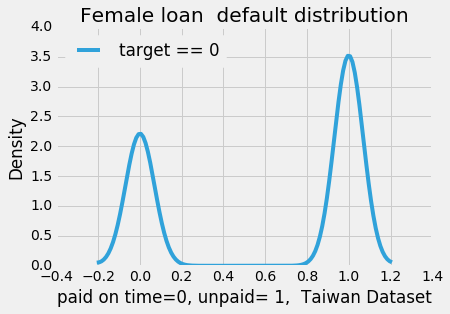

In [189]:
plt.figure(figsize = (6, 4))

# KDE plot of loans that were repaid on time
sns.kdeplot(Taiwan.loc[Taiwan['Target'] == 0, 'Gender'] == 2, label = 'target == 0')

# Labeling of plot
plt.xlabel('paid on time=0, unpaid= 1,  Taiwan Dataset'); plt.ylabel('Density'); plt.title('Female loan  default distribution');

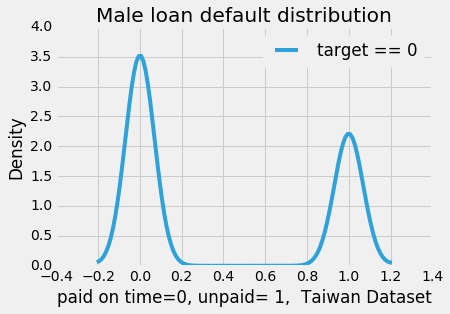

In [190]:
plt.figure(figsize = (6, 4))

# KDE plot of loans that were repaid on time
sns.kdeplot(Taiwan.loc[Taiwan['Target'] == 0, 'Gender'] == 1, label = 'target == 0')

# Labeling of plot
plt.xlabel('paid on time=0, unpaid= 1,  Taiwan Dataset'); plt.ylabel('Density'); plt.title('Male loan default distribution');

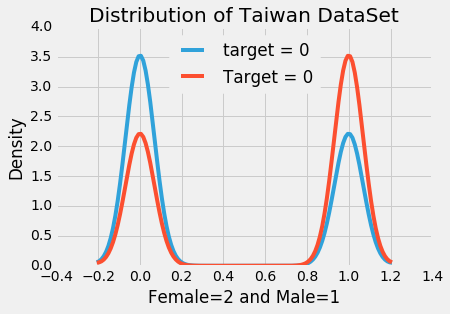

In [191]:
plt.figure(figsize = (6, 4))


# KDE plot of loans that were repaid on time
sns.kdeplot(Taiwan.loc[Taiwan['Target'] == 0, 'Gender'] == 1, label = 'target = 0')

# KDE plot of loans that were repaid on time
sns.kdeplot(Taiwan.loc[Taiwan['Target'] == 0, 'Gender'] == 2, label = 'Target = 0')

# Labeling of plot
plt.xlabel('Female=2 and Male=1'); plt.ylabel('Density'); plt.title('Distribution of Taiwan DataSet');

- Gender (1=male, 2=female)
- paid on time=0 
- unpaid= 1

In [192]:
Taiwan.dtypes

LIMIT_BAL         float64
Gender              int64
EDUCATION           int64
Martial_Status      int64
AGE                 int32
PAY_0               int64
PAY_2               int64
PAY_3               int64
PAY_4               int64
PAY_5               int64
PAY_6               int64
BILL_AMT1         float64
BILL_AMT2         float64
BILL_AMT3         float64
BILL_AMT4         float64
BILL_AMT5         float64
BILL_AMT6         float64
PAY_AMT1          float64
PAY_AMT2          float64
PAY_AMT3          float64
PAY_AMT4          float64
PAY_AMT5          float64
PAY_AMT6          float64
Target              int64
Credit_Amount       int32
AGE_Group          object
dtype: object

In [193]:
# Ok we have to create for each group risky and non-risky loans.
df=Taiwan
df['AGE_Group'] = np.nan

lst = [df]

for col in lst:
    col.loc[(col['AGE'] > 18) & (col['AGE'] <= 29) & (col['Gender']== 1), 'AGE_Group'] = 'Young_Male'
    col.loc[(col['AGE'] > 18) & (col['AGE'] <= 29) & (col['Gender']== 2), 'AGE_Group'] = 'Young_Female'
    col.loc[(col['AGE'] > 29) & (col['AGE'] <= 42) & (col['Gender']== 1), 'AGE_Group'] = 'Young_Adults_Male'
    col.loc[(col['AGE'] > 29) & (col['AGE'] <= 42) & (col['Gender']== 2), 'AGE_Group'] = 'Young_Adults_Female'
    col.loc[(col['AGE'] > 42) & (col['AGE'] <= 55) & (col['Gender']== 1), 'AGE_Group'] = 'Senior_Male'
    col.loc[(col['AGE'] > 42) & (col['AGE'] <= 55) & (col['Gender']== 2), 'AGE_Group'] = 'Senior_Female'
    col.loc[(col['AGE'] > 55) & (col['Gender']== 1), 'AGE_Group'] = 'Elder_Male'
    col.loc[(col['AGE'] > 55) & (col['Gender']== 2), 'AGE_Group'] = 'Elder_Female'
    
# Take credit amount values into a list
young_Male = df['Credit_Amount'].loc[df['AGE_Group'] == 'Young_Male'].values.tolist()
young_Female = df['Credit_Amount'].loc[df['AGE_Group'] == 'Young_Female'].values.tolist()

young_Adults_Male = df['Credit_Amount'].loc[df['AGE_Group'] == 'Young_Adults_Male'].values.tolist()
young_Adults_Female = df['Credit_Amount'].loc[df['AGE_Group'] == 'Young_Adults_Female'].values.tolist()

senior_Male = df['Credit_Amount'].loc[df['AGE_Group'] == 'Senior_Male'].values.tolist()
senior_Female = df['Credit_Amount'].loc[df['AGE_Group'] == 'Senior_Female'].values.tolist()

elder_Male = df['Credit_Amount'].loc[df['AGE_Group'] == 'Elder_Male'].values.tolist()
elder_Female = df['Credit_Amount'].loc[df['AGE_Group'] == 'Elder_Female'].values.tolist()

In [194]:
# Lets find loans by age group and by the level of Target and plot them in a bar chart.

# Age Group Segments
young_male_good = df['Credit_Amount'].loc[(df['AGE_Group'] == 'Young_Male') & (df['Target'] == 0)].sum()
young_female_good = df['Credit_Amount'].loc[(df['AGE_Group'] == 'Young_Female') & (df['Target'] == 0)].sum()
young_male_bad = df['Credit_Amount'].loc[(df['AGE_Group'] == 'Young_Male') & (df['Target'] == 1)].sum()
young_female_bad = df['Credit_Amount'].loc[(df['AGE_Group'] == 'Young_Female') & (df['Target'] == 1)].sum()

young_adult_male_good = df['Credit_Amount'].loc[(df['AGE_Group'] == 'Young_Adults_Male') & (df['Target'] == 0)].sum()
young_adult_Female_good = df['Credit_Amount'].loc[(df['AGE_Group'] == 'Young_Adults_Female') & (df['Target'] == 0)].sum()
young_adult_male_bad = df['Credit_Amount'].loc[(df['AGE_Group'] == 'Young_Adults_Male') & (df['Target'] == 1)].sum()
young_adult_Female_bad = df['Credit_Amount'].loc[(df['AGE_Group'] == 'Young_Adults_Female') & (df['Target'] == 1)].sum()

senior_male_good = df['Credit_Amount'].loc[(df['AGE_Group'] == 'Senior_Male') & (df['Target'] == 0)].sum()
senior_female_good = df['Credit_Amount'].loc[(df['AGE_Group'] == 'Senior_Female') & (df['Target'] == 0)].sum()
senior_male_bad = df['Credit_Amount'].loc[(df['AGE_Group'] == 'Senior_Male') & (df['Target'] == 1)].sum()
senior_female_bad = df['Credit_Amount'].loc[(df['AGE_Group'] == 'Senior_Female') & (df['Target'] == 1)].sum()


elder_male_good = df['Credit_Amount'].loc[(df['AGE_Group'] == 'Elder_Male') & (df['Target'] == 0)].sum()
elder_female_good = df['Credit_Amount'].loc[(df['AGE_Group'] == 'Elder_Female') & (df['Target'] == 0)].sum()
elder_male_bad = df['Credit_Amount'].loc[(df['AGE_Group'] == 'Elder_Male') & (df['Target'] == 0)].sum()
elder_female_bad = df['Credit_Amount'].loc[(df['AGE_Group'] == 'Elder_Female') & (df['Target'] == 0)].sum()

In [195]:
# Percents
young_male_good_p = young_male_good/(young_male_good + young_male_bad) * 100
young_female_good_p = young_female_good/(young_female_good + young_female_bad) * 100
young_male_bad_p = young_male_bad/(young_male_good + young_male_bad) * 100
young_female_bad_p = young_female_bad/(young_female_good + young_female_bad) * 100

young_adult_male_good_p = young_adult_male_good/(young_adult_male_good + young_adult_male_bad) * 100
young_adult_Female_good_p = young_adult_Female_good/(young_adult_Female_good + young_adult_Female_bad) * 100
young_adult_male_bad_p = young_adult_male_bad/(young_adult_male_good + young_adult_male_bad) * 100
young_adult_Female_bad_p = young_adult_Female_bad/(young_adult_Female_good + young_adult_Female_bad) * 100

senior_male_good_p = senior_male_good/(senior_male_good + senior_male_bad) * 100
senior_female_good_p = senior_female_good/(senior_female_good + senior_female_bad) * 100
senior_male_bad_p =  senior_male_bad/(senior_male_good + senior_male_bad) * 100
senior_female_bad_p =  senior_female_bad/(senior_female_good + senior_female_bad) * 100

elder_male_good_p = elder_male_good/(elder_male_good + elder_male_bad) * 100
elder_male_bad_p = elder_male_bad/(elder_male_good + elder_male_bad) * 100
elder_female_good_p = elder_female_good/(elder_female_good + elder_female_bad) * 100
elder_female_bad_p = elder_female_bad/(elder_female_good + elder_female_bad) * 100

In [196]:
# Round Percents
young_male_good_p = str(round(young_male_good_p, 2))
young_female_good_p = str(round(young_female_good_p, 2))
young_male_bad_p = str(round(young_male_bad_p, 2))
young_female_bad_p = str(round(young_female_bad_p, 2))

young_adult_male_good_p = str(round(young_adult_male_good_p, 2))
young_adult_Female_good_p = str(round(young_adult_Female_good_p, 2))
young_adult_male_bad_p = str(round(young_adult_male_bad_p, 2))
young_adult_Female_bad_p = str(round(young_adult_Female_bad_p, 2))

senior_male_good_p = str(round(senior_male_good_p, 2))
senior_male_bad_p = str(round(senior_male_bad_p, 2))
senior_female_good_p = str(round(senior_female_good_p, 2))
senior_female_bad_p = str(round(senior_female_bad_p, 2))

elder_male_good_p = str(round(elder_male_good_p, 2))
elder_male_bad_p = str(round(elder_male_bad_p, 2))
elder_female_good_p = str(round(elder_female_good_p, 2))
elder_female_bad_p = str(round(elder_female_bad_p, 2))

In [197]:
x = ["young_male_good", "young_female_good", "young_adult_male_good", "young_adult_Female_goo", "senior_male_good", "senior_female_good", "elder_male_good", "elder_female_good"]

good_loans = go.Bar(
    x=x,
    y=[young_male_good, young_female_good, young_adult_male_good, young_adult_Female_good, senior_male_good, senior_female_good, elder_male_good, elder_female_good],
    name="Good Loans",
    text=[young_male_good_p + '%', young_female_good_p + '%', young_adult_male_good_p + '%', young_adult_Female_good_p + '%', senior_male_good_p + '%', senior_female_good_p + '%', elder_male_good_p + '%', elder_female_good_p + '%'],
    textposition = 'auto',
    marker=dict(
        color='rgb(111, 235, 146)',
        line=dict(
            color='rgb(60, 199, 100)',
            width=1.5),
        ),
    opacity=0.6
)

bad_loans =  go.Bar(
    x=x,
    y=[young_male_bad, young_female_bad, young_adult_male_bad,  young_adult_Female_bad, senior_male_bad, senior_female_bad, elder_male_bad, elder_female_bad],
    name="Bad Loans",
    text=[young_male_bad_p + '%', young_female_bad_p + '%', young_adult_male_bad_p + '%', young_adult_Female_bad_p + '%', senior_male_bad_p + '%', senior_female_bad_p + '%', elder_male_bad_p + '%', elder_female_bad_p + '%'],
    textposition = 'auto',
    marker=dict(
        color='rgb(247, 98, 98)',
        line=dict(
            color='rgb(225, 56, 56)',
            width=1.5),
        ),
    opacity=0.6
)

data = [good_loans, bad_loans]

layout = dict(
    title="Type of Loan by Gender Group", 
    xaxis = dict(title="Taiwan Dataset"),
    yaxis= dict(title="Credit Amount")
)

fig = dict(data=data, layout=layout)

iplot(fig, filename='grouped-bar-direct-labels')

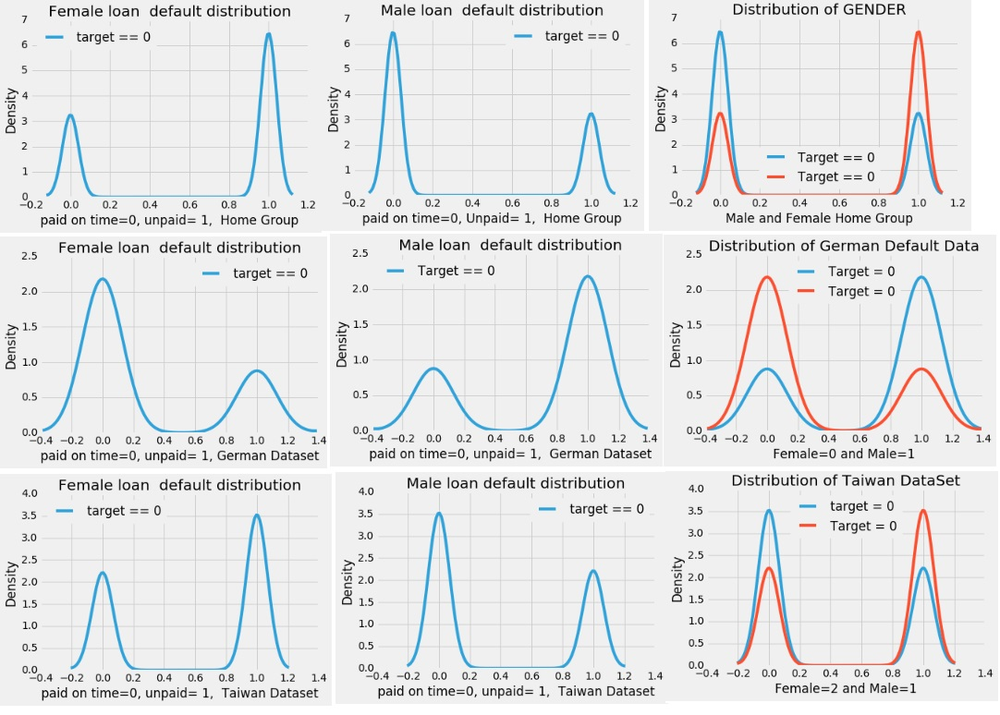

In [198]:
from IPython.display import Image
Image(filename='C:/Users/mrferozi/Desktop/Thesis 2019/Img/failg.jpg') 

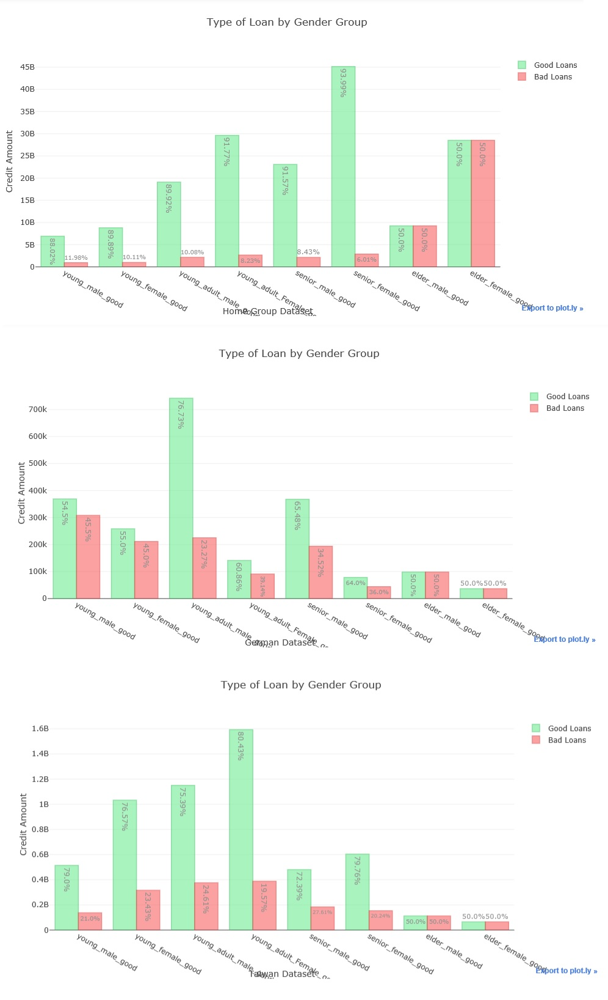

In [199]:
from IPython.display import Image
Image(filename='C:/Users/mrferozi/Desktop/Thesis 2019/Img/gen2.jpg') 

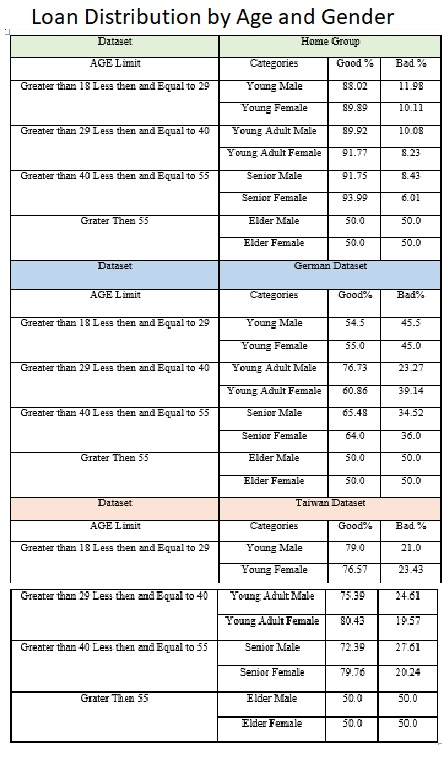

In [200]:
from IPython.display import Image
Image(filename='C:/Users/mrferozi/Desktop/Thesis 2019/Img/gen3.jpg') 

Further, for our discussion this study has created a histogram graph to explore age effect in male and female. The finding of the study is quite interesting. The above graph showed that there is a greater probablity of loan default in females. The trend of loan default in male starts from the age of 40 and continue the same till the age of 60. The loan default train in the female is all unlike. The females mid 40 are falling in high risk areas. After, age of mid 45 the risk factor getting higher in females till age of 70. If one could compare above two graphs could easily spot that man is quite vigilant in term of paying back their debts. Where it is very clear that after mid forty females are not so good in returning their loan payment.

### Effect of  Education  

This component of elementary data analysis, this work intends to explore that how different level of client educational background could effect on loan term. For the start, this study like to recall here that we have hot-encoded the education code variable. Today, this study has divided our client in five different classes.

### Home Group

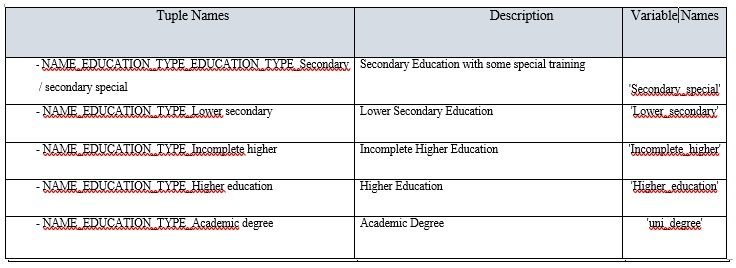

In [201]:
from IPython.display import Image
Image(filename='C:/Users/mrferozi/Desktop/Thesis 2019/Img/edu_disp.jpg') 

In [202]:
#create a new data frame
cols = ['Bad_Loan','uni_degree','Higher_education','Incomplete_higher','Lower_secondary','Secondary_special']
df = pd.DataFrame(columns=cols)
df['Bad_Loan']=train['TARGET'].astype(int)
df['Secondary_special']=train['NAME_EDUCATION_TYPE_Secondary / secondary special'].astype(int)
df['Lower_secondary']=train['NAME_EDUCATION_TYPE_Lower secondary'].astype(int)
df['Incomplete_higher']=train['NAME_EDUCATION_TYPE_Incomplete higher'].astype(int)
df['Higher_education']=train['NAME_EDUCATION_TYPE_Higher education'].astype(int)
df['uni_degree']=train['NAME_EDUCATION_TYPE_Academic degree'].astype(int)

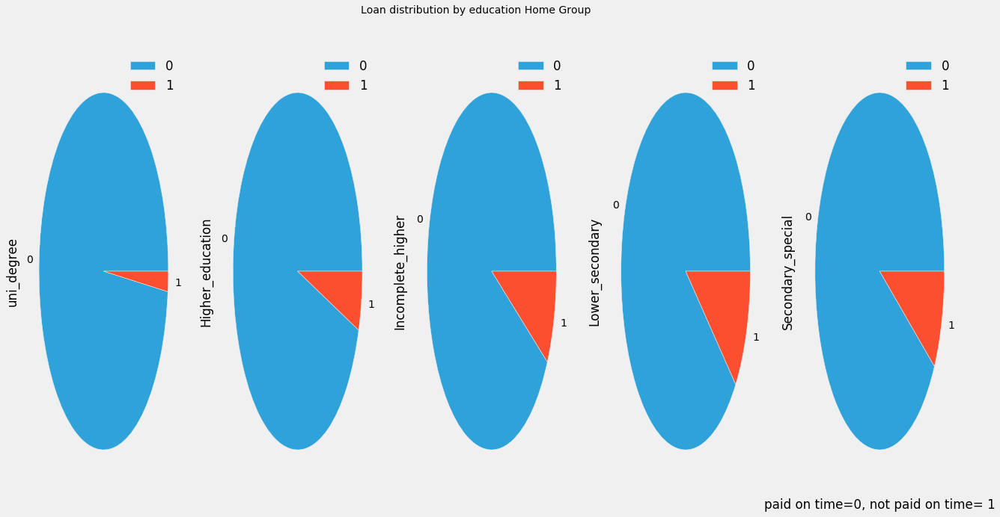

In [203]:
bad_loan_counts = df.groupby('Bad_Loan').aggregate(sum)
bad_loan_counts.plot(kind='pie',figsize=(20, 10), title='Loan distribution by education Home Group',subplots=True)
b=plt.xlabel('paid on time=0, not paid on time= 1')

- paid on time=0 
- unpaid= 1

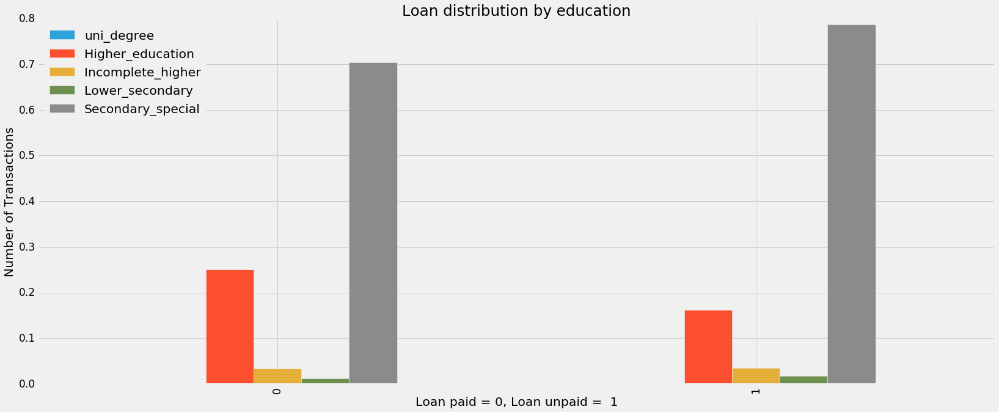

In [204]:
# side-by-side bar plots
# increase default figure and font sizes for easier viewing
plt.rcParams['figure.figsize'] = (25, 10)
plt.rcParams['font.size'] = 17
df.groupby('Bad_Loan').mean().plot(kind='bar', title='Loan distribution by education')
plt.xlabel('Loan paid = 0, Loan unpaid =  1')
plt.ylabel('Number of Transactions')

In [205]:
train.dtypes

NAME_CONTRACT_TYPE                           int64
FLAG_OWN_CAR                                 int64
FLAG_OWN_REALTY                              int64
CNT_CHILDREN                                 int64
AMT_INCOME_TOTAL                           float64
AMT_CREDIT                                 float64
AMT_ANNUITY                                float64
AMT_GOODS_PRICE                            float64
REGION_POPULATION_RELATIVE                 float64
DAYS_BIRTH                                   int64
DAYS_EMPLOYED                              float64
DAYS_REGISTRATION                          float64
DAYS_ID_PUBLISH                              int64
OWN_CAR_AGE                                float64
FLAG_MOBIL                                   int64
FLAG_EMP_PHONE                               int64
FLAG_WORK_PHONE                              int64
FLAG_CONT_MOBILE                             int64
FLAG_PHONE                                   int64
FLAG_EMAIL                     

In [206]:
#create a new data frame
#df['']=train[''].astype(int)
cols = ['Age','AMT_CREDIT']
df = pd.DataFrame(columns=cols)
df['Age']=train['Age'].astype(int)
df['AMT_CREDIT']=train['AMT_CREDIT'].astype(int)
df['TARGET']=train['TARGET'].astype(int)
df['Secondary_special']=train['NAME_EDUCATION_TYPE_Secondary / secondary special'].astype(int)
df['Lower_secondary']=train['NAME_EDUCATION_TYPE_Lower secondary'].astype(int)
df['Incomplete_higher']=train['NAME_EDUCATION_TYPE_Incomplete higher'].astype(int)
df['Higher_education']=train['NAME_EDUCATION_TYPE_Higher education'].astype(int)
df['uni_degree']=train['NAME_EDUCATION_TYPE_Academic degree'].astype(int)
df['Male']=train['CODE_GENDER_M'].astype(int)
df['Female']=train['CODE_GENDER_F'].astype(int)

In [207]:
df.head(9)

,Age,AMT_CREDIT,TARGET,Secondary_special,Lower_secondary,Incomplete_higher,Higher_education,uni_degree,Male,Female
0,25,406597,1,1,0,0,0,0,1,0
1,45,1293502,0,0,0,0,1,0,0,1
2,52,135000,0,1,0,0,0,0,1,0
3,52,312682,0,1,0,0,0,0,0,1
4,54,513000,0,1,0,0,0,0,1,0
5,46,490495,0,1,0,0,0,0,1,0
6,37,1560726,0,0,0,0,1,0,0,1
7,51,1530000,0,0,0,0,1,0,1,0
8,55,1019610,0,1,0,0,0,0,0,1


References:* From Loan repayers v/s Loan defaulters - HOME CREDIT : [Loan repayers v/s Loan defaulters ](https://www.kaggle.com/pavanraj159/loan-repayers-v-s-loan-defaulters-home-credit)*

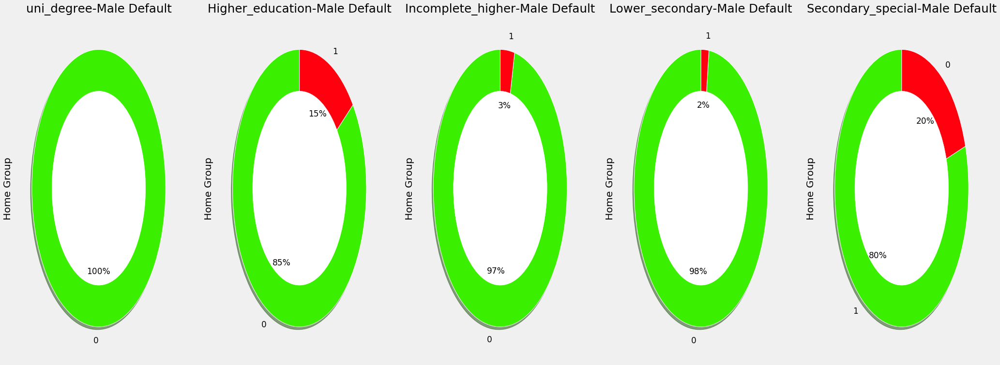

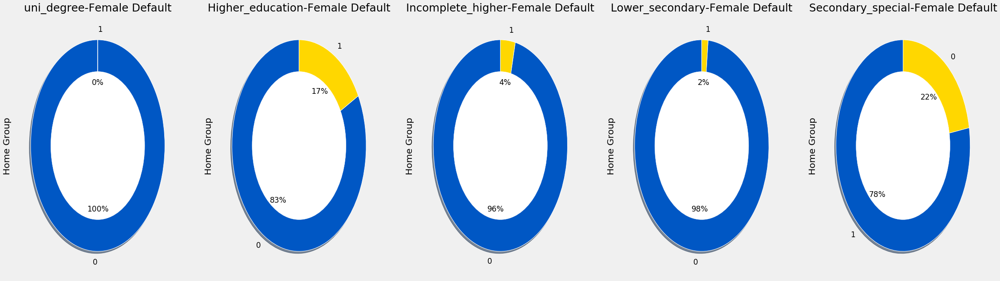

In [208]:
#from wordcloud import WordCloud,STOPWORDS
import io
import base64
import itertools
from matplotlib import rc,animation
from mpl_toolkits.mplot3d import Axes3D
#from mpl_toolkits.basemap import Basemap
#import folium
#import folium.plugins
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls

default = df[(df["TARGET"]==1) & (df["Male"]==1)][['uni_degree', 'Higher_education', 'Incomplete_higher', 'Lower_secondary', 'Secondary_special']]
non_default = df[(df["TARGET"]==1) & (df["Female"]==1)][['uni_degree', 'Higher_education', 'Incomplete_higher', 'Lower_secondary', 'Secondary_special']]

d_cols = ['uni_degree', 'Higher_education', 'Incomplete_higher', 'Lower_secondary', 'Secondary_special']
d_length = len(d_cols)

fig = plt.figure(figsize=(32,12))
for i,j in itertools.zip_longest(d_cols,range(d_length)):
    plt.subplot(1,5,j+1)
    default[i].value_counts().plot.pie(autopct = "%1.0f%%",colors = sns.color_palette("prism"),startangle = 90,
                                        wedgeprops={"linewidth":1,"edgecolor":"white"},shadow =True)
    circ = plt.Circle((0,0),.7,color="white")
    plt.gca().add_artist(circ)
    plt.ylabel("Home Group")
    plt.title(i+"-Male Default")
    
fig = plt.figure(figsize=(35,10))
for i,j in itertools.zip_longest(d_cols,range(d_length)):
    plt.subplot(1,5,j+1)
    non_default[i].value_counts().plot.pie(autopct = "%1.0f%%",colors = sns.color_palette("prism",3),startangle = 90,
                                           wedgeprops={"linewidth":1,"edgecolor":"white"},shadow =True)
    circ = plt.Circle((0,0),.7,color="white")
    plt.gca().add_artist(circ)
    plt.ylabel("Home Group")
    plt.title(i+"-Female Default")

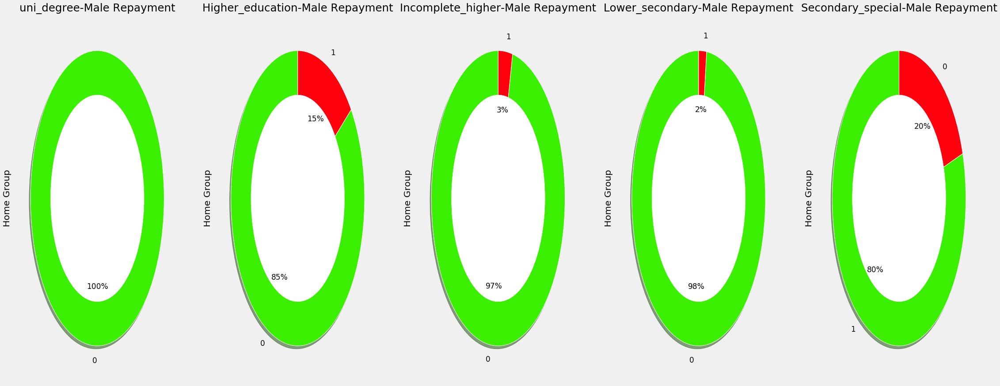

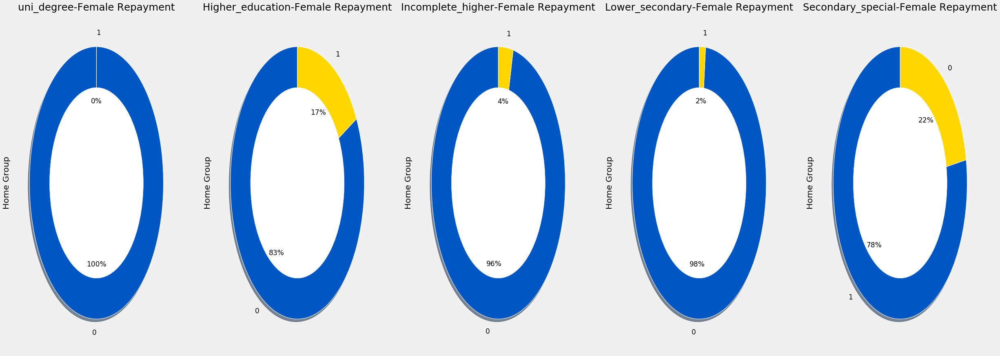

In [209]:
#from wordcloud import WordCloud,STOPWORDS
import io
import base64
import itertools
from matplotlib import rc,animation
from mpl_toolkits.mplot3d import Axes3D
#from mpl_toolkits.basemap import Basemap
#import folium
#import folium.plugins
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls

default = df[(df["TARGET"]==1) & (df["Male"]==1)][['uni_degree', 'Higher_education', 'Incomplete_higher', 'Lower_secondary', 'Secondary_special']]
non_default = df[(df["TARGET"]==1) & (df["Female"]==1)][['uni_degree', 'Higher_education', 'Incomplete_higher', 'Lower_secondary', 'Secondary_special']]

d_cols = ['uni_degree', 'Higher_education', 'Incomplete_higher', 'Lower_secondary', 'Secondary_special']
d_length = len(d_cols)

fig = plt.figure(figsize=(35,14))
for i,j in itertools.zip_longest(d_cols,range(d_length)):
    plt.subplot(1,5,j+1)
    default[i].value_counts().plot.pie(autopct = "%1.0f%%",colors = sns.color_palette("prism"),startangle = 90,
                                        wedgeprops={"linewidth":1,"edgecolor":"white"},shadow =True)
    circ = plt.Circle((0,0),.7,color="white")
    plt.gca().add_artist(circ)
    plt.ylabel("Home Group")
    plt.title(i+"-Male Repayment")
    
fig = plt.figure(figsize=(38,14))
for i,j in itertools.zip_longest(d_cols,range(d_length)):
    plt.subplot(1,5,j+1)
    non_default[i].value_counts().plot.pie(autopct = "%1.0f%%",colors = sns.color_palette("prism",3),startangle = 90,
                                           wedgeprops={"linewidth":1,"edgecolor":"white"},shadow =True)
    circ = plt.Circle((0,0),.7,color="white")
    plt.gca().add_artist(circ)
    plt.ylabel("Home Group")
    plt.title(i+"-Female Repayment")


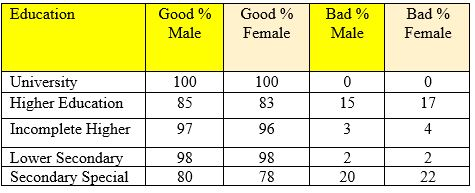

In [317]:
from IPython.display import Image
Image(filename='C:/Users/mrferozi/Desktop/Thesis 2019/Img/edu3.jpg')

### Taiwan Dataset

References:* From the Taiwan Credit Risk Analysis : Beginner's Guide: [ Beginner's Guide ](https://www.kaggle.com/pahulpreet/german-credit-risk-analysis-beginner-s-guide/notebook)*

In [341]:
def visualize_distribution(attr):
    Paid = Taiwan[Taiwan["Target"]==0]
    Unpaid = Taiwan[Taiwan["Target"]==1]
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15,5))
    attr_Paid = Paid[[attr, 'Target']].groupby(attr).count()
    attr_Unpaid = Unpaid[[attr, 'Target']].groupby(attr).count()
    ax[0].barh( attr_Paid['Target'].index.tolist(), attr_Paid['Target'].tolist(), align='center', color="#5975A4")
    ax[1].barh( attr_Unpaid['Target'].index.tolist(), attr_Unpaid['Target'].tolist(), align='center', color="#B55D60")
    ax[0].set_title('0')
    ax[1].set_title('1')
    ax[0].invert_xaxis()
    ax[1].yaxis.tick_right()
    
    num_para_change=["Present residence since","Number of existing credits at this bank","Installment rate in percentage of disposable income","Number of people being liable to provide maintenance for"]
    if attr in num_para_change:
        for i, v in enumerate(attr_Paid['Target'].tolist()):
            ax[0].text(v+15, i+1, str(v), color='black')
        for i, v in enumerate(attr_Unpaid['Target'].tolist()):
            ax[1].text(v+2, i+1, str(v), color='black')
    else:
        for i, v in enumerate(attr_Paid['Target'].tolist()):
            ax[0].text(v+25, i + .05, str(v), color='black')
        for i, v in enumerate(attr_Unpaid['Target'].tolist()):
            ax[1].text(v+1, i + .05, str(v), color='black')
    plt.suptitle(attr)
    plt.tight_layout()
    plt.show()

#### Education
- 1=graduate school
- 2=university
- 3=high school
- 4=others
- 5=unknown 
- 6=unknown

array([<matplotlib.axes._subplots.AxesSubplot object at 0x0000015F22EC0CC0>], dtype=object)

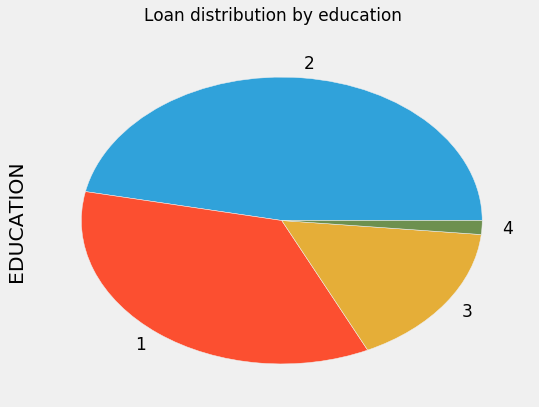

In [342]:
plt.figure(figsize = (8, 6))
fil = (Taiwan.EDUCATION == 5) | (Taiwan.EDUCATION == 6) | (Taiwan.EDUCATION == 0)
Taiwan.loc[fil, 'EDUCATION'] = 4
Taiwan.EDUCATION.value_counts().plot(kind='pie',figsize=(20, 10), title='Loan distribution by education',subplots=True)

#### Education
- 1=graduate school
- 2=university
- 3=high school
- 4=others
- 5=unknown 
- 6=unknown
#### Target
- paid on time=0 
- unpaid= 1

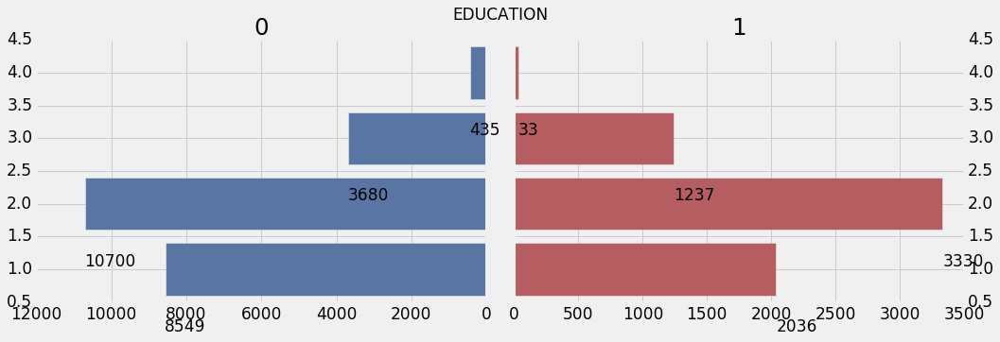

In [343]:
visualize_distribution("EDUCATION")

In [344]:
Taiwan.dtypes

LIMIT_BAL         float64
Gender              int64
EDUCATION           int64
Martial_Status      int64
AGE                 int32
PAY_0               int64
PAY_2               int64
PAY_3               int64
PAY_4               int64
PAY_5               int64
PAY_6               int64
BILL_AMT1         float64
BILL_AMT2         float64
BILL_AMT3         float64
BILL_AMT4         float64
BILL_AMT5         float64
BILL_AMT6         float64
PAY_AMT1          float64
PAY_AMT2          float64
PAY_AMT3          float64
PAY_AMT4          float64
PAY_AMT5          float64
PAY_AMT6          float64
Target              int64
Credit_Amount       int32
AGE_Group          object
dtype: object

In [345]:
#create a new data frame
#df['']=train[''].astype(int)
df = pd.DataFrame()
df['Gender']=Taiwan['Gender']
df['EDUCATION']=Taiwan['EDUCATION']
df['TARGET']=Taiwan['Target'].astype(int)


In [346]:
df.Gender.replace(1,'male',inplace=True)
df.Gender.replace(2,'female',inplace=True)

In [347]:
df.head(8)

,Gender,EDUCATION,TARGET
0,female,2,1
1,female,2,1
2,female,2,0
3,female,2,0
4,male,2,0
5,male,1,0
6,male,1,0
7,female,2,0


In [348]:
# Gender vs Purpose let's see the purpose of having credit loans for each gender.
df["EDUCATION"].unique()
gen_edu = pd.crosstab(df['EDUCATION'], df['Gender']).apply(lambda x: x/x.sum() * 100)
gen_edu

Gender,female,male
EDUCATION,,
1,34.402606,36.625168
2,47.791519,45.205249
3,16.160557,16.739569
4,1.645318,1.430013


#### Education
- 1=graduate school
- 2=university
- 3=high school
- 4=others
- 5=unknown 
- 6=unknown
#### Target
- paid on time=0 
- unpaid= 1

In [349]:
# Values into list
m_purpose = gen_edu['male'].values.tolist()
f_purpose = gen_edu['female'].values.tolist()

# Round values
male_purpose = ['%.2f' % elem for elem in m_purpose]
female_purpose = ['%.2f' % elem for elem in f_purpose]

male = go.Bar(
    y=['Graduate school', 'University Degree', 'High school', 'Other'],
    x=male_purpose,
    name='Males',
    text='(%)',
    orientation = 'h',
    marker = dict(
        color = 'rgba(72, 92, 238, 0.6)',
        line = dict(
            color = 'rgba(72, 92, 238, 1.0)',
            width = 3)
    )
)
female = go.Bar(
    y=['Graduate school', 'University Degree', 'High school', 'Other'],
    x=female_purpose,
    name='Females',
    text='(%)',
    orientation = 'h',
    marker = dict(
        color = 'rgba(217, 128, 234, 0.6)',
        line = dict(
            color = 'rgba(217, 128, 234, 1.0)',
            width = 3)
    )
)

data = [male, female]
layout = dict(
    title='Application Reasons for a Loan by Education',
     xaxis=dict(
        title='(% of Education)',
        titlefont=dict(
            family='Arial, sans-serif',
            size=11,
            color='black'
        ),
        showticklabels=True,
        tickangle=45,
        tickfont=dict(
            family='Old Standard TT, serif',
            size=14,
            color='black'
        ),
        exponentformat='e',
        showexponent='all'
    ),
    yaxis=dict(
        title='Purpose for the Loan',
        titlefont=dict(
            family='Arial, sans-serif',
            size=11,
            color='black'
        ),
        showticklabels=True,
        tickangle=40,
        tickfont=dict(
            family='Old Standard TT, serif',
            size=10,
            color='black'
        ),
        exponentformat='e',
        showexponent='all'
    ),
    barmode='stack'
)

fig = dict(data=data, layout=layout)
iplot(fig, filename='marker-h-bar')

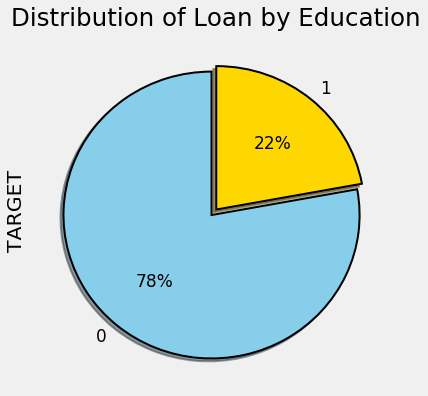

In [350]:
plt.figure(figsize=(13,6))
plt.subplot(121)
df["TARGET"].value_counts().plot.pie(autopct = "%1.0f%%",colors = ["skyblue","gold"],startangle = 90,
                                              wedgeprops={"linewidth":2,"edgecolor":"k"},explode=[0.05,0],shadow =True)
plt.title("Distribution of Loan by Education")

plt.show()



#### Education
- 1=graduate school
- 2=university
- 3=high school
- 4=others

#### Target
- paid on time=0 
- unpaid= 1

In [351]:
df.EDUCATION.replace(1,'School graduate',inplace=True)
df.EDUCATION.replace(2,'University Degree',inplace=True)
df.EDUCATION.replace(3,'High School',inplace=True)
df.EDUCATION.replace(4,'Other',inplace=True)

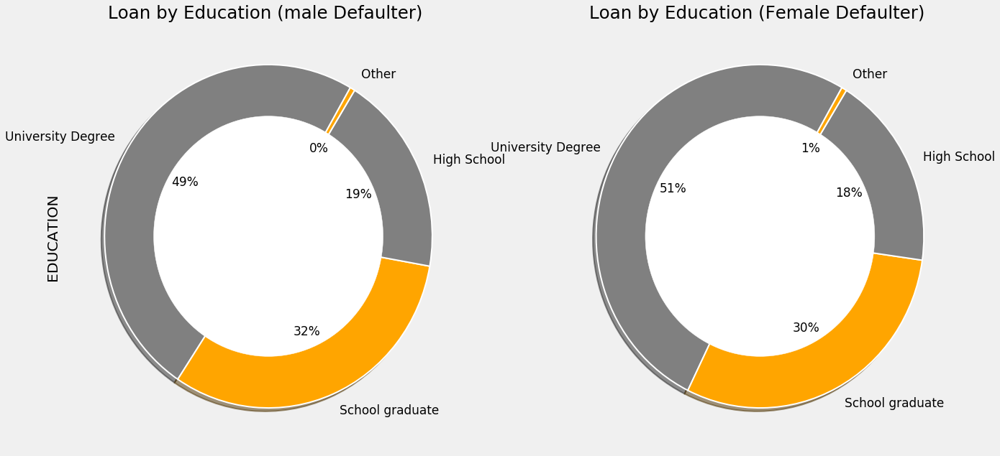

In [353]:
plt.figure(figsize=(20,10))
plt.subplot(121)
df[(df["TARGET"] == 1) & (df['Gender'] == 'male')]["EDUCATION"].value_counts().plot.pie(autopct = "%1.0f%%",colors = ["grey","orange"],startangle = 60,
                                                                        wedgeprops={"linewidth":2,"edgecolor":"white"},shadow =True)
circ = plt.Circle((0,0),.7,color="white")
plt.gca().add_artist(circ) 
plt.title("Loan by Education (male Defaulter) ")

plt.subplot(122)
df[(df["TARGET"] == 1) & (df['Gender'] == 'female')]["EDUCATION"].value_counts().plot.pie(autopct = "%1.0f%%",colors = ["grey","orange"],startangle = 60,
                                                                        wedgeprops={"linewidth":2,"edgecolor":"white"},shadow =True)
circ = plt.Circle((0,0),.7,color="white")
plt.gca().add_artist(circ)
plt.ylabel("")
plt.title("Loan by Education (Female Defaulter) ")
plt.show()

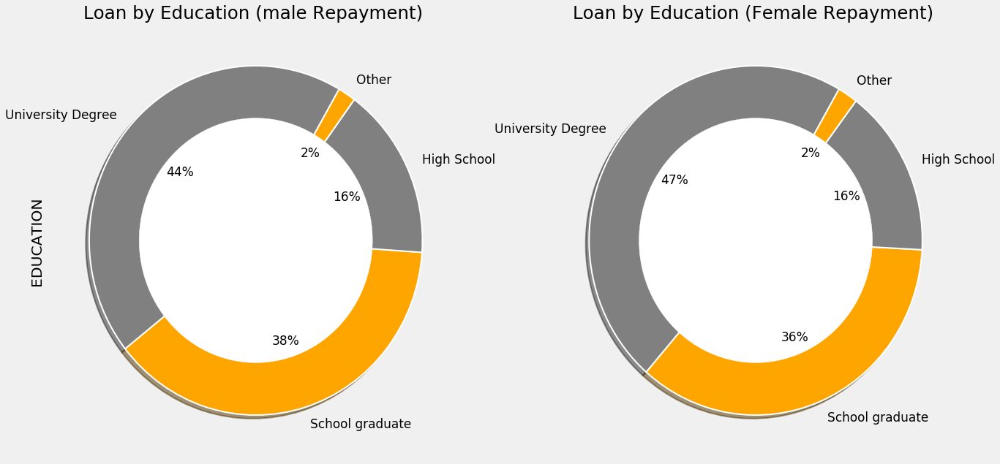

In [354]:
plt.figure(figsize=(20,10))
plt.subplot(121)
df[(df["TARGET"] == 0) & (df['Gender'] == 'male')]["EDUCATION"].value_counts().plot.pie(autopct = "%1.0f%%",colors = ["grey","orange"],startangle = 60,
                                                                        wedgeprops={"linewidth":2,"edgecolor":"white"},shadow =True)
circ = plt.Circle((0,0),.7,color="white")
plt.gca().add_artist(circ) 
plt.title("Loan by Education (male Repayment) ")

plt.subplot(122)
df[(df["TARGET"] == 0) & (df['Gender'] == 'female')]["EDUCATION"].value_counts().plot.pie(autopct = "%1.0f%%",colors = ["grey","orange"],startangle = 60,
                                                                        wedgeprops={"linewidth":2,"edgecolor":"white"},shadow =True)
circ = plt.Circle((0,0),.7,color="white")
plt.gca().add_artist(circ)
plt.ylabel("")
plt.title("Loan by Education (Female Repayment) ")
plt.show()

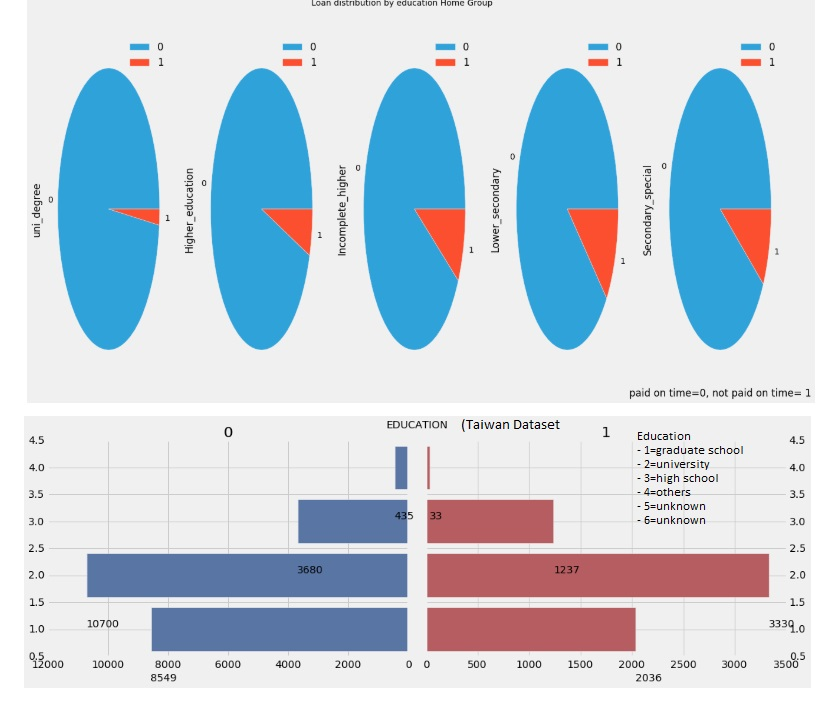

In [226]:
from IPython.display import Image
Image(filename='C:/Users/mrferozi/Desktop/Thesis 2019/Img/edu.jpg')

After analysing education factor in the loan default domain, it seems that customer with Incomplete Higher education or lower secondary education are less enthuses to repay their debts. Where customer with higher education are very vigilant to give back their loan. 

### Profession Type

The human brain is very adaptive. The societal and economic conditions have a immense impression on a person's mental status. Human personality is variable and could change with given circumstances. A human behaviour is coming from, how and who we interact in our everyday life which also include human surrounding and financial status. This section of the study, research focused on how different job type will affects loan default. To enhance for further job type column has been hot coded and further separated into 18 various logical categories. 

### Home Group Dataset

In [227]:
train.dtypes

NAME_CONTRACT_TYPE                           int64
FLAG_OWN_CAR                                 int64
FLAG_OWN_REALTY                              int64
CNT_CHILDREN                                 int64
AMT_INCOME_TOTAL                           float64
AMT_CREDIT                                 float64
AMT_ANNUITY                                float64
AMT_GOODS_PRICE                            float64
REGION_POPULATION_RELATIVE                 float64
DAYS_BIRTH                                   int64
DAYS_EMPLOYED                              float64
DAYS_REGISTRATION                          float64
DAYS_ID_PUBLISH                              int64
OWN_CAR_AGE                                float64
FLAG_MOBIL                                   int64
FLAG_EMP_PHONE                               int64
FLAG_WORK_PHONE                              int64
FLAG_CONT_MOBILE                             int64
FLAG_PHONE                                   int64
FLAG_EMAIL                     

In [228]:
#create a new data frame
cols = ['Account','Cleaning','Cooking','Core','Drivers','HR',
       'Tech','IT','Laborers','Low_Lab','Managers','Medicine','Private','Re_agents','Sales','Secretaries','Security',
        'Waiters']
df = pd.DataFrame(columns=cols)
df['Account']=train['OCCUPATION_TYPE_Accountants'].astype(int)                  
df['Cleaning']=train['OCCUPATION_TYPE_Cleaning staff'].astype(int)               
df['Cooking']=train['OCCUPATION_TYPE_Cooking staff'].astype(int)                
df['Core']=train['OCCUPATION_TYPE_Core staff'].astype(int)                   
df['Drivers']=train['OCCUPATION_TYPE_Drivers'].astype(int)                      
df['HR']=train['OCCUPATION_TYPE_HR staff'].astype(int)                     
df['Tech']=train['OCCUPATION_TYPE_High skill tech staff'].astype(int)        
df['IT']=train['OCCUPATION_TYPE_IT staff'].astype(int)                     
df['Laborers']=train['OCCUPATION_TYPE_Laborers'].astype(int)                     
df['Low_Lab']=train['OCCUPATION_TYPE_Low-skill Laborers'].astype(int)           
df['Managers']=train['OCCUPATION_TYPE_Managers'].astype(int)                     
df['Medicine']=train['OCCUPATION_TYPE_Medicine staff'].astype(int)               
df['Private']=train['OCCUPATION_TYPE_Private service staff'].astype(int)        
df['Re_agents']=train['OCCUPATION_TYPE_Realty agents'].astype(int)                
df['Sales']=train['OCCUPATION_TYPE_Sales staff'].astype(int)                  
df['Secretaries']=train['OCCUPATION_TYPE_Secretaries'].astype(int)                  
df['Security']=train['OCCUPATION_TYPE_Security staff'].astype(int)               
df['Waiters']=train['OCCUPATION_TYPE_Waiters/barmen staff'].astype(int)
df['TARGET']=train['TARGET'].astype(int)
df['Male']=train['CODE_GENDER_M'].astype(int)
df['Female']=train['CODE_GENDER_F'].astype(int)
df1=df

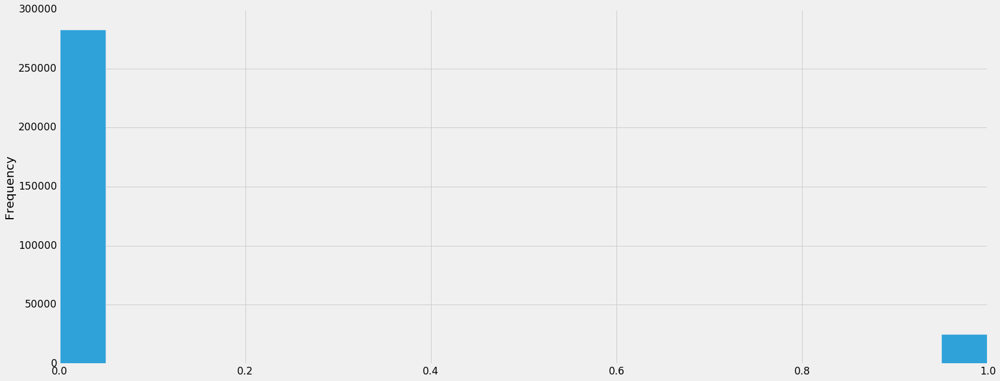

In [229]:
df.TARGET.plot(kind='hist', bins=20)

In [230]:
TARGET_counts = df.groupby('TARGET').aggregate(sum)
TARGET_counts

,Account,Cleaning,Cooking,Core,Drivers,HR,Tech,IT,Laborers,Low_Lab,Managers,Medicine,Private,Re_agents,Sales,Secretaries,Security,Waiters,Male,Female
TARGET,,,,,,,,,,,,,,,,,,,,
0,9339,4206,5325,25832,16496,527,10679,492,49348,1734,20043,7965,2477,692,29010,1213,5999,1196,94404,188278
1,474,447,621,1738,2107,36,701,34,5838,359,1328,572,175,59,3092,92,722,152,10655,14170


In [231]:
df=pd.DataFrame(TARGET_counts)

#### Target
- paid on time=0 
- unpaid= 1

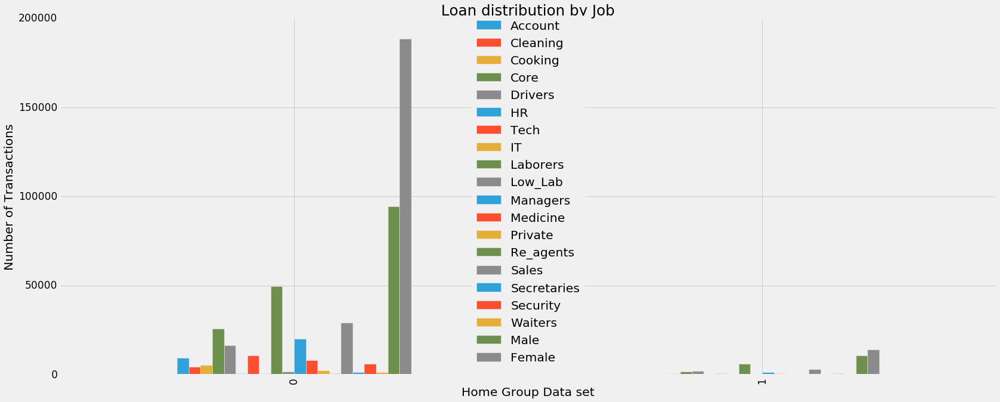

In [232]:
df.groupby('TARGET').mean().plot(kind='bar', title='Loan distribution by Job')
plt.xlabel('Home Group Data set')
plt.ylabel('Number of Transactions')

In [233]:
df1.dtypes

Account        int32
Cleaning       int32
Cooking        int32
Core           int32
Drivers        int32
HR             int32
Tech           int32
IT             int32
Laborers       int32
Low_Lab        int32
Managers       int32
Medicine       int32
Private        int32
Re_agents      int32
Sales          int32
Secretaries    int32
Security       int32
Waiters        int32
TARGET         int32
Male           int32
Female         int32
dtype: object

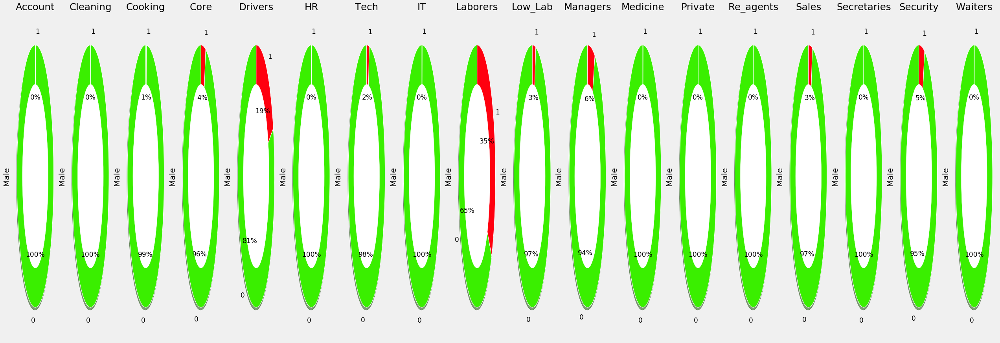

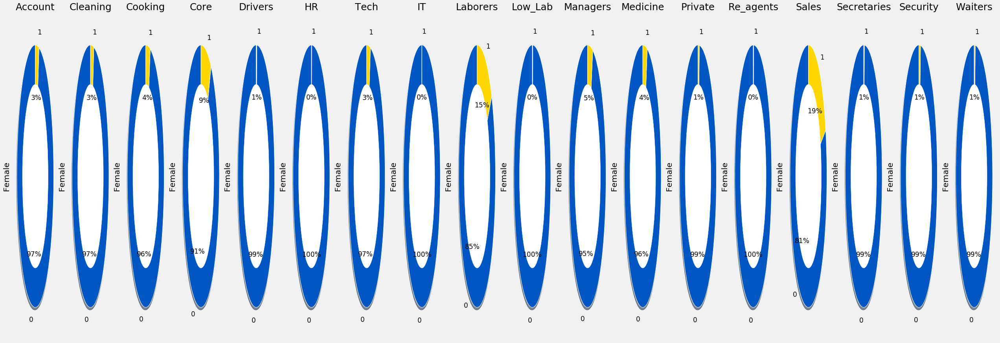

In [234]:
#from wordcloud import WordCloud,STOPWORDS
import io
import base64
import itertools
from matplotlib import rc,animation
from mpl_toolkits.mplot3d import Axes3D
#from mpl_toolkits.basemap import Basemap
#import folium
#import folium.plugins
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls

df=df1

default = df[(df["TARGET"]==1) & (df["Male"]==1)][['Account','Cleaning','Cooking','Core','Drivers','HR',
       'Tech','IT','Laborers','Low_Lab','Managers','Medicine','Private','Re_agents','Sales','Secretaries','Security',
        'Waiters']] 
non_default = df[(df["TARGET"]==1) & (df["Female"]==1)][['Account','Cleaning','Cooking','Core','Drivers','HR',
       'Tech','IT','Laborers','Low_Lab','Managers','Medicine','Private','Re_agents','Sales','Secretaries','Security',
        'Waiters']] 
d_cols = ['Account','Cleaning','Cooking','Core','Drivers','HR',
       'Tech','IT','Laborers','Low_Lab','Managers','Medicine','Private','Re_agents','Sales','Secretaries','Security',
        'Waiters']

d_length = len(d_cols)

fig = plt.figure(figsize=(40,14))
for i,j in itertools.zip_longest(d_cols,range(d_length)):
    plt.subplot(1,18,j+1)
    default[i].value_counts().plot.pie(autopct = "%1.0f%%",colors = sns.color_palette("prism"),startangle = 90,
                                        wedgeprops={"linewidth":1,"edgecolor":"white"},shadow =True)
    circ = plt.Circle((0,0),.7,color="white")
    plt.gca().add_artist(circ)
    plt.ylabel("Male")
    plt.title(i+"")
    
fig = plt.figure(figsize=(40,14))
for i,j in itertools.zip_longest(d_cols,range(d_length)):
    plt.subplot(1,18,j+1)
    non_default[i].value_counts().plot.pie(autopct = "%1.0f%%",colors = sns.color_palette("prism",3),startangle = 90,
                                           wedgeprops={"linewidth":1,"edgecolor":"white"},shadow =True)
    circ = plt.Circle((0,0),.7,color="white")
    plt.gca().add_artist(circ)
    plt.ylabel("Female")
    plt.title(i+"")


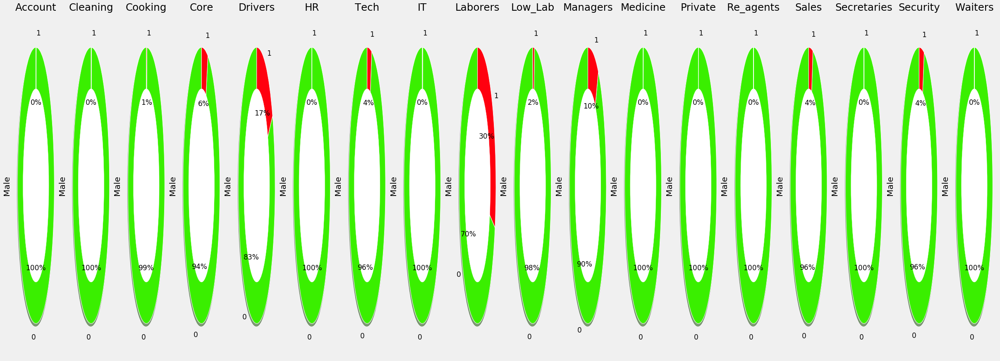

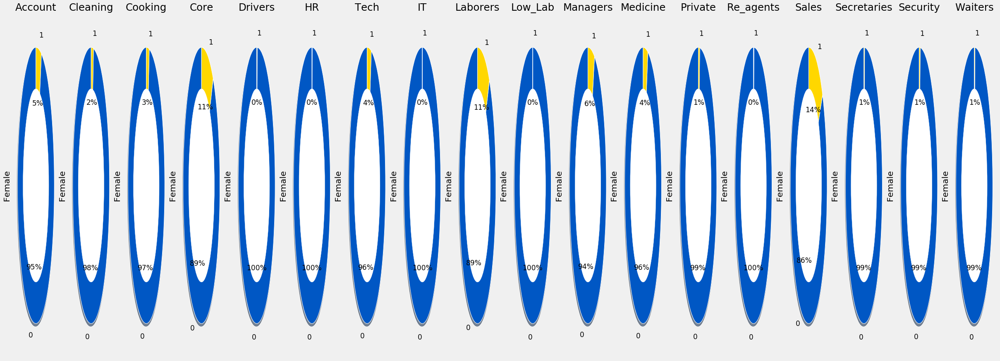

In [235]:
#from wordcloud import WordCloud,STOPWORDS
import io
import base64
import itertools
from matplotlib import rc,animation
from mpl_toolkits.mplot3d import Axes3D
#from mpl_toolkits.basemap import Basemap
#import folium
#import folium.plugins
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls

df=df1

default = df[(df["TARGET"]==0) & (df["Male"]==1)][['Account','Cleaning','Cooking','Core','Drivers','HR',
       'Tech','IT','Laborers','Low_Lab','Managers','Medicine','Private','Re_agents','Sales','Secretaries','Security',
        'Waiters']] 
non_default = df[(df["TARGET"]==0) & (df["Female"]==1)][['Account','Cleaning','Cooking','Core','Drivers','HR',
       'Tech','IT','Laborers','Low_Lab','Managers','Medicine','Private','Re_agents','Sales','Secretaries','Security',
        'Waiters']] 
d_cols = ['Account','Cleaning','Cooking','Core','Drivers','HR',
       'Tech','IT','Laborers','Low_Lab','Managers','Medicine','Private','Re_agents','Sales','Secretaries','Security',
        'Waiters']

d_length = len(d_cols)

fig = plt.figure(figsize=(38,14))
for i,j in itertools.zip_longest(d_cols,range(d_length)):
    plt.subplot(1,18,j+1)
    default[i].value_counts().plot.pie(autopct = "%1.0f%%",colors = sns.color_palette("prism"),startangle = 90,
                                        wedgeprops={"linewidth":1,"edgecolor":"white"},shadow =True)
    circ = plt.Circle((0,0),.7,color="white")
    plt.gca().add_artist(circ)
    plt.ylabel("Male")
    plt.title(i+"")
    
fig = plt.figure(figsize=(38,14))
for i,j in itertools.zip_longest(d_cols,range(d_length)):
    plt.subplot(1,18,j+1)
    non_default[i].value_counts().plot.pie(autopct = "%1.0f%%",colors = sns.color_palette("prism",3),startangle = 90,
                                           wedgeprops={"linewidth":1,"edgecolor":"white"},shadow =True)
    circ = plt.Circle((0,0),.7,color="white")
    plt.gca().add_artist(circ)
    plt.ylabel("Female")
    plt.title(i+"")


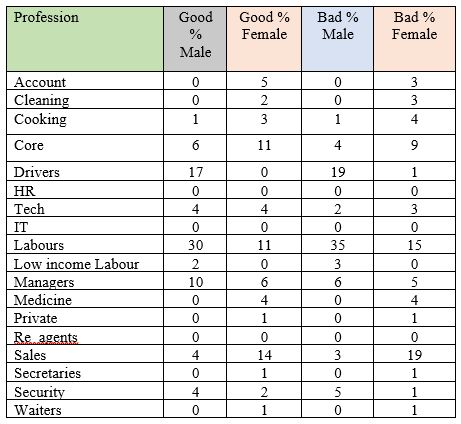

In [236]:
from IPython.display import Image
Image(filename='C:/Users/mrferozi/Desktop/Thesis 2019/Img/job1.jpg')

### German Dataset

##### Job
- management/ highly qualified employee represent by  0
- skilled employee / official represent by 1
- unskilled - resident represent by 2
- unemployed/ unskilled  - non-resident represent by 3

In [356]:
TARGET_counts = German.groupby('Target').aggregate(sum)
TARGET_counts

,Duration_month,Credit_amount,Installment_rate%,Gender,Present_res_lenght,Age,Number_Credit,No_dependent,foreign_worker,Status_checking_account_0,...,Housing_1,Housing_2,Job_0,Job_1,Job_2,Job_3,Martial_status_1,Martial_status_2,Martial_status_3,Martial_status_4
Target,,,,,,,,,,,,,,,,,,,,,
0,13445,2089820,2044,499,1990,25335,997,809,667,348.0,...,527.0,109.0,97.0,444.0,144.0,15.0,402.0,67.0,201.0,30.0
1,7458,1181438,929,191,855,10185,410,346,296,46.0,...,186.0,70.0,51.0,186.0,56.0,7.0,146.0,25.0,109.0,20.0


In [357]:
#create a new data frame
cols = ['management/ highly qualified','skilled employee / official','unskilled - resident','unemployed/ unskilled - non-resident']
df = pd.DataFrame(columns=cols)
df['TARGET']=German['Target'].astype(int)
df['management/ highly qualified']=German['Job_0'].astype(int)                  
df['skilled employee / official']=German['Job_1'].astype(int)               
df['unskilled - resident']=German['Job_2'].astype(int)                
df['unemployed/ unskilled - non-resident']=German['Job_3'].astype(int)                   
df.head(10)

,management/ highly qualified,skilled employee / official,unskilled - resident,unemployed/ unskilled - non-resident,TARGET
0,0,1,0,0,0
1,0,1,0,0,1
2,0,0,1,0,0
3,0,1,0,0,0
4,0,1,0,0,1
5,0,0,1,0,0
6,0,1,0,0,0
7,1,0,0,0,0
8,0,0,1,0,0
9,1,0,0,0,1


In [358]:
TARGET_counts = df.groupby('TARGET').aggregate(sum)
TARGET_counts

,management/ highly qualified,skilled employee / official,unskilled - resident,unemployed/ unskilled - non-resident
TARGET,,,,
0,97,444,144,15
1,51,186,56,7


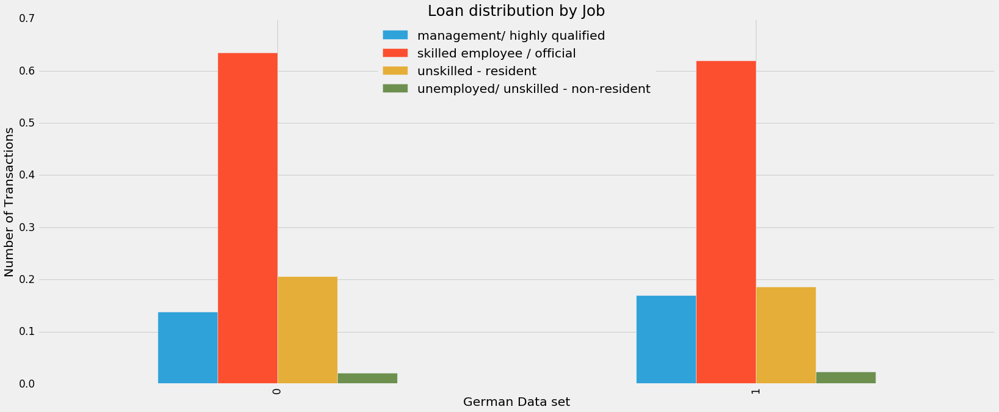

In [359]:
df.groupby('TARGET').mean().plot(kind='bar', title='Loan distribution by Job')
plt.xlabel('German Data set')
plt.ylabel('Number of Transactions')

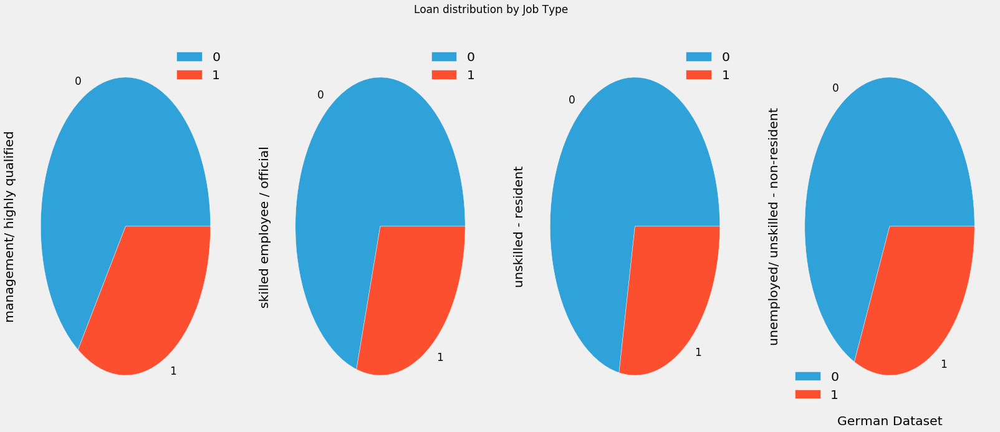

In [360]:
plt.figure(figsize = (8,10))
TARGET_counts.plot(kind='pie', title='Loan distribution by Job Type',subplots=True)
b=plt.xlabel('German Dataset')

In [242]:
df2 = pd.read_csv('C:/Users/mrferozi/Desktop/Thesis 2019/Dataset/German_credit_risk/German_credit_risk1.csv')
df2.dtypes
df=df2


In [243]:
def visualize_distribution(attr):
    Paid = df[df["Target"]==0]
    Unpaid = df[df["Target"]==1]
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15,5))
    attr_Paid = Paid[[attr, 'Target']].groupby(attr).count()
    attr_Unpaid = Unpaid[[attr, 'Target']].groupby(attr).count()
    ax[0].barh( attr_Paid['Target'].index.tolist(), attr_Paid['Target'].tolist(), align='center', color="#5975A4")
    ax[1].barh( attr_Unpaid['Target'].index.tolist(), attr_Unpaid['Target'].tolist(), align='center', color="#B55D60")
    ax[0].set_title('0')
    ax[1].set_title('1')
    ax[0].invert_xaxis()
    ax[1].yaxis.tick_right()
    
    num_para_change=["Present residence since","Number of existing credits at this bank","Installment rate in percentage of disposable income","Number of people being liable to provide maintenance for"]
    if attr in num_para_change:
        for i, v in enumerate(attr_Paid['Target'].tolist()):
            ax[0].text(v+15, i+1, str(v), color='black')
        for i, v in enumerate(attr_Unpaid['Target'].tolist()):
            ax[1].text(v+2, i+1, str(v), color='black')
    else:
        for i, v in enumerate(attr_Paid['Target'].tolist()):
            ax[0].text(v+25, i + .05, str(v), color='black')
        for i, v in enumerate(attr_Unpaid['Target'].tolist()):
            ax[1].text(v+1, i + .05, str(v), color='black')
    plt.suptitle(attr)
    plt.tight_layout()
    plt.show()

##### Job
- management/ highly qualified employee represent by  0
- skilled employee / official represent by 1
- unskilled - resident represent by 2
- unemployed/ unskilled  - non-resident represent by 3

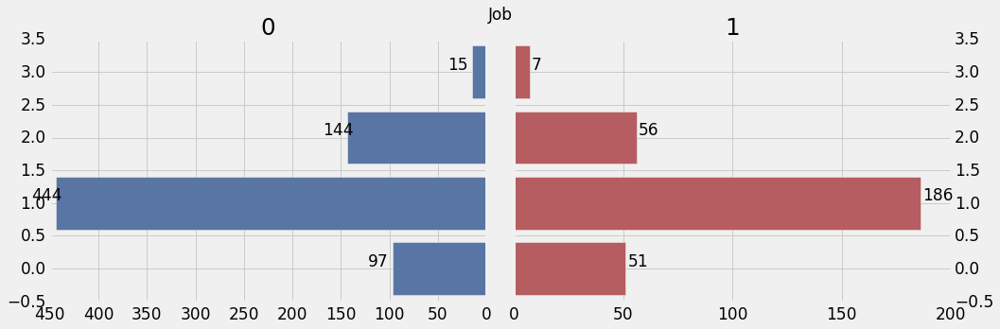

In [244]:
plt.figure(figsize = (10, 8))
visualize_distribution('Job')

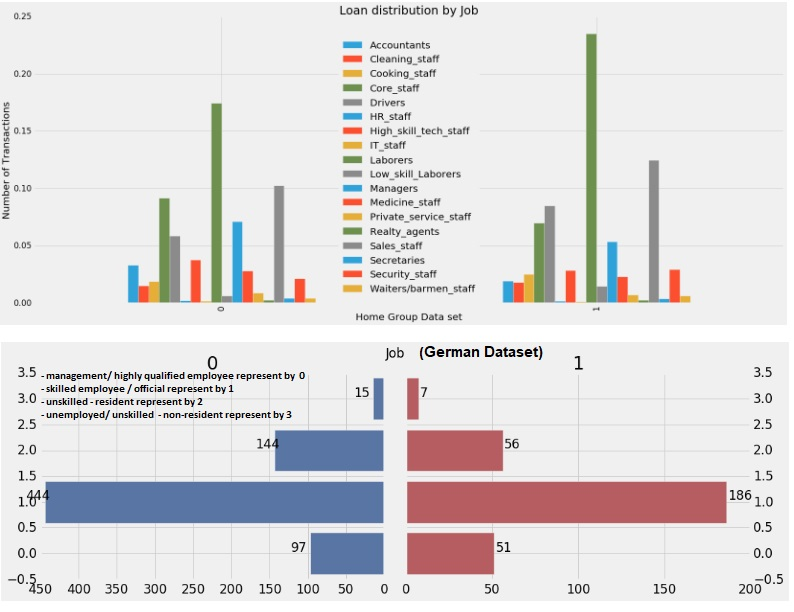

In [245]:
from IPython.display import Image
Image(filename='C:/Users/mrferozi/Desktop/Thesis 2019/Img/job.jpg')

From the above graph it is vital that customer with lower skill sets are more viable to credit default due to deficiency of financial opportunities and shortage of resources.

In [246]:
German.dtypes

Duration_month                int64
Credit_amount                 int64
Installment_rate%             int64
Gender                        int64
Present_res_lenght            int64
Age                           int32
Number_Credit                 int64
No_dependent                  int64
foreign_worker                int64
Target                        int64
Status_checking_account_0     uint8
Status_checking_account_1     uint8
Status_checking_account_2     uint8
Status_checking_account_3     uint8
Credit_history_0              uint8
Credit_history_1              uint8
Credit_history_2              uint8
Credit_history_3              uint8
Credit_history_4              uint8
Purpose_0                     uint8
Purpose_1                     uint8
Purpose_10                    uint8
Purpose_2                     uint8
Purpose_3                     uint8
Purpose_4                     uint8
Purpose_5                     uint8
Purpose_6                     uint8
Purpose_8                   

In [247]:
#create a new data frame
cols = ['management','skilled','unskilled_resident','unemp_unskil_non_resident']
df = pd.DataFrame(columns=cols)
df['TARGET']=German['Target'].astype(int)
df['management']=German['Job_0'].astype(int)                  
df['skilled']=German['Job_1'].astype(int)               
df['unskilled_resident']=German['Job_2'].astype(int)                
df['unemp_unskil_non_resident']=German['Job_3'].astype(int)                   
df['Gender']=German['Gender']
df.Gender.replace(1,'male',inplace=True)
df.Gender.replace(0,'female',inplace=True)

In [248]:
df.head(10)

,management,skilled,unskilled_resident,unemp_unskil_non_resident,TARGET,Gender
0,0,1,0,0,0,male
1,0,1,0,0,1,female
2,0,0,1,0,0,male
3,0,1,0,0,0,male
4,0,1,0,0,1,male
5,0,0,1,0,0,male
6,0,1,0,0,0,male
7,1,0,0,0,0,male
8,0,0,1,0,0,male
9,1,0,0,0,1,male


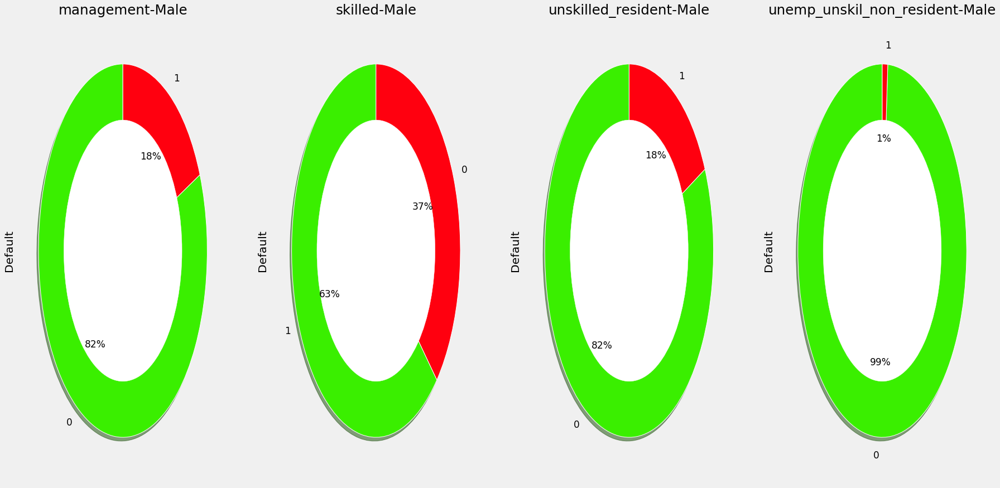

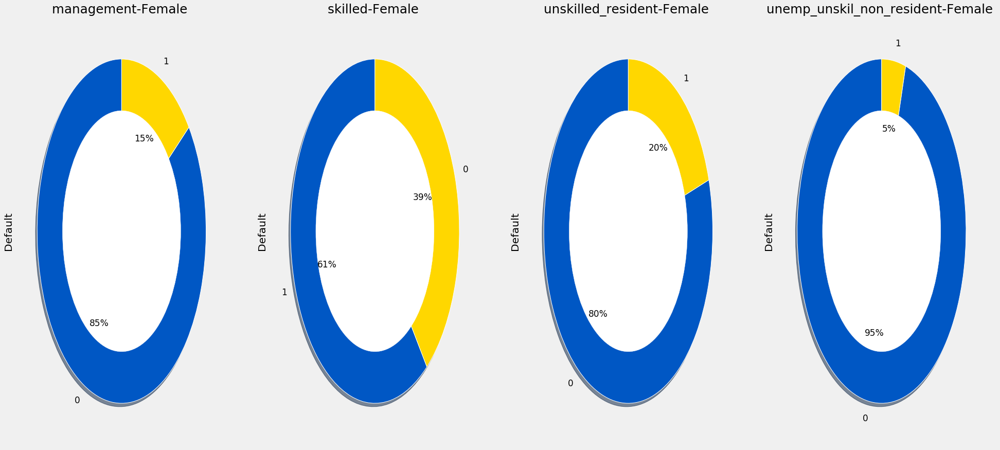

In [249]:
#from wordcloud import WordCloud,STOPWORDS
import io
import base64
import itertools
from matplotlib import rc,animation
from mpl_toolkits.mplot3d import Axes3D
#from mpl_toolkits.basemap import Basemap
#import folium
#import folium.plugins
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls

default = df[(df["TARGET"]==1) & (df["Gender"]=='male')][['management','skilled','unskilled_resident','unemp_unskil_non_resident']]
non_default = df[(df["TARGET"]==1) & (df["Gender"]=='female')][['management','skilled','unskilled_resident','unemp_unskil_non_resident']]

d_cols = ['management','skilled','unskilled_resident','unemp_unskil_non_resident']
d_length = len(d_cols)

fig = plt.figure(figsize=(35,14))
for i,j in itertools.zip_longest(d_cols,range(d_length)):
    plt.subplot(1,5,j+1)
    default[i].value_counts().plot.pie(autopct = "%1.0f%%",colors = sns.color_palette("prism"),startangle = 90,
                                        wedgeprops={"linewidth":1,"edgecolor":"white"},shadow =True)
    circ = plt.Circle((0,0),.7,color="white")
    plt.gca().add_artist(circ)
    plt.ylabel("Default")
    plt.title(i+"-Male")
    
fig = plt.figure(figsize=(38,14))
for i,j in itertools.zip_longest(d_cols,range(d_length)):
    plt.subplot(1,5,j+1)
    non_default[i].value_counts().plot.pie(autopct = "%1.0f%%",colors = sns.color_palette("prism",3),startangle = 90,
                                           wedgeprops={"linewidth":1,"edgecolor":"white"},shadow =True)
    circ = plt.Circle((0,0),.7,color="white")
    plt.gca().add_artist(circ)
    plt.ylabel("Default")
    plt.title(i+"-Female ")


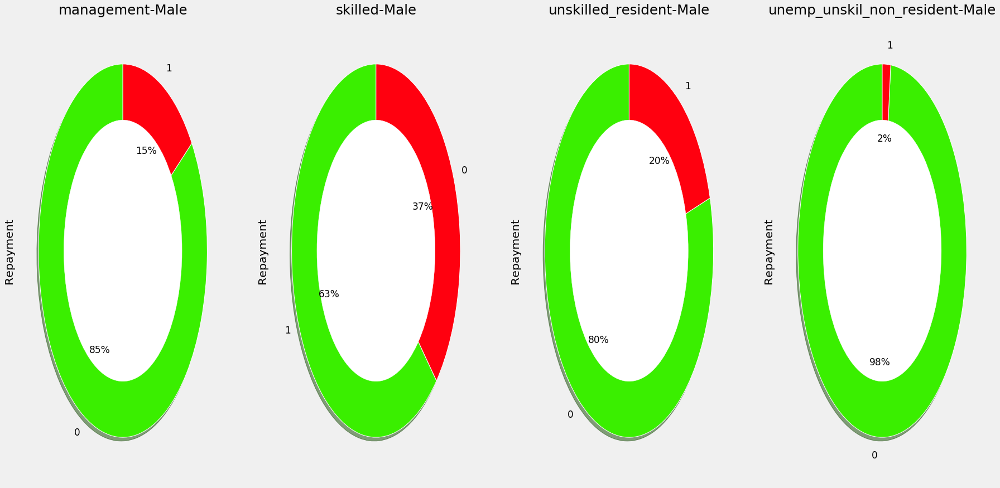

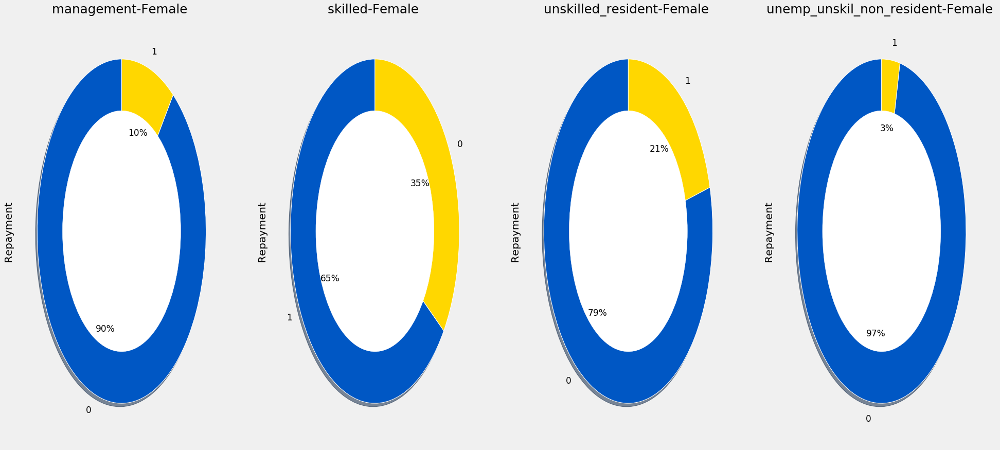

In [250]:
import io
import base64
import itertools
from matplotlib import rc,animation
from mpl_toolkits.mplot3d import Axes3D
#from mpl_toolkits.basemap import Basemap
#import folium
#import folium.plugins
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls

default = df[(df["TARGET"]==0) & (df["Gender"]=='male')][['management','skilled','unskilled_resident','unemp_unskil_non_resident']]
non_default = df[(df["TARGET"]==0) & (df["Gender"]=='female')][['management','skilled','unskilled_resident','unemp_unskil_non_resident']]

d_cols = ['management','skilled','unskilled_resident','unemp_unskil_non_resident']
d_length = len(d_cols)

fig = plt.figure(figsize=(35,14))
for i,j in itertools.zip_longest(d_cols,range(d_length)):
    plt.subplot(1,5,j+1)
    default[i].value_counts().plot.pie(autopct = "%1.0f%%",colors = sns.color_palette("prism"),startangle = 90,
                                        wedgeprops={"linewidth":1,"edgecolor":"white"},shadow =True)
    circ = plt.Circle((0,0),.7,color="white")
    plt.gca().add_artist(circ)
    plt.ylabel("Repayment")
    plt.title(i+"-Male")
    
fig = plt.figure(figsize=(38,14))
for i,j in itertools.zip_longest(d_cols,range(d_length)):
    plt.subplot(1,5,j+1)
    non_default[i].value_counts().plot.pie(autopct = "%1.0f%%",colors = sns.color_palette("prism",3),startangle = 90,
                                           wedgeprops={"linewidth":1,"edgecolor":"white"},shadow =True)
    circ = plt.Circle((0,0),.7,color="white")
    plt.gca().add_artist(circ)
    plt.ylabel("Repayment")
    plt.title(i+"-Female ")

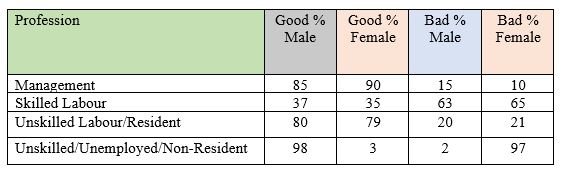

In [251]:
from IPython.display import Image
Image(filename='C:/Users/mrferozi/Desktop/Thesis 2019/Img/job2.jpg')

### Marital status

Due to law in finance sector a creditor can't refused a client a loan because the node is not married or because a client is dissociated. Because the client is widowed, they cannot reject client loan application. Customer relationship status, yet, cannot hurt or help he/she to qualify for a loan. Customer spouse credit score or debts could not hurt client to qualify for a credit loan.It is seeming a broken relationship could affect a person mental and financial condition. A loan taken by a couple will fall into a limbo, if their relationship will not work out. When client divorced, clients can switch off the amount of loan money that the lender grants the client by paying for alimonies every month.This section of the study aims to find a default trend due to marital status.[Marital Status Affects](https://www.mortgageloan.com/how-marital-status-affects-your-ability-get-mortgage-9885)

#### Home Group

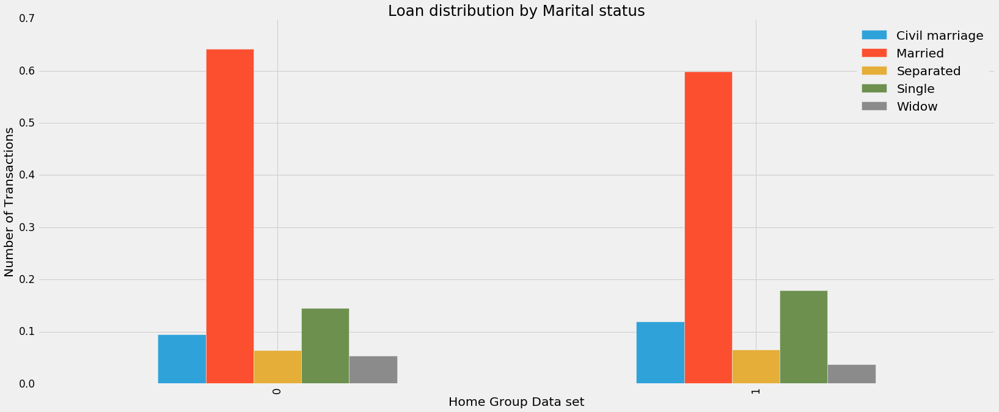

In [362]:
cols = ['TARGET','Civil marriage','Married','Separated','Single','Unknown','Widow']
df = pd.DataFrame(columns=cols)
df['TARGET']=train['TARGET'].astype(int)
df['Civil marriage']=train['NAME_FAMILY_STATUS_Civil marriage'].astype(int)
df['Married']=train['NAME_FAMILY_STATUS_Married'].astype(int)
df['Separated']=train['NAME_FAMILY_STATUS_Separated'].astype(int)
df['Single']=train['NAME_FAMILY_STATUS_Single / not married'].astype(int)
df['Widow']=train['NAME_FAMILY_STATUS_Widow'].astype(int)
df.groupby('TARGET').mean().plot(kind='bar', title='Loan distribution by Marital status')
plt.xlabel('Home Group Data set')
plt.ylabel('Number of Transactions')

In [363]:
TARGET_counts = df.groupby('TARGET').aggregate(sum)
TARGET_counts

,Civil marriage,Married,Separated,Single,Widow
TARGET,,,,,
0,26814,181582,18150,40987,15151
1,2961,14850,1620,4457,937


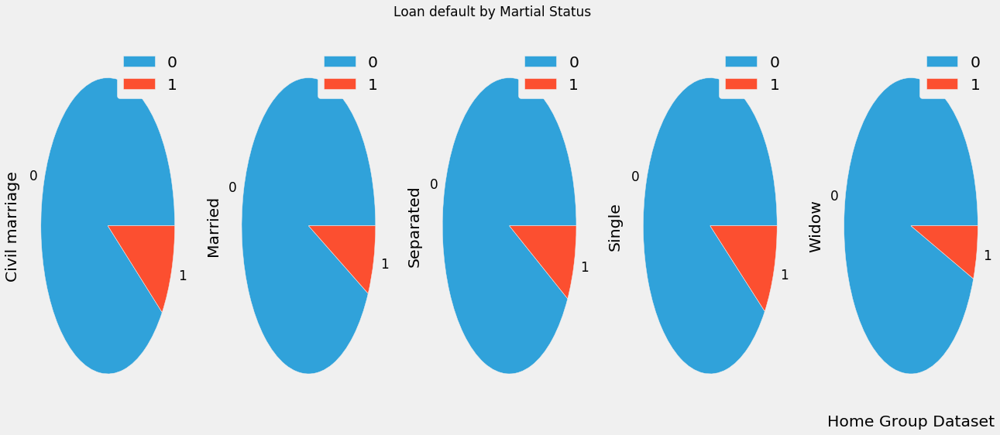

In [364]:
TARGET_counts = df.groupby('TARGET').aggregate(sum)
a= TARGET_counts.plot(kind='pie',figsize=(20, 8), title='Loan default by Martial Status',subplots=True)
b=plt.xlabel('Home Group Dataset')

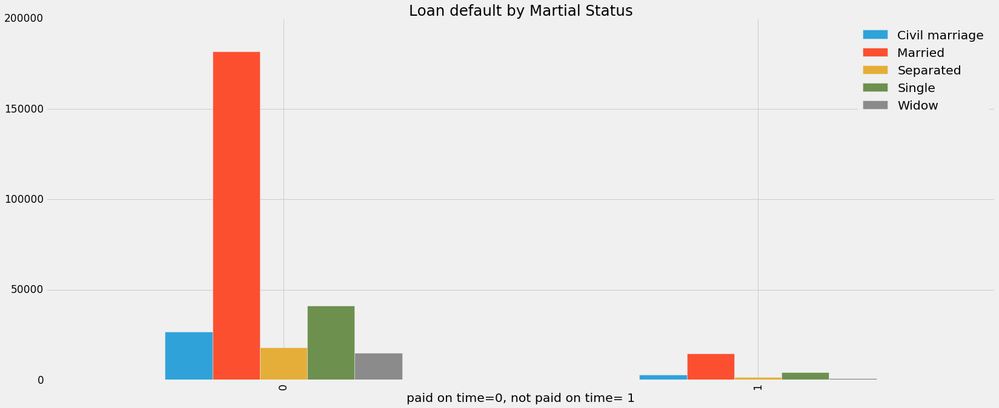

In [365]:
TARGET_counts.plot.bar(title='Loan default by Martial Status')
b=plt.xlabel('paid on time=0, not paid on time= 1')

In [366]:
cols = ['TARGET','Male','Female','Civil marriage','Married','Separated','Single','Widow']
df = pd.DataFrame(columns=cols)
df['TARGET']=train['TARGET'].astype(int)
df['Male']=train['CODE_GENDER_M'].astype(int)
df['Female']=train['CODE_GENDER_F'].astype(int)
df['Civil marriage']=train['NAME_FAMILY_STATUS_Civil marriage'].astype(int)
df['Married']=train['NAME_FAMILY_STATUS_Married'].astype(int)
df['Separated']=train['NAME_FAMILY_STATUS_Separated'].astype(int)
df['Single']=train['NAME_FAMILY_STATUS_Single / not married'].astype(int)
df['Widow']=train['NAME_FAMILY_STATUS_Widow'].astype(int)

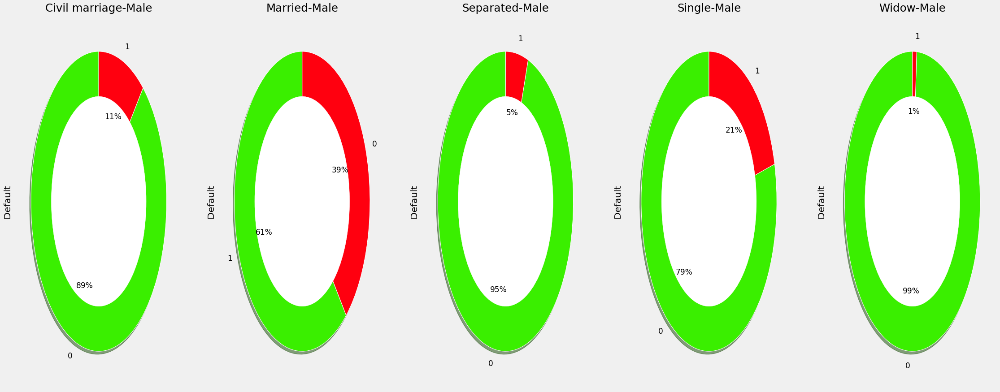

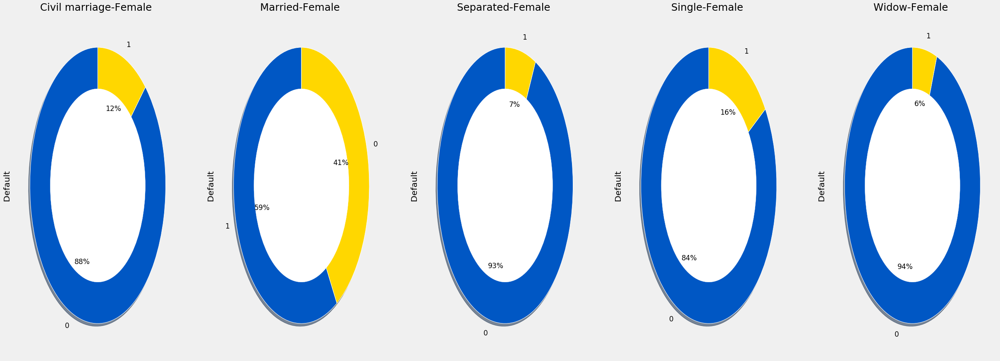

In [367]:
#from wordcloud import WordCloud,STOPWORDS
import io
import base64
import itertools
from matplotlib import rc,animation
from mpl_toolkits.mplot3d import Axes3D
#from mpl_toolkits.basemap import Basemap
#import folium
#import folium.plugins
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls

default = df[(df["TARGET"]==1) & (df["Male"]==1)][['Civil marriage','Married','Separated','Single','Widow']]
non_default = df[(df["TARGET"]==1) & (df["Female"]==1)][['Civil marriage','Married','Separated','Single','Widow']]

d_cols = ['Civil marriage','Married','Separated','Single','Widow']
d_length = len(d_cols)

fig = plt.figure(figsize=(35,14))
for i,j in itertools.zip_longest(d_cols,range(d_length)):
    plt.subplot(1,5,j+1)
    default[i].value_counts().plot.pie(autopct = "%1.0f%%",colors = sns.color_palette("prism"),startangle = 90,
                                        wedgeprops={"linewidth":1,"edgecolor":"white"},shadow =True)
    circ = plt.Circle((0,0),.7,color="white")
    plt.gca().add_artist(circ)
    plt.ylabel("Default")
    plt.title(i+"-Male")
    
fig = plt.figure(figsize=(38,14))
for i,j in itertools.zip_longest(d_cols,range(d_length)):
    plt.subplot(1,5,j+1)
    non_default[i].value_counts().plot.pie(autopct = "%1.0f%%",colors = sns.color_palette("prism",3),startangle = 90,
                                           wedgeprops={"linewidth":1,"edgecolor":"white"},shadow =True)
    circ = plt.Circle((0,0),.7,color="white")
    plt.gca().add_artist(circ)
    plt.ylabel("Default")
    plt.title(i+"-Female ")


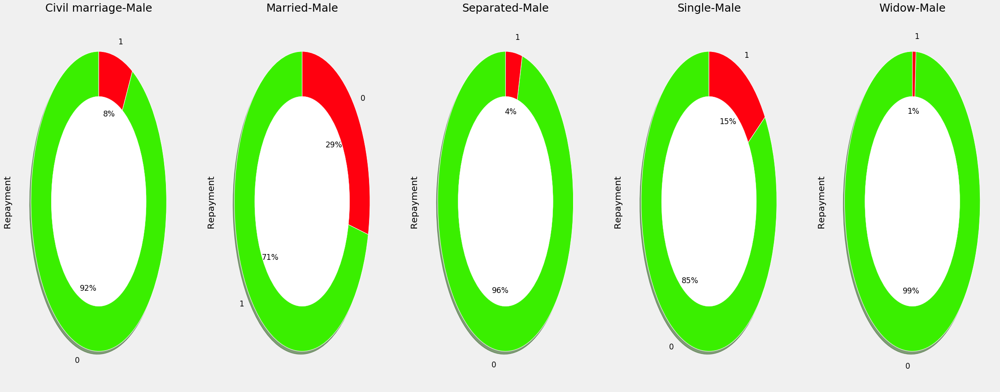

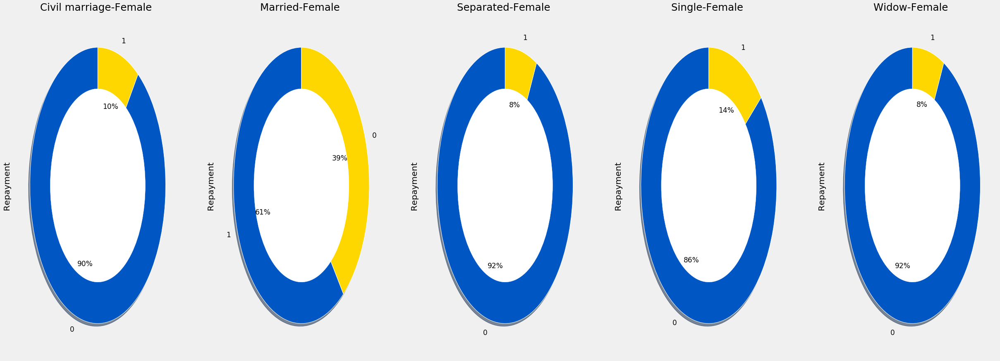

In [368]:
#from wordcloud import WordCloud,STOPWORDS
import io
import base64
import itertools
from matplotlib import rc,animation
from mpl_toolkits.mplot3d import Axes3D
#from mpl_toolkits.basemap import Basemap
#import folium
#import folium.plugins
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls

default = df[(df["TARGET"]==0) & (df["Male"]==1)][['Civil marriage','Married','Separated','Single','Widow']]
non_default = df[(df["TARGET"]==0) & (df["Female"]==1)][['Civil marriage','Married','Separated','Single','Widow']]

d_cols = ['Civil marriage','Married','Separated','Single','Widow']
d_length = len(d_cols)

fig = plt.figure(figsize=(35,14))
for i,j in itertools.zip_longest(d_cols,range(d_length)):
    plt.subplot(1,5,j+1)
    default[i].value_counts().plot.pie(autopct = "%1.0f%%",colors = sns.color_palette("prism"),startangle = 90,
                                        wedgeprops={"linewidth":1,"edgecolor":"white"},shadow =True)
    circ = plt.Circle((0,0),.7,color="white")
    plt.gca().add_artist(circ)
    plt.ylabel("Repayment")
    plt.title(i+"-Male")
    
fig = plt.figure(figsize=(38,14))
for i,j in itertools.zip_longest(d_cols,range(d_length)):
    plt.subplot(1,5,j+1)
    non_default[i].value_counts().plot.pie(autopct = "%1.0f%%",colors = sns.color_palette("prism",3),startangle = 90,
                                           wedgeprops={"linewidth":1,"edgecolor":"white"},shadow =True)
    circ = plt.Circle((0,0),.7,color="white")
    plt.gca().add_artist(circ)
    plt.ylabel("Repayment")
    plt.title(i+"-Female ")


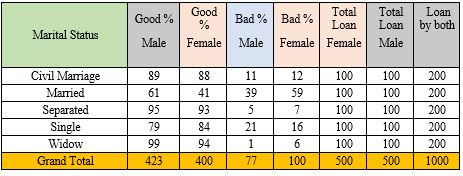

In [369]:
from IPython.display import Image
Image(filename='C:/Users/mrferozi/Desktop/Thesis 2019/Img/wed2.jpg')

#### German Dataset

In [370]:
df2.Martial_status.unique()

array([1, 3, 4, 2], dtype=int64)

In [371]:
def visualize_distribution(attr):
    Paid = df2[df2["Target"]==0]
    Unpaid = df2[df2["Target"]==1]
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15,5))
    attr_Paid = Paid[[attr, 'Target']].groupby(attr).count()
    attr_Unpaid = Unpaid[[attr, 'Target']].groupby(attr).count()
    ax[0].barh( attr_Paid['Target'].index.tolist(), attr_Paid['Target'].tolist(), align='center', color="#5975A4")
    ax[1].barh( attr_Unpaid['Target'].index.tolist(), attr_Unpaid['Target'].tolist(), align='center', color="#B55D60")
    ax[0].set_title('0')
    ax[1].set_title('1')
    ax[0].invert_xaxis()
    ax[1].yaxis.tick_right()
    
    num_para_change=["Present residence since","Number of existing credits at this bank","Installment rate in percentage of disposable income","Number of people being liable to provide maintenance for"]
    if attr in num_para_change:
        for i, v in enumerate(attr_Paid['Target'].tolist()):
            ax[0].text(v+15, i+1, str(v), color='black')
        for i, v in enumerate(attr_Unpaid['Target'].tolist()):
            ax[1].text(v+2, i+1, str(v), color='black')
    else:
        for i, v in enumerate(attr_Paid['Target'].tolist()):
            ax[0].text(v+25, i + .05, str(v), color='black')
        for i, v in enumerate(attr_Unpaid['Target'].tolist()):
            ax[1].text(v+1, i + .05, str(v), color='black')
    plt.suptitle(attr)
    plt.tight_layout()
    plt.show()

##### Martial_status

- female single represent by 1
- male:single represent by 2
- male:married/widowed represent by 3
- female:married/divorced/separated represent by 4

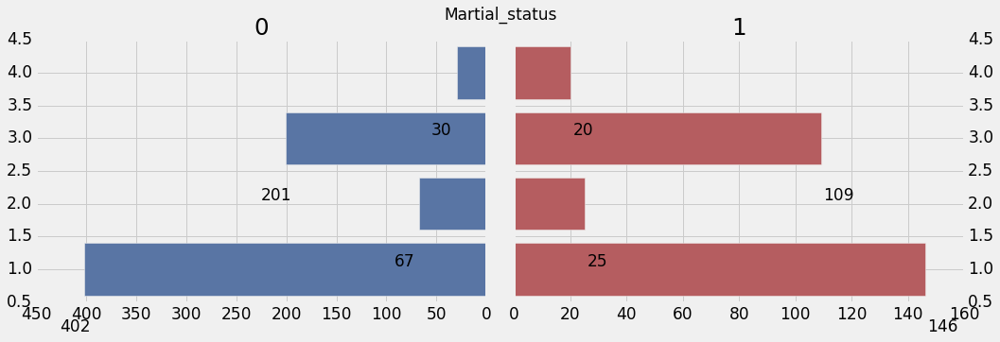

In [372]:
plt.figure(figsize = (10, 8))
visualize_distribution('Martial_status')

In [373]:
German.dtypes

Duration_month                int64
Credit_amount                 int64
Installment_rate%             int64
Gender                        int64
Present_res_lenght            int64
Age                           int32
Number_Credit                 int64
No_dependent                  int64
foreign_worker                int64
Target                        int64
Status_checking_account_0     uint8
Status_checking_account_1     uint8
Status_checking_account_2     uint8
Status_checking_account_3     uint8
Credit_history_0              uint8
Credit_history_1              uint8
Credit_history_2              uint8
Credit_history_3              uint8
Credit_history_4              uint8
Purpose_0                     uint8
Purpose_1                     uint8
Purpose_10                    uint8
Purpose_2                     uint8
Purpose_3                     uint8
Purpose_4                     uint8
Purpose_5                     uint8
Purpose_6                     uint8
Purpose_8                   

Martial_status
- female single represent by 1
- male:single represent by 2
- male:married/widowed//separated represent by 3
- female:married/divorced/separated represent by 4

In [374]:
#df['']=train[''].astype(int)
cols = ['TARGET','female_single','male_single','male_married_widowed_separated','female_married_widowed_separated']
df = pd.DataFrame(columns=cols)
df['TARGET']=German['Target'].astype(int)
df['female_single']=German['Martial_status_1'].astype(int)
df[ 'male_single']=German['Martial_status_2'].astype(int)
df['male_married_widowed_separated']=German['Martial_status_3'].astype(int)
df['female_married_widowed_separated']=German['Martial_status_4'].astype(int)

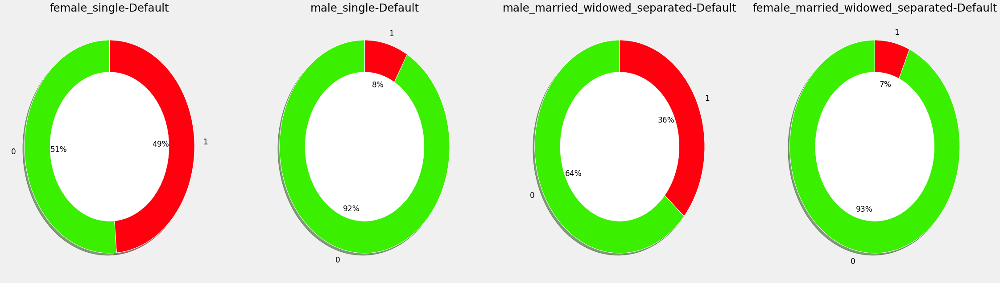

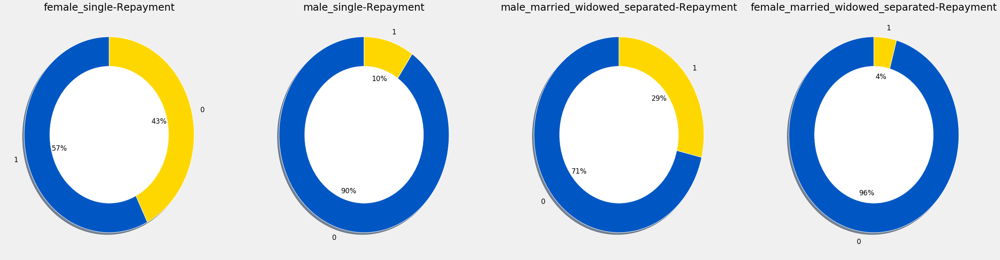

In [376]:
#from wordcloud import WordCloud,STOPWORDS
import io
import base64
import itertools
from matplotlib import rc,animation
from mpl_toolkits.mplot3d import Axes3D
#from mpl_toolkits.basemap import Basemap
#import folium
#import folium.plugins
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls

default = df[(df["TARGET"]==1)][['female_single','male_single','male_married_widowed_separated','female_married_widowed_separated']]
non_default = df[(df["TARGET"]==0)][['female_single','male_single','male_married_widowed_separated','female_married_widowed_separated']]

d_cols = ['female_single','male_single','male_married_widowed_separated','female_married_widowed_separated']
d_length = len(d_cols)

fig = plt.figure(figsize=(35,10))
for i,j in itertools.zip_longest(d_cols,range(d_length)):
    plt.subplot(1,4,j+1)
    default[i].value_counts().plot.pie(autopct = "%1.0f%%",colors = sns.color_palette("prism"),startangle = 90,
                                        wedgeprops={"linewidth":1,"edgecolor":"white"},shadow =True)
    circ = plt.Circle((0,0),.7,color="white")
    plt.gca().add_artist(circ)
    plt.ylabel("")
    plt.title(i+"-Default")
    
fig = plt.figure(figsize=(38,10))
for i,j in itertools.zip_longest(d_cols,range(d_length)):
    plt.subplot(1,4,j+1)
    non_default[i].value_counts().plot.pie(autopct = "%1.0f%%",colors = sns.color_palette("prism",3),startangle = 90,
                                           wedgeprops={"linewidth":1,"edgecolor":"white"},shadow =True)
    circ = plt.Circle((0,0),.7,color="white")
    plt.gca().add_artist(circ)
    plt.ylabel("")
    plt.title(i+"-Repayment")

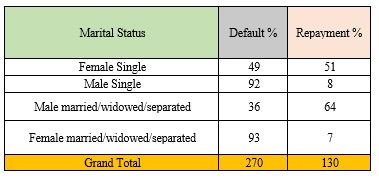

In [266]:
from IPython.display import Image
Image(filename='C:/Users/mrferozi/Desktop/Thesis 2019/Img/wed3.jpg')

### Taiwan Dataset

In [267]:
Taiwan.dtypes

LIMIT_BAL         float64
Gender              int64
EDUCATION           int64
Martial_Status      int64
AGE                 int32
PAY_0               int64
PAY_2               int64
PAY_3               int64
PAY_4               int64
PAY_5               int64
PAY_6               int64
BILL_AMT1         float64
BILL_AMT2         float64
BILL_AMT3         float64
BILL_AMT4         float64
BILL_AMT5         float64
BILL_AMT6         float64
PAY_AMT1          float64
PAY_AMT2          float64
PAY_AMT3          float64
PAY_AMT4          float64
PAY_AMT5          float64
PAY_AMT6          float64
Target              int64
Credit_Amount       int32
AGE_Group          object
dtype: object

In [268]:
def visualize_distribution(attr):
    Paid = Taiwan[Taiwan["Target"]==0]
    Unpaid = Taiwan[Taiwan["Target"]==1]
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15,5))
    attr_Paid = Paid[[attr, 'Target']].groupby(attr).count()
    attr_Unpaid = Unpaid[[attr, 'Target']].groupby(attr).count()
    ax[0].barh( attr_Paid['Target'].index.tolist(), attr_Paid['Target'].tolist(), align='center', color="#5975A4")
    ax[1].barh( attr_Unpaid['Target'].index.tolist(), attr_Unpaid['Target'].tolist(), align='center', color="#B55D60")
    ax[0].set_title('0')
    ax[1].set_title('1')
    ax[0].invert_xaxis()
    ax[1].yaxis.tick_right()
    
    num_para_change=["Present residence since","Number of existing credits at this bank","Installment rate in percentage of disposable income","Number of people being liable to provide maintenance for"]
    if attr in num_para_change:
        for i, v in enumerate(attr_Paid['Target'].tolist()):
            ax[0].text(v+15, i+1, str(v), color='black')
        for i, v in enumerate(attr_Unpaid['Target'].tolist()):
            ax[1].text(v+2, i+1, str(v), color='black')
    else:
        for i, v in enumerate(attr_Paid['Target'].tolist()):
            ax[0].text(v+25, i + .05, str(v), color='black')
        for i, v in enumerate(attr_Unpaid['Target'].tolist()):
            ax[1].text(v+1, i + .05, str(v), color='black')
    plt.suptitle(attr)
    plt.tight_layout()
    plt.show()

##### Marital status (MARRIAGE)

- Married represent by 1
- Single represent by 2
- Other represent by 3

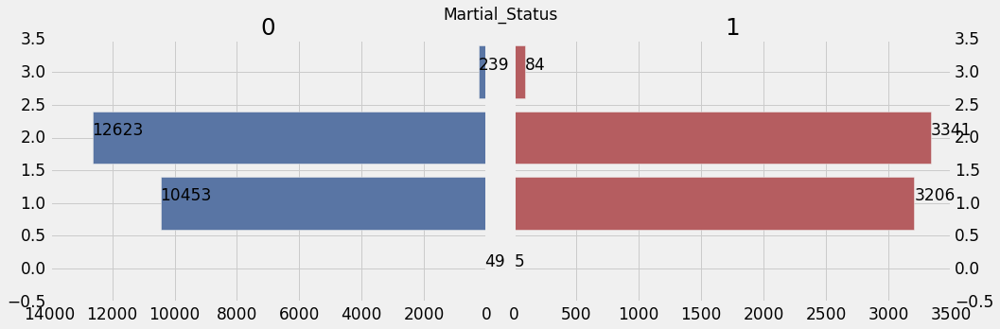

In [269]:
plt.figure(figsize = (10, 8))
visualize_distribution('Martial_Status')

In [270]:
Taiwan.Martial_Status.unique()

array([1, 2, 3, 0], dtype=int64)

In [271]:
cols = ['TARGET','Gender','Martial_Status']
df = pd.DataFrame(columns=cols)
df['Gender']=Taiwan['Gender']
df['Martial_Status']=Taiwan['Martial_Status']
df['TARGET']=Taiwan['Target'].astype(int)
df.Gender.replace(1,'male',inplace=True)
df.Gender.replace(2,'female',inplace=True)
df.Martial_Status.replace(1,'Married',inplace=True)
df.Martial_Status.replace(2,'Single',inplace=True)
df.Martial_Status.replace(3,'Other',inplace=True)
df.Martial_Status.replace(0,'Other',inplace=True)

In [272]:
df1=df
# preprocessing sklearn for categorical variables
from sklearn.preprocessing import LabelEncoder

tag_enc = LabelEncoder()
tag_count = 0

# Run through the columns
for col in df1:
    if df1[col].dtype == 'object':
        # If 2 or more unique categories
        if len(list(df1[col].unique())) <= 2:
            # Train  the training data
            tag_enc.fit(df1[col])
            # Transform both training and testing data
            df1[col] = tag_enc.transform(df1[col])
        
            # Follow the number of columns encoded for the label
            tag_count += 1
            
print('%d Label encoding of columns.' % tag_count)

1 Label encoding of columns.


In [273]:
df=df1

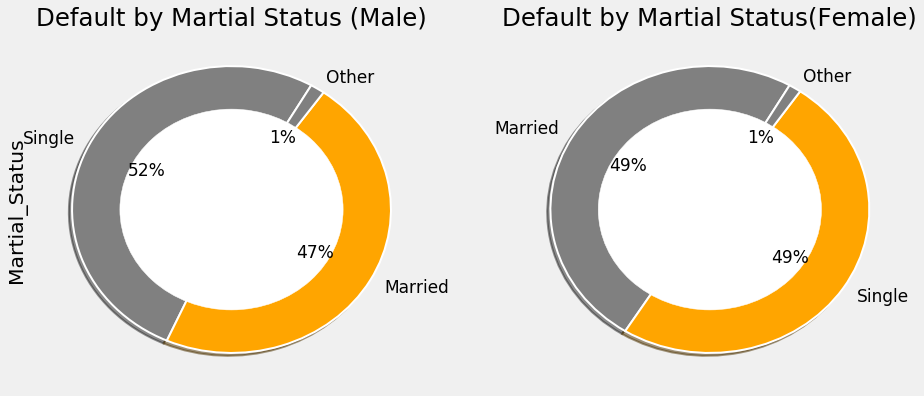

In [274]:
plt.figure(figsize=(14,6))
plt.subplot(121)
df[(df["TARGET"] == 1) & (df['Gender'] == 1)]["Martial_Status"].value_counts().plot.pie(autopct = "%1.0f%%",colors = ["grey","orange"],startangle = 60,
                                                                        wedgeprops={"linewidth":2,"edgecolor":"white"},shadow =True)
circ = plt.Circle((0,0),.7,color="white")
plt.gca().add_artist(circ) 
plt.title("Default by Martial Status (Male)")

plt.subplot(122)
df[(df["TARGET"] == 1) & (df['Gender'] == 0)]["Martial_Status"].value_counts().plot.pie(autopct = "%1.0f%%",colors = ["grey","orange"],startangle = 60,
                                                                        wedgeprops={"linewidth":2,"edgecolor":"white"},shadow =True)
circ = plt.Circle((0,0),.7,color="white")
plt.gca().add_artist(circ)
plt.ylabel("")
plt.title("Default by Martial Status(Female)")
plt.show()

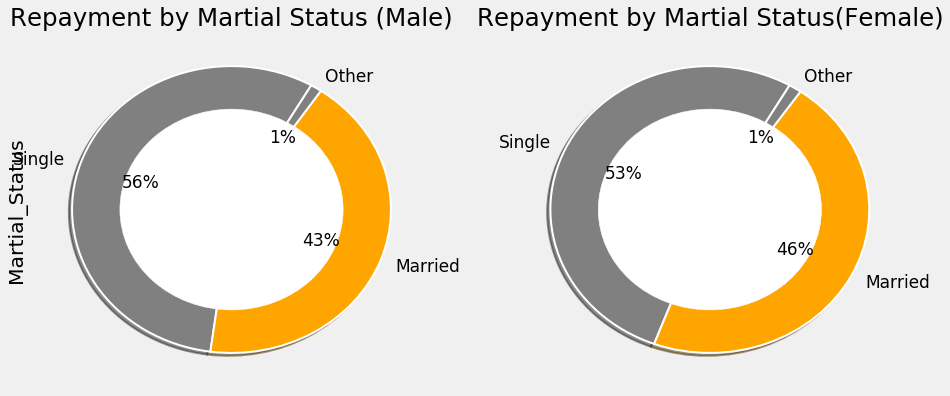

In [275]:
plt.figure(figsize=(14,6))
plt.subplot(121)
df[(df["TARGET"] == 0) & (df['Gender'] == 1)]["Martial_Status"].value_counts().plot.pie(autopct = "%1.0f%%",colors = ["grey","orange"],startangle = 60,
                                                                        wedgeprops={"linewidth":2,"edgecolor":"white"},shadow =True)
circ = plt.Circle((0,0),.7,color="white")
plt.gca().add_artist(circ) 
plt.title("Repayment by Martial Status (Male)")

plt.subplot(122)
df[(df["TARGET"] == 0) & (df['Gender'] == 0)]["Martial_Status"].value_counts().plot.pie(autopct = "%1.0f%%",colors = ["grey","orange"],startangle = 60,
                                                                        wedgeprops={"linewidth":2,"edgecolor":"white"},shadow =True)
circ = plt.Circle((0,0),.7,color="white")
plt.gca().add_artist(circ)
plt.ylabel("")
plt.title("Repayment by Martial Status(Female)")
plt.show()

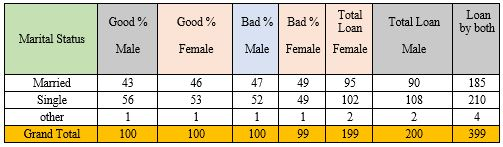

In [276]:
from IPython.display import Image
Image(filename='C:/Users/mrferozi/Desktop/Thesis 2019/Img/wed4.jpg')

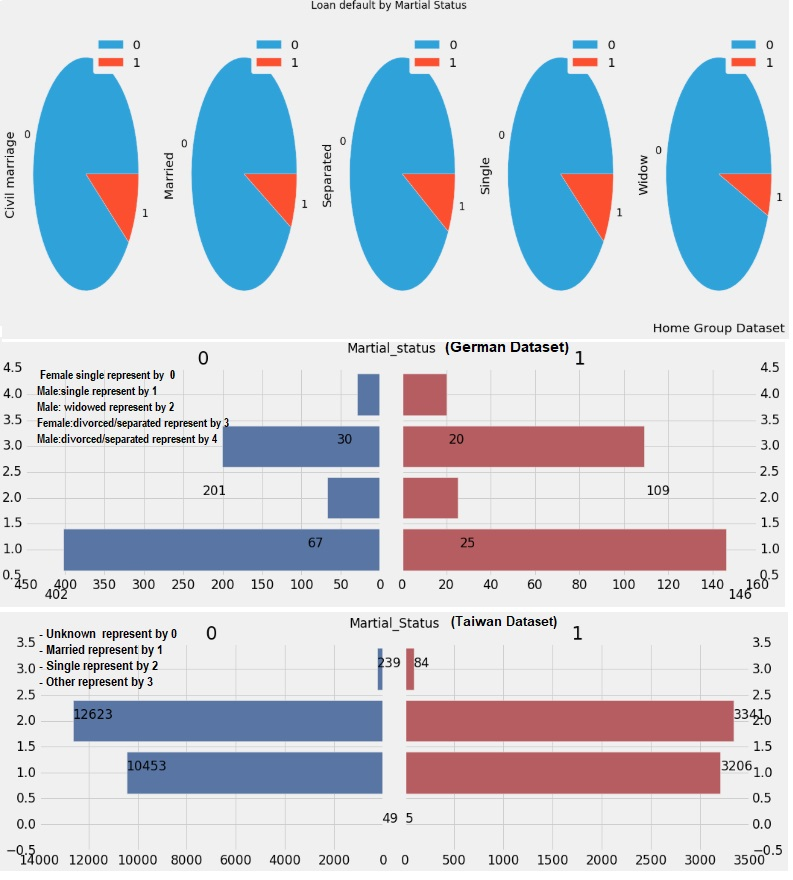

In [277]:
from IPython.display import Image
Image(filename='C:/Users/mrferozi/Desktop/Thesis 2019/Img/wed.jpg')

From the mention graph is displaying a quite interesting pattern. It shows that the single people are not very good to keep their financial mater in order. But, in the same time couple with civil marriages exposing the same tendencies. Another interesting trend is found between married and separated people. It indicates that both categories people have the same degree of involvement when it is coming to loan repayment. It is neat to see that widows are more conscious about their loan repayment.

# Effect of Various other Variables

### German Dataset (Residency)

##### Foreign worker
- Foreign worker =  1
- Local Resident = 0 

In [278]:
foreign_worker_counts = German.groupby('foreign_worker').aggregate(sum)
foreign_worker_counts

,Duration_month,Credit_amount,Installment_rate%,Gender,Present_res_lenght,Age,Number_Credit,No_dependent,Target,Status_checking_account_0,...,Housing_1,Housing_2,Job_0,Job_1,Job_2,Job_3,Martial_status_1,Martial_status_2,Martial_status_3,Martial_status_4
foreign_worker,,,,,,,,,,,,,,,,,,,,,
0,459,94382,91,30,94,1298,51,48,4,13.0,...,28.0,9.0,2.0,19.0,14.0,2.0,23.0,6.0,7.0,1.0
1,20444,3176876,2882,660,2751,34222,1356,1107,296,381.0,...,685.0,170.0,146.0,611.0,186.0,20.0,525.0,86.0,303.0,49.0


In [279]:
df = pd.DataFrame(foreign_worker_counts)

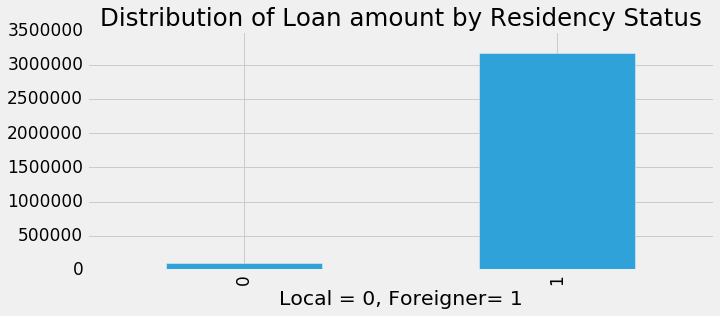

In [280]:
df.Credit_amount.plot.bar(figsize = (10, 4),title='Distribution of Loan amount by Residency Status')
plt.xlabel('Local = 0, Foreigner= 1')

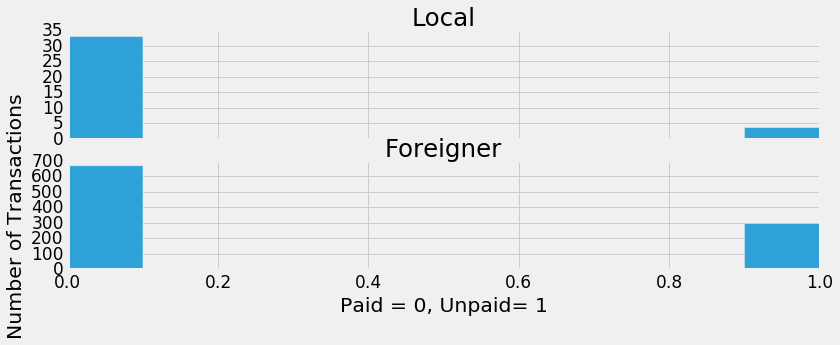

In [281]:
f, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(12,4))

bins = 10

ax1.hist(German.Target[German.foreign_worker == 0], bins = bins)
ax1.set_title('Local')

ax2.hist(German.Target[German.foreign_worker == 1], bins = bins)
ax2.set_title('Foreigner')

plt.xlabel('Paid = 0, Unpaid= 1')
plt.ylabel('Number of Transactions')

plt.show()

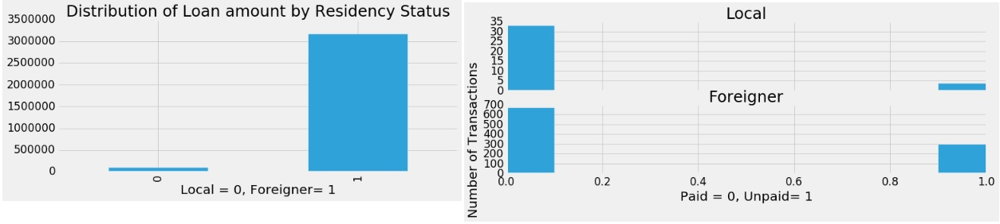

In [282]:
from IPython.display import Image
Image(filename='C:/Users/mrferozi/Desktop/Thesis 2019/Img/res.jpg')

### German Dataset (Dependent)

In [283]:
Dependents_counts = German.groupby('No_dependent').aggregate(sum)
Dependents_counts

,Duration_month,Credit_amount,Installment_rate%,Gender,Present_res_lenght,Age,Number_Credit,foreign_worker,Target,Status_checking_account_0,...,Housing_1,Housing_2,Job_0,Job_1,Job_2,Job_3,Martial_status_1,Martial_status_2,Martial_status_3,Martial_status_4
No_dependent,,,,,,,,,,,,,,,,,,,,,
1,17767,2746710,2541,549,2387,29532,1166,819,254,331.0,...,607.0,160.0,127.0,551.0,148.0,19.0,412.0,90.0,296.0,47.0
2,3136,524548,432,141,458,5988,241,144,46,63.0,...,106.0,19.0,21.0,79.0,52.0,3.0,136.0,2.0,14.0,3.0


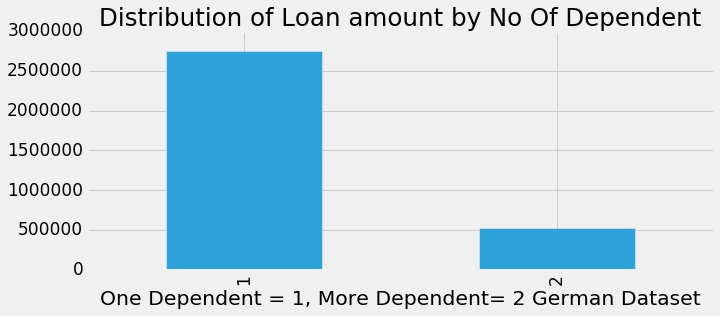

In [284]:
df = pd.DataFrame(Dependents_counts)
df.Credit_amount.plot.bar(figsize = (10, 4),title='Distribution of Loan amount by No Of Dependent')
plt.xlabel('One Dependent = 1, More Dependent= 2 German Dataset')

In [285]:
German.No_dependent.unique()

array([1, 2], dtype=int64)

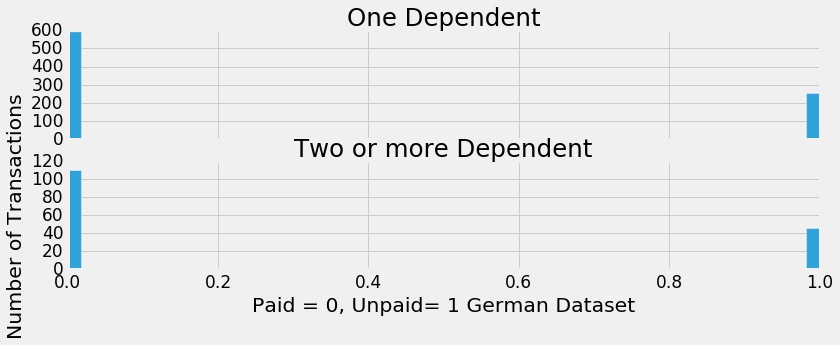

In [286]:
f, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(12,4))

bins = 55

ax1.hist(German.Target[German.No_dependent == 1], bins = bins)
ax1.set_title('One Dependent')

ax2.hist(German.Target[German.No_dependent == 2], bins = bins)
ax2.set_title('Two or more Dependent')

plt.xlabel('Paid = 0, Unpaid= 1 German Dataset')
plt.ylabel('Number of Transactions')

plt.show()

### Taiwan Dataset (Dependent)

In [287]:
Taiwan.dtypes

LIMIT_BAL         float64
Gender              int64
EDUCATION           int64
Martial_Status      int64
AGE                 int32
PAY_0               int64
PAY_2               int64
PAY_3               int64
PAY_4               int64
PAY_5               int64
PAY_6               int64
BILL_AMT1         float64
BILL_AMT2         float64
BILL_AMT3         float64
BILL_AMT4         float64
BILL_AMT5         float64
BILL_AMT6         float64
PAY_AMT1          float64
PAY_AMT2          float64
PAY_AMT3          float64
PAY_AMT4          float64
PAY_AMT5          float64
PAY_AMT6          float64
Target              int64
Credit_Amount       int32
AGE_Group          object
dtype: object

### Home Group Dataset (Dependent)

In [288]:
#train.CNT_CHILDREN.unique()
CNT_CHILDREN_counts = train.groupby('CNT_CHILDREN').aggregate(sum)
CNT_CHILDREN_counts

,NAME_CONTRACT_TYPE,FLAG_OWN_CAR,FLAG_OWN_REALTY,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,TARGET,DAYS_EMPLOYED_ANOM,Age
CNT_CHILDREN,,,,,,,,,,,,,,,,,,,,,
0,18918,66222,149789,3.581377e+10,1.290294e+11,5.795150e+09,1.161092e+11,4539.723621,3680530984,-406835788.0,...,5535.0,1607.0,460.0,20256.0,803.0,4912.0,900.0,16609,53460.0,1.008365e+07
1,7065,24613,41989,1.073644e+10,3.640494e+10,1.678263e+09,3.251832e+10,1256.544429,836140617,-127631024.0,...,1914.0,755.0,204.0,8095.0,344.0,1211.0,329.0,5454,1421.0,2.290796e+06
2,2856,11847,18458,4.616362e+09,1.617852e+10,7.424326e+08,1.447026e+10,537.390346,356425875,-57258606.0,...,927.0,264.0,81.0,3296.0,141.0,506.0,94.0,2333,384.0,9.765092e+05
3,386,1674,2665,6.465657e+08,2.259548e+09,1.044295e+08,2.018862e+09,72.450650,50591267,-8149290.0,...,140.0,24.0,6.0,406.0,16.0,71.0,23.0,358,88.0,1.386062e+05
4,47,177,322,7.294005e+07,2.652175e+08,1.221539e+07,2.358787e+08,8.670489,6006406,-967797.0,...,16.0,1.0,0.0,40.0,1.0,16.0,0.0,55,15.0,1.645591e+04
5,5,39,62,1.493352e+07,4.800272e+07,2.322387e+06,4.207500e+07,1.707063,1224160,-212190.0,...,5.0,1.0,0.0,4.0,0.0,3.0,1.0,7,3.0,3.353863e+03
6,1,8,15,3.026250e+06,1.099846e+07,5.223105e+05,9.333000e+06,0.281818,329117,-46824.0,...,0.0,0.0,0.0,2.0,0.0,0.0,0.0,6,2.0,9.016904e+02
7,0,1,4,9.585000e+05,3.205611e+06,1.631880e+05,2.794500e+06,0.132165,105269,-7337.0,...,0.0,0.0,0.0,1.0,0.0,2.0,0.0,0,0.0,2.884082e+02
8,0,2,1,2.160000e+05,9.950400e+05,5.366700e+04,9.000000e+05,0.037536,26364,-9795.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0,0.0,7.223014e+01


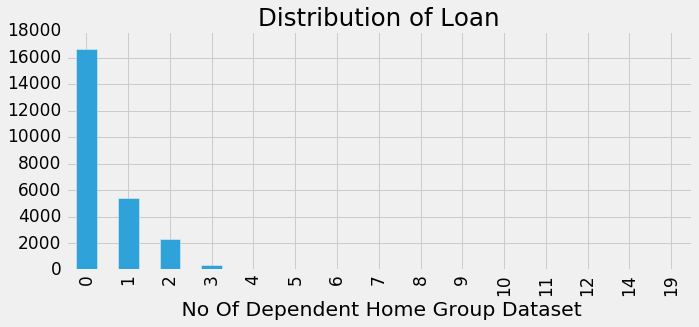

In [289]:
df = pd.DataFrame(CNT_CHILDREN_counts)
df.TARGET.plot.bar(figsize = (10, 4),title='Distribution of Loan')
plt.xlabel(' No Of Dependent Home Group Dataset')

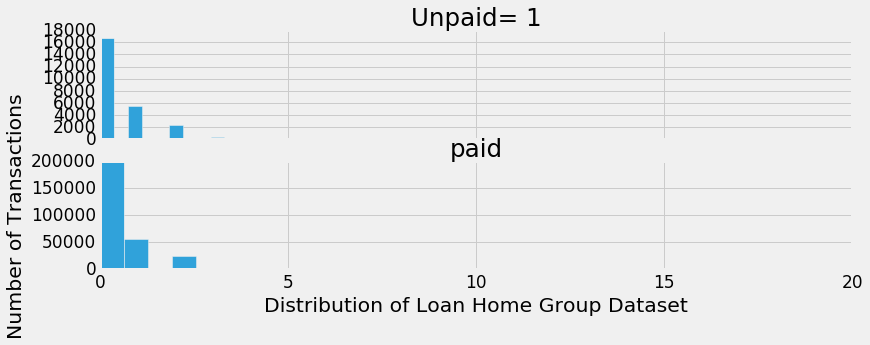

In [290]:
f, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(12,4))

bins = 30

ax1.hist(train.CNT_CHILDREN[train.TARGET == 1], bins = bins)
ax1.set_title('Unpaid= 1')

ax2.hist(train.CNT_CHILDREN[train.TARGET == 0], bins = bins)
ax2.set_title('paid')

plt.xlabel('Distribution of Loan Home Group Dataset')
plt.ylabel('Number of Transactions')

plt.show()

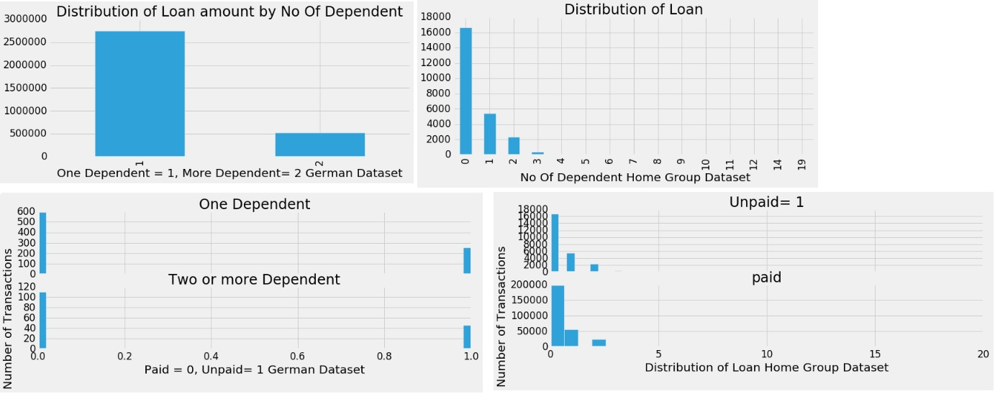

In [291]:
from IPython.display import Image
Image(filename='C:/Users/mrferozi/Desktop/Thesis 2019/Img/dep.jpg')

### Home Group (Housing)

In [292]:
#df['']=train[''].astype(int)
cols = ['TARGET','Apartment','House','Municipal_apartment','Office_apartment','Rented_apartment','With_parents']
df = pd.DataFrame(columns=cols)
df['TARGET']=train['TARGET'].astype(int)
df['Apartment']=train['NAME_HOUSING_TYPE_Co-op apartment'].astype(int)
df['House']=train['NAME_HOUSING_TYPE_House / apartment'].astype(int)
df['Municipal_apartment']=train['NAME_HOUSING_TYPE_Municipal apartment'].astype(int)
df['Office_apartment']=train['NAME_HOUSING_TYPE_Office apartment'].astype(int)
df['Rented_apartment']=train['NAME_HOUSING_TYPE_Rented apartment'].astype(int)
df['With_parents']=train['NAME_HOUSING_TYPE_With parents'].astype(int)

In [293]:
TARGET_counts = df.groupby('TARGET').aggregate(sum)
TARGET_counts

,Apartment,House,Municipal_apartment,Office_apartment,Rented_apartment,With_parents
TARGET,,,,,,
0,1033,251596,10228,2445,4280,13104
1,89,21272,955,172,601,1736


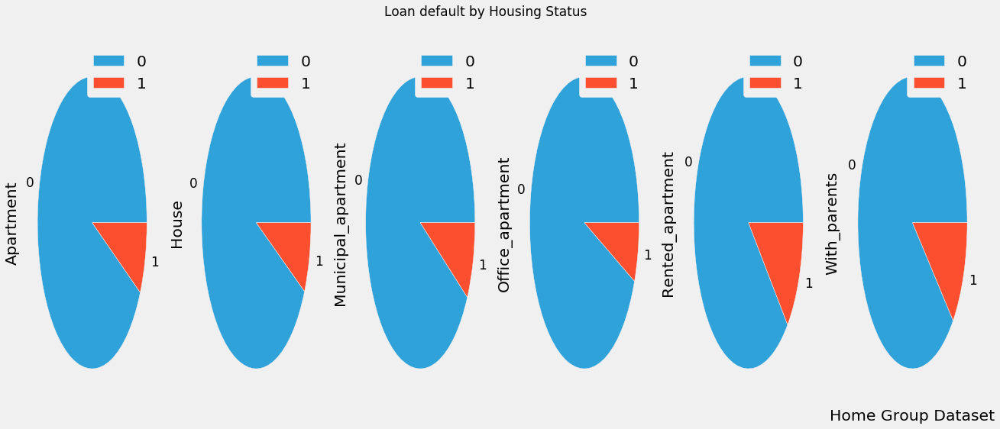

In [294]:
TARGET_counts = df.groupby('TARGET').aggregate(sum)
a= TARGET_counts.plot(kind='pie',figsize=(20, 8), title='Loan default by Housing Status',subplots=True)
b=plt.xlabel('Home Group Dataset')

### German Dataset (Housing)
- Free/ with parents represent by  0
- Home Owner represent by 1
- Rented accomodation represent by 2

In [295]:
#df['']=train[''].astype(int)
cols = ['TARGET','with_Parent_Free','Home_Owner','Rented_Accomodation']
df = pd.DataFrame(columns=cols)
df['TARGET']=German['Target'].astype(int)
df['with_Parent_Free']=German['Housing_0'].astype(int)
df['Home_Owner']=German['Housing_1'].astype(int)
df['Rented_Accomodation']=German['Housing_2'].astype(int)

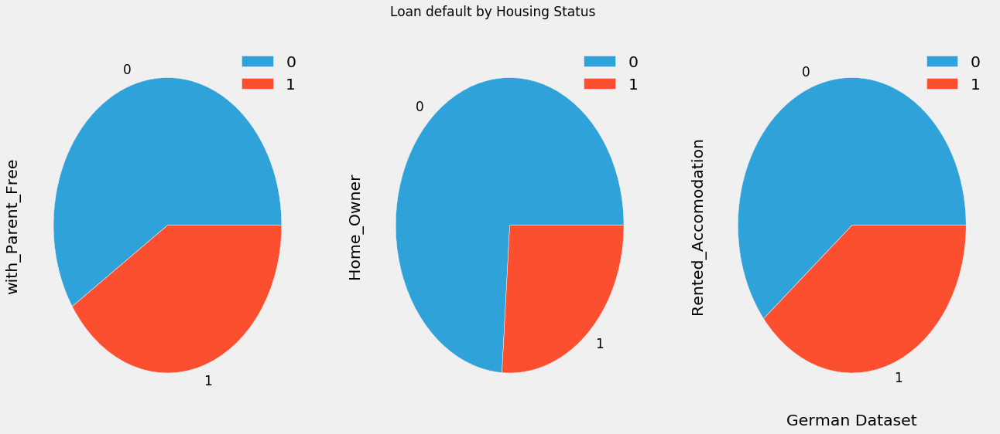

In [296]:
TARGET_counts = df.groupby('TARGET').aggregate(sum)
a= TARGET_counts.plot(kind='pie',figsize=(20, 8), title='Loan default by Housing Status',subplots=True)
b=plt.xlabel('German Dataset')

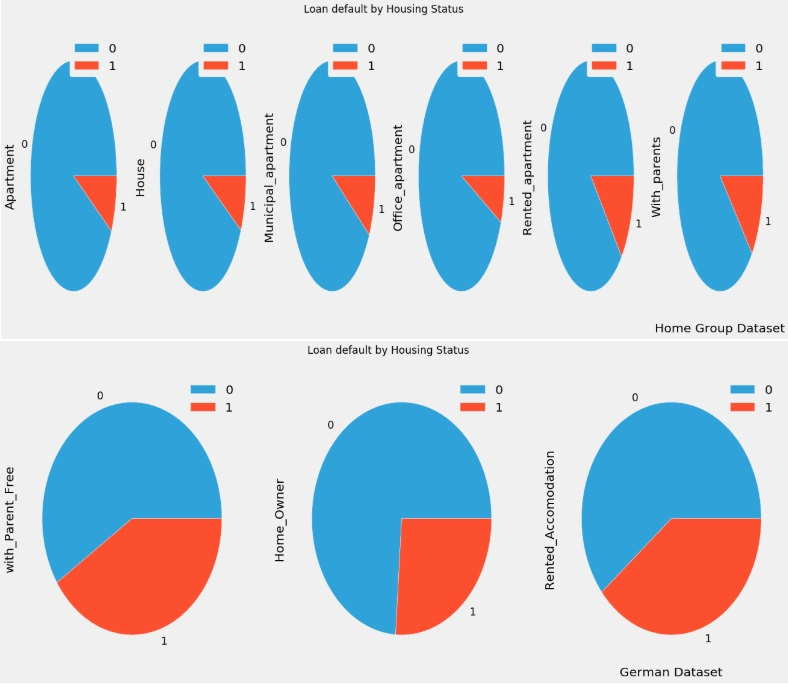

In [297]:
from IPython.display import Image
Image(filename='C:/Users/mrferozi/Desktop/Thesis 2019/Img/hos.jpg')

### Home Group (Lenght of Employment)

In [298]:
#df['']=train[''].astype(int)
cols = ['TARGET','YEAR_EMPLOYED']
df = pd.DataFrame(columns=cols)
df['TARGET']=train['TARGET'].astype(int)
df['YEAR_EMPLOYED']=train['DAYS_EMPLOYED'] / -365
# fill in missing values with a specified value
df['YEAR_EMPLOYED'].fillna(value='0', inplace=True)
df['YEAR_EMPLOYED']=df['YEAR_EMPLOYED'].astype(float)
df['YEAR_EMPLOYED']=df['YEAR_EMPLOYED'].astype(int)

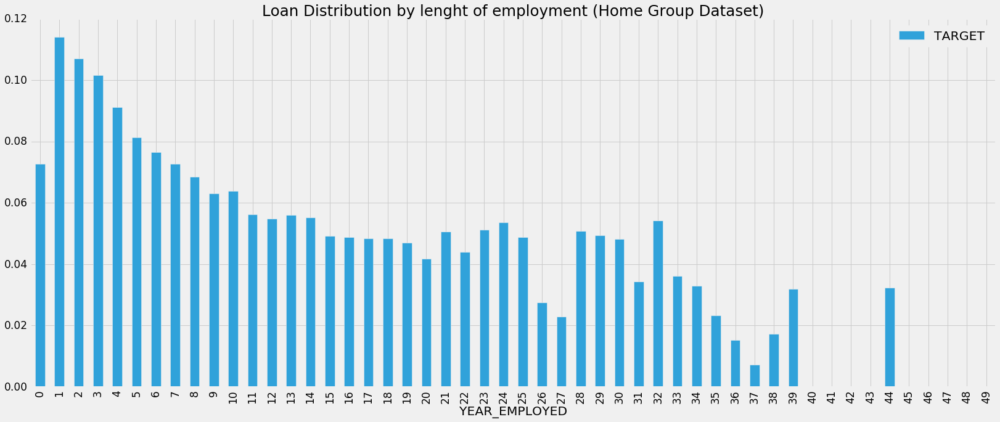

In [299]:
plt.figure(figsize = (20, 15))
df.groupby('YEAR_EMPLOYED').mean().plot(kind='bar', title='Loan Distribution by lenght of employment (Home Group Dataset)')

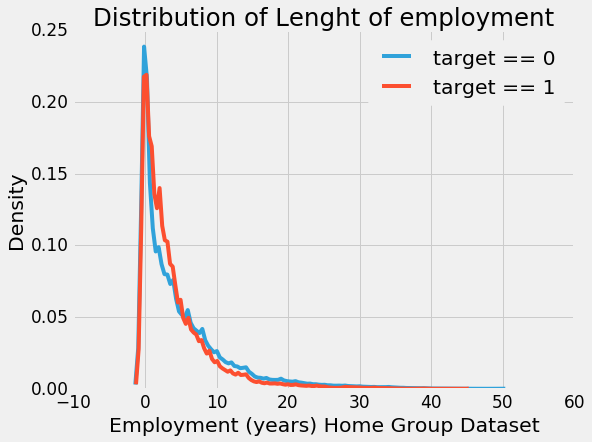

In [300]:
plt.figure(figsize = (8, 6))

# KDE plot of loans that were repaid on time
sns.kdeplot(df.loc[df['TARGET'] == 0, 'YEAR_EMPLOYED'], label = 'target == 0')

# KDE plot of loans that were repaid on time
sns.kdeplot(df.loc[df['TARGET'] == 1, 'YEAR_EMPLOYED'], label = 'target == 1')

# Labeling of plot
plt.xlabel('Employment (years) Home Group Dataset'); plt.ylabel('Density'); plt.title('Distribution of Lenght of employment');

### German Dataset (Lenght of Employment)

#### Present_employment
- '>=7' years represent by  8
- 4<= <7 years represent by 7
- 1<= < 4 years represent by 4
- <1 years represent by 1
- unemployed represent by 0

In [380]:
df2 = pd.read_csv('C:/Users/mrferozi/Desktop/Thesis 2019/Dataset/German_credit_risk/German_credit_risk1.csv')

In [381]:
df2.dtypes

Status_checking_account    int64
Duration_month             int64
Credit_history             int64
Purpose                    int64
Credit_amount              int64
Savings_account/bonds      int64
Present_emp_lenght         int64
Installment_rate%          int64
Gender                     int64
Guarantors                 int64
Present_res_lenght         int64
Property                   int64
Age                        int64
Other_installment_plans    int64
Housing                    int64
Number_Credit              int64
Job                        int64
No_dependent               int64
foreign_worker             int64
Target                     int64
Martial_status             int64
dtype: object

In [382]:
df2.Present_emp_lenght.unique()

array([8, 4, 7, 0, 1], dtype=int64)

In [383]:
df3 = pd.DataFrame()
df3['YEAR_EMPLOYED']=df2['Present_emp_lenght'].astype(int)
df3['TARGET']=df2['Target'].astype(int)

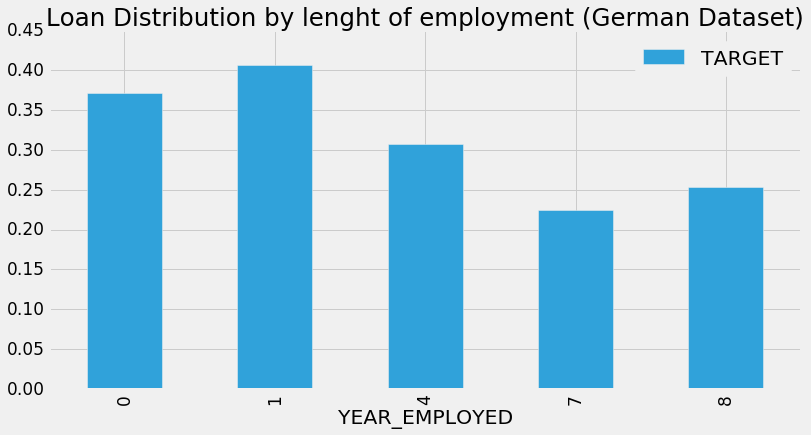

In [384]:
df3.groupby('YEAR_EMPLOYED').mean().plot(kind='bar',figsize = (12, 6), title='Loan Distribution by lenght of employment (German Dataset)')

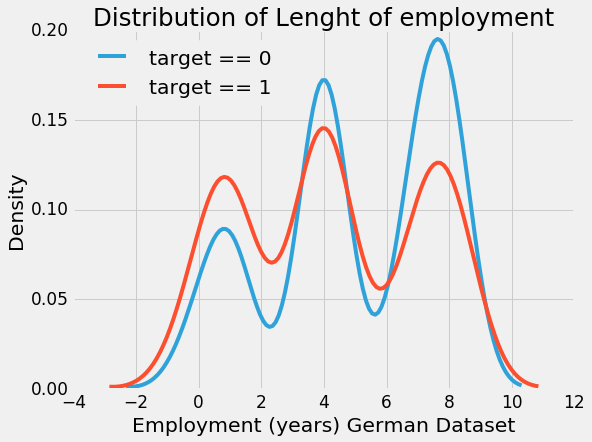

In [385]:
plt.figure(figsize = (8, 6))

# KDE plot of loans that were repaid on time
sns.kdeplot(df3.loc[df3['TARGET'] == 0, 'YEAR_EMPLOYED'], label = 'target == 0')

# KDE plot of loans that were repaid on time
sns.kdeplot(df3.loc[df3['TARGET'] == 1, 'YEAR_EMPLOYED'], label = 'target == 1')

# Labeling of plot
plt.xlabel('Employment (years) German Dataset'); plt.ylabel('Density'); plt.title('Distribution of Lenght of employment');

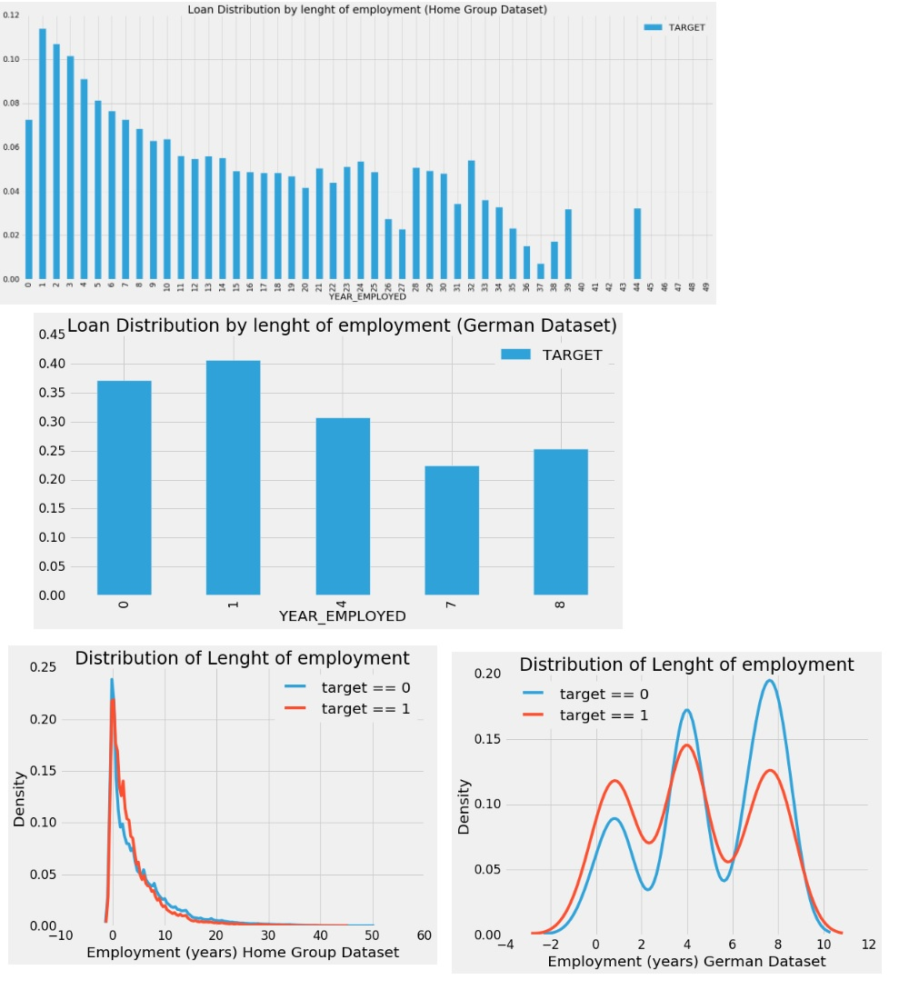

In [386]:
from IPython.display import Image
Image(filename='C:/Users/mrferozi/Desktop/Thesis 2019/Img/emp.jpg')

#### Home Group (Credit Amount/AMT_CREDIT)

In [387]:
train.head(10)

,NAME_CONTRACT_TYPE,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,...,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,TARGET,DAYS_EMPLOYED_ANOM,Age,Age_Group
0,0,0,1,0,202500.0,406597.5,24700.5,351000.0,0.018801,9461,...,0,0,0,0,0,0,1,False,25.920548,Young_Male
1,0,0,0,0,270000.0,1293502.5,35698.5,1129500.0,0.003541,16765,...,0,0,0,0,0,0,0,False,45.931507,Senior_Female
2,1,1,1,0,67500.0,135000.0,6750.0,135000.0,0.010032,19046,...,0,0,0,0,0,0,0,False,52.180822,Senior_Male
3,0,0,1,0,135000.0,312682.5,29686.5,297000.0,0.008019,19005,...,0,0,0,0,0,0,0,False,52.068493,Senior_Female
4,0,0,1,0,121500.0,513000.0,21865.5,513000.0,0.028663,19932,...,0,0,0,0,0,0,0,False,54.608219,Senior_Male
5,0,0,1,0,99000.0,490495.5,27517.5,454500.0,0.035792,16941,...,0,0,0,0,0,0,0,False,46.413699,Senior_Male
6,0,1,1,1,171000.0,1560726.0,41301.0,1395000.0,0.035792,13778,...,0,0,0,0,0,0,0,False,37.747945,Young_Adults_Female
7,0,1,1,0,360000.0,1530000.0,42075.0,1530000.0,0.003122,18850,...,0,0,0,0,0,0,0,False,51.643836,Senior_Male
8,0,0,1,0,112500.0,1019610.0,33826.5,913500.0,0.018634,20099,...,0,0,0,0,0,0,0,True,55.065753,Elder_Female
9,1,0,1,0,135000.0,405000.0,20250.0,405000.0,0.019689,14469,...,0,0,0,0,0,0,0,False,39.641096,Young_Adults_Male


In [388]:
train.groupby('TARGET').AMT_CREDIT.agg(['count', 'mean', 'min', 'max']).astype(int)

,count,mean,min,max
TARGET,,,,
0,282686,602648,45000,4050000
1,24825,557778,45000,4027680


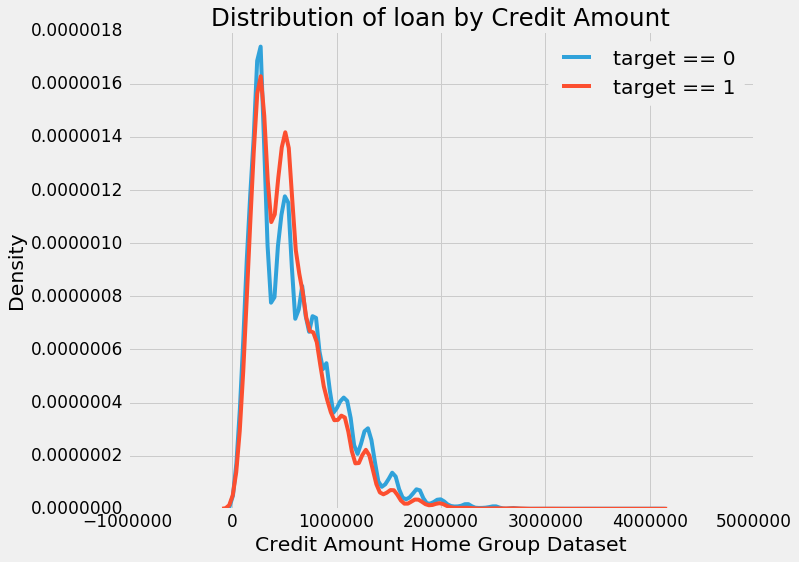

In [389]:
df=train
plt.figure(figsize = (10, 8))

# KDE plot of loans that were repaid on time
sns.kdeplot(df.loc[df['TARGET'] == 0, 'AMT_CREDIT'], label = 'target == 0')

# KDE plot of loans that were repaid on time
sns.kdeplot(df.loc[df['TARGET'] == 1, 'AMT_CREDIT'], label = 'target == 1')

# Labeling of plot
plt.xlabel('Credit Amount Home Group Dataset'); plt.ylabel('Density'); plt.title('Distribution of loan by Credit Amount');

#### German Dataset (Credit Amount)

In [390]:
German.groupby('Target').Credit_amount.agg(['count', 'mean', 'min', 'max']).astype(int)

,count,mean,min,max
Target,,,,
0,700,2985,250,15857
1,300,3938,433,18424


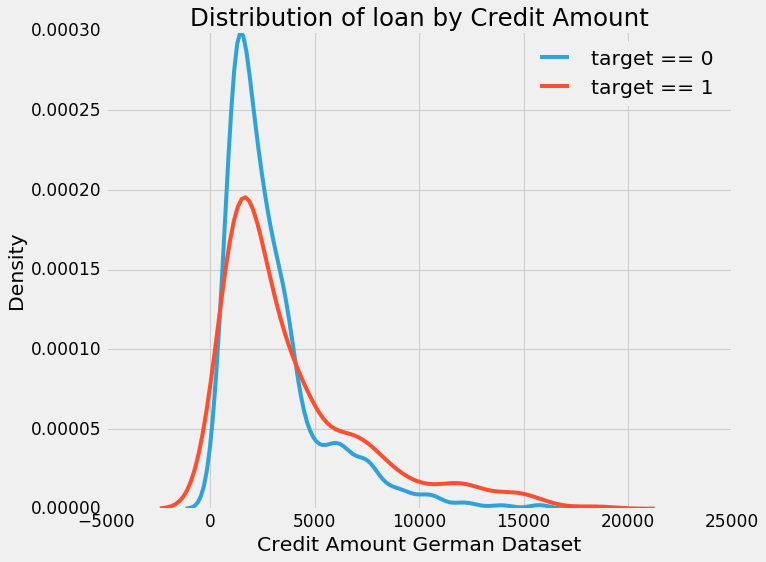

In [391]:
df=German
plt.figure(figsize = (10, 8))

# KDE plot of loans that were repaid on time
sns.kdeplot(df.loc[df['Target'] == 0, 'Credit_amount'], label = 'target == 0')

# KDE plot of loans that were repaid on time
sns.kdeplot(df.loc[df['Target'] == 1, 'Credit_amount'], label = 'target == 1')

# Labeling of plot
plt.xlabel('Credit Amount German Dataset'); plt.ylabel('Density'); plt.title('Distribution of loan by Credit Amount');

In [392]:
# Display data
#Taiwan = pd.read_csv('C:/Users/mrferozi/Desktop/Thesis 2019/Dataset/Credit_Risk-master/Credit_Risk-master/credit_risk.csv')

#print('Shape of the Taiwan Credit risk dataset: ', Taiwan.shape)
Taiwan.dtypes

LIMIT_BAL         float64
Gender              int64
EDUCATION           int64
Martial_Status      int64
AGE                 int32
PAY_0               int64
PAY_2               int64
PAY_3               int64
PAY_4               int64
PAY_5               int64
PAY_6               int64
BILL_AMT1         float64
BILL_AMT2         float64
BILL_AMT3         float64
BILL_AMT4         float64
BILL_AMT5         float64
BILL_AMT6         float64
PAY_AMT1          float64
PAY_AMT2          float64
PAY_AMT3          float64
PAY_AMT4          float64
PAY_AMT5          float64
PAY_AMT6          float64
Target              int64
Credit_Amount       int32
AGE_Group          object
dtype: object

In [395]:
df = pd.DataFrame()
df['Target']=Taiwan['Target'].astype(int)
df['Credit_Amount']=Taiwan['BILL_AMT1'] +Taiwan['BILL_AMT2'] + Taiwan['BILL_AMT3'] + Taiwan['BILL_AMT4'] + Taiwan['BILL_AMT5'] + Taiwan['BILL_AMT6']
df['Credit_Amount']=df['Credit_Amount'].astype(int)

In [396]:
df.groupby('Target').Credit_Amount.agg(['count', 'mean', 'min', 'max']).astype(int)

,count,mean,min,max
Target,,,,
0,23364,272428,-125480,5263883
1,6636,260822,-336259,3127490


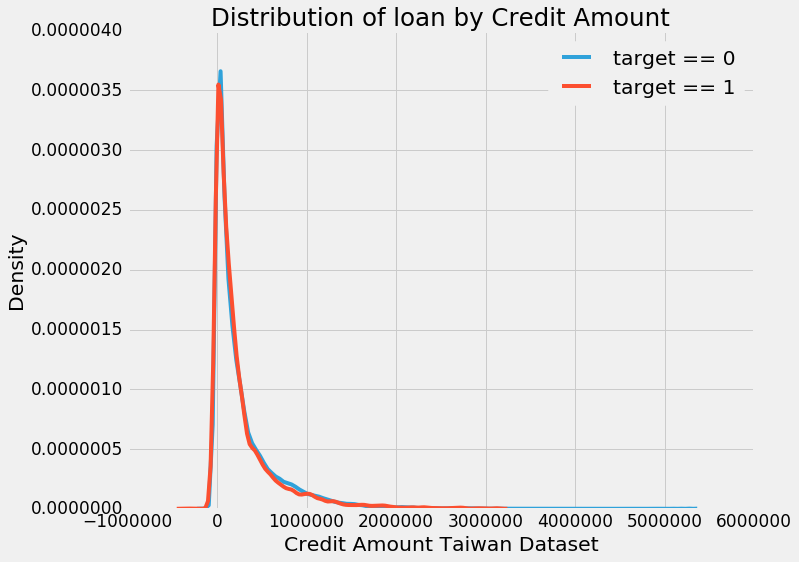

In [397]:
plt.figure(figsize = (10, 8))

# KDE plot of loans that were repaid on time
sns.kdeplot(df.loc[df['Target'] == 0, 'Credit_Amount'], label = 'target == 0')

# KDE plot of loans that were repaid on time
sns.kdeplot(df.loc[df['Target'] == 1, 'Credit_Amount'], label = 'target == 1')

# Labeling of plot
plt.xlabel('Credit Amount Taiwan Dataset'); plt.ylabel('Density'); plt.title('Distribution of loan by Credit Amount');

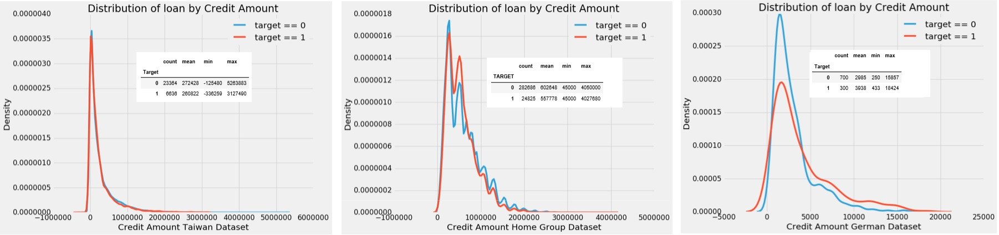

In [398]:
from IPython.display import Image
Image(filename='C:/Users/mrferozi/Desktop/Thesis 2019/Img/credit.jpg')

## Resources
References:*From the video series: [Introduction to machine learning with scikit-learn](https://github.com/justmarkham/scikit-learn-videos)*
- German Credit Risk Analysis : Beginner's Guide: [ Beginner's Guide ](https://www.kaggle.com/pahulpreet/german-credit-risk-analysis-beginner-s-guide/notebook) 


- scikit-learn documentation: [Cross-validation](http://scikit-learn.org/stable/modules/cross_validation.html), [Model evaluation](http://scikit-learn.org/stable/modules/model_evaluation.html)
- scikit-learn issue on GitHub: [MSE is negative when returned by cross_val_score](https://github.com/scikit-learn/scikit-learn/issues/2439)
- Section 5.1 of [An Introduction to Statistical Learning](http://www-bcf.usc.edu/~gareth/ISL/) (11 pages) and related videos: [K-fold and leave-one-out cross-validation](https://www.youtube.com/watch?v=nZAM5OXrktY) (14 minutes), [Cross-validation the right and wrong ways](https://www.youtube.com/watch?v=S06JpVoNaA0) (10 minutes)
- Scott Fortmann-Roe: [Accurately Measuring Model Prediction Error](http://scott.fortmann-roe.com/docs/MeasuringError.html)
- Machine Learning Mastery: [An Introduction to Feature Selection](http://machinelearningmastery.com/an-introduction-to-feature-selection/)
- Harvard CS109: [Cross-Validation: The Right and Wrong Way](https://github.com/cs109/content/blob/master/lec_10_cross_val.ipynb)
- Journal of Cheminformatics: [Cross-validation pitfalls when selecting and assessing regression and classification models](http://www.jcheminf.com/content/pdf/1758-2946-6-10.pdf)